## 1. UV-Vis Spectra of Run 1 and Run 2

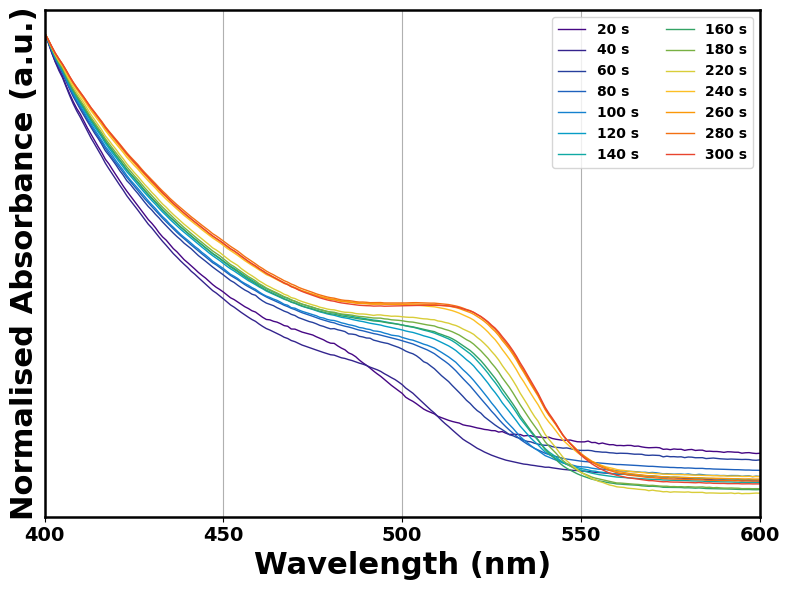

In [10]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ---------------- Settings ----------------
csv_path = "Run 1 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

    # --- build meta with parsed times; keep original index for stable fallback ---
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # sort: first all with finite times by time ascending, then NaNs by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # --- strictly purple→red colormap (custom, independent of external cmap_name) ---
    # endpoints chosen for clear perceptual ramp from violet/purple to red
    purple_red = LinearSegmentedColormap.from_list(
        "purple_red_strict",
        ["#6A1B9A",  "#7E57C2",  "#AB47BC",  "#EF5350",  "#D32F2F"]
    )

    # evenly spaced unique colours across the gradient
    positions = np.linspace(0.03, 0.97, N)
    label_to_color = {label: purple_red(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.tight_layout()
plt.savefig('Run 1 UV-Vis Spectra.png', dpi=1200)
plt.show()

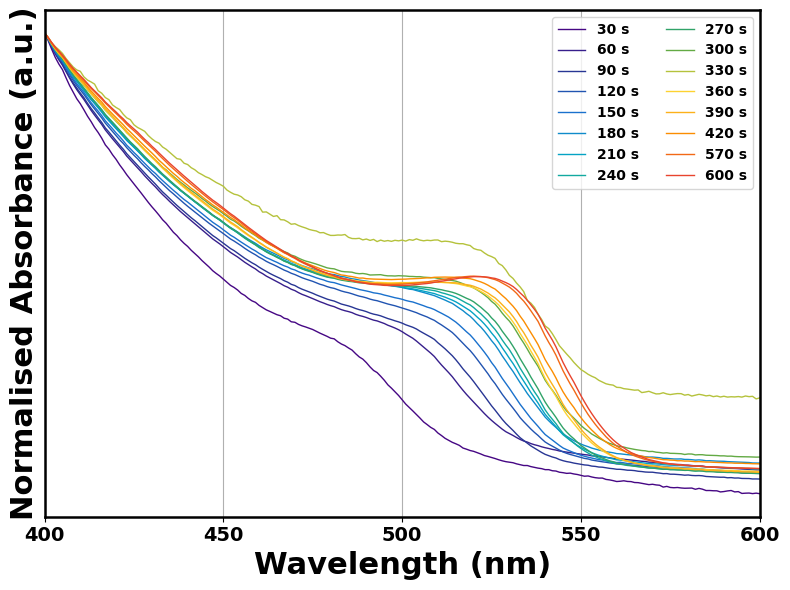

In [11]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps


# ---------------- Settings ----------------
csv_path = "Run 2 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.tight_layout()
plt.savefig('Run 2 UV-Vis Spectra.png', dpi=12)
plt.show()

## 2. Emission Spectra of Run 2

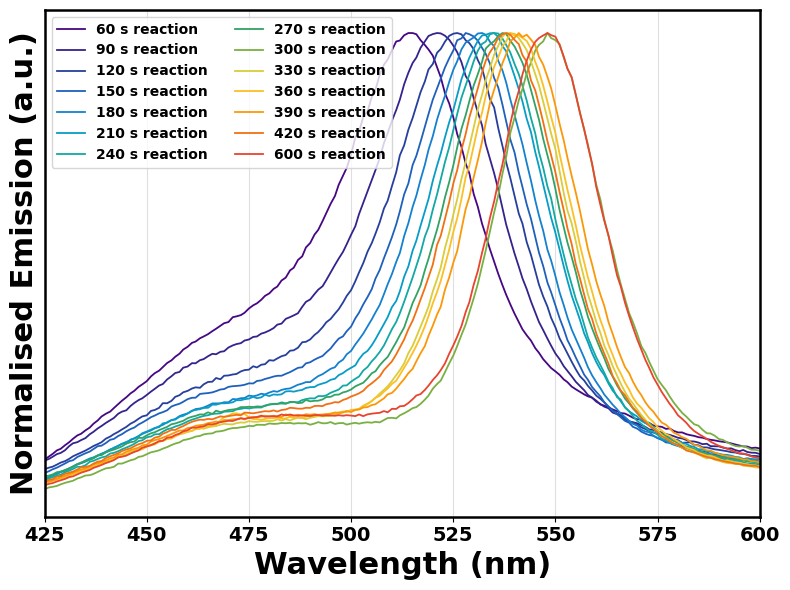

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color
# ---------------------------------------------------------------------------

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 2 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
wl_min, wl_max = 425, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 25), fontsize=14, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 2 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
60 s reaction              514.42          270         quadratic_vertex
90 s reaction              521.00        273.4         quadratic_vertex
120 s reaction             525.45        214.8         quadratic_vertex
150 s reaction             528.38        291.4         quadratic_vertex
180 s reaction             530.87        314.9         quadratic_vertex
210 s reaction             533.68        324.4         quadratic_vertex
240 s reaction             534.90        244.3         quadratic_vertex
270 s reaction             536.89        241.2         quadratic_vertex
300 s reaction             548.24        216.6         quadratic_vertex
330 s reaction             539.29        310.4         quadratic_vertex
360 s reaction             540.39        281.1         quadratic_vertex
390 s reaction             541.95        300.2         quadratic_vertex
420 s reaction             537.85        220.8         quadratic

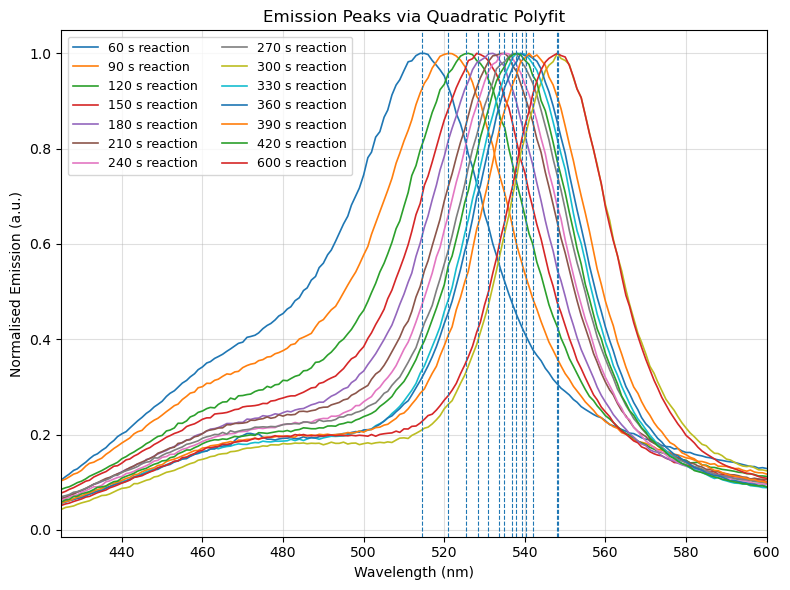

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 2 FL emission.csv"   # your tidy emission file
wl_min     = 425                             # analysis window (nm)
wl_max     = 600
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

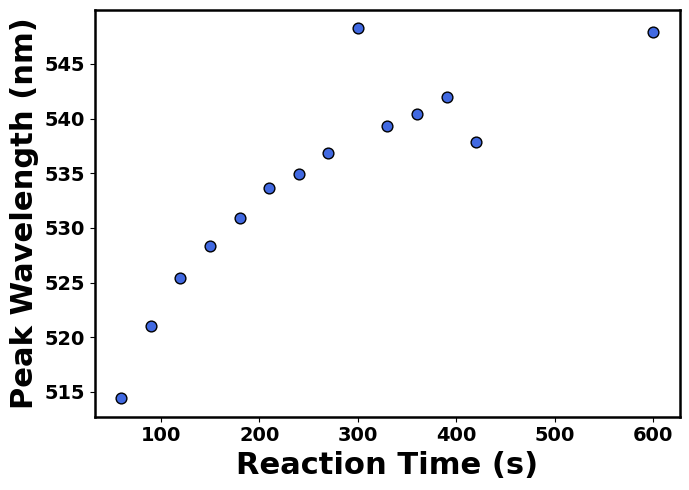

In [13]:
import re
import pandas as pd
import matplotlib.pyplot as plt

reaction_time = np.array([60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 600])
peak_nm = np.array([514.420656343781, 521.0042088795213, 525.4458259531331, 528.3807348792882, 
                    530.8663584452114, 533.6798083428876, 534.9011216754149, 536.8868502486249, 
                    548.2372751609313, 539.2898312370979, 540.3875508366742, 541.954902019266, 
                    537.8512515597013, 547.87039541785]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 2 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 546.296 ± 3.356 nm
  A     = 45.768 ± 5.499 nm
  k     = 0.00632 ± 0.00188 s⁻¹
  R²    = 0.9012


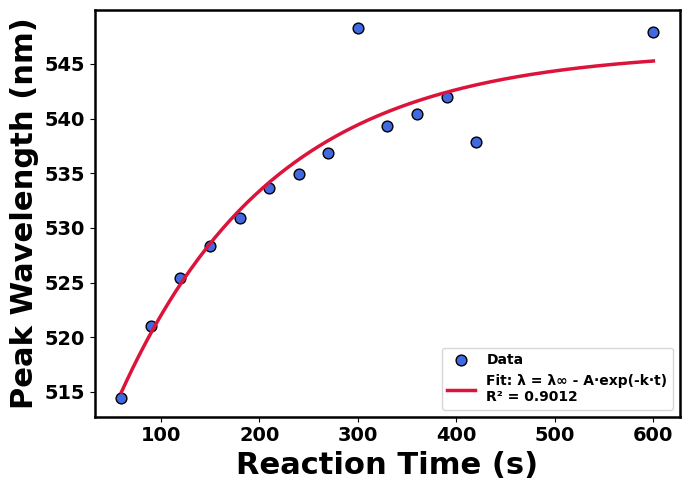

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 600])
peak_nm = np.array([514.420656343781, 521.0042088795213, 525.4458259531331, 528.3807348792882, 
                    530.8663584452114, 533.6798083428876, 534.9011216754149, 536.8868502486249, 
                    548.2372751609313, 539.2898312370979, 540.3875508366742, 541.954902019266, 
                    537.8512515597013, 547.87039541785]) 
# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color='crimson', lw=2.5, label=f'Fit: λ = λ∞ - A·exp(-k·t)\nR² = {r2:.4f}')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 2 Emission Peak Values vs Reaction time Exponential Fit", dpi = 1200)
plt.show()

/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/2081020063.py:53: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


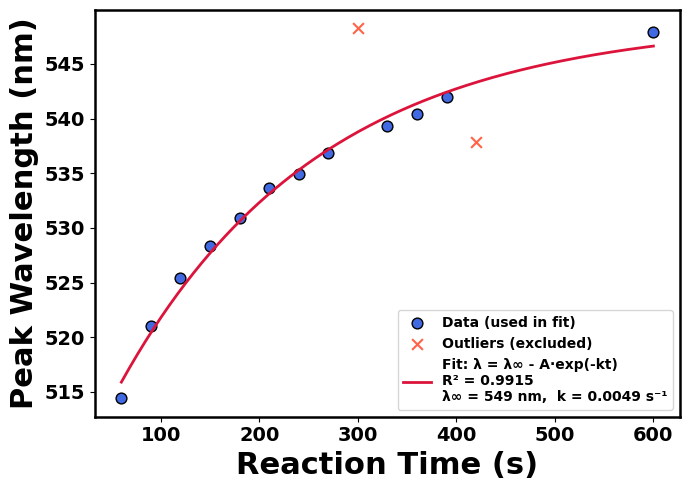

λ_inf = 548.972 ± 1.443 nm
A     = 44.389 ± 1.373 nm
k     = 0.00490 ± 0.00049 s⁻¹
R²    = 0.9915


In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==== your data ====
reaction_time = np.array([60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 600])
peak_nm = np.array([514.420656343781, 521.0042088795213, 525.4458259531331, 528.3807348792882, 
                    530.8663584452114, 533.6798083428876, 534.9011216754149, 536.8868502486249, 
                    548.2372751609313, 539.2898312370979, 540.3875508366742, 541.954902019266, 
                    537.8512515597013, 547.87039541785])


# ==== define your exponential saturation model ====
def exp_saturation(t, lam_inf, A, k):
    return lam_inf - A * np.exp(-k * t)

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [8, 12]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# ==== perform the fit on the non-outlier data ====
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]
popt, pcov = curve_fit(exp_saturation,
                       reaction_time[mask],
                       peak_nm[mask],
                       p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# ==== calculate R² ====
residuals = peak_nm[mask] - exp_saturation(reaction_time[mask], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm[mask] - np.mean(peak_nm[mask]))**2)
r2 = 1 - (ss_res / ss_tot)

# ==== make fit curve ====
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# ==== plot ====
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

# fitted line
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
#plt.title("Exponential Fit with Manual Outlier Exclusion", fontsize=16, fontweight='bold')
#plt.grid(True, alpha=0.4)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()


plt.savefig("Run 2 Emission Peak Values vs Reaction time Exponential Fit with Manual Outlier Exclusion", dpi = 1200)
plt.show()

# ==== print fitted parameters ====
print(f"λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"R²    = {r2:.4f}")

## 4. UV-Vis Spectra of Run 3-6

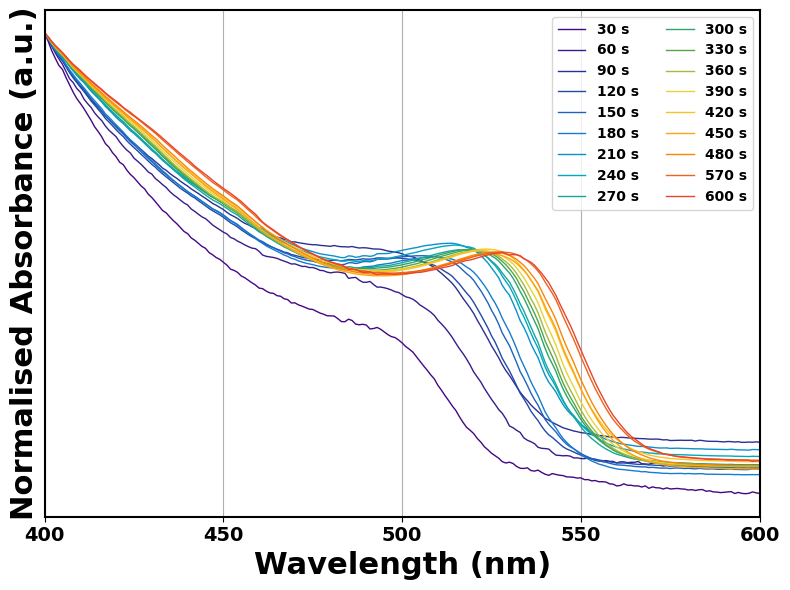

In [16]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------------- Settings ----------------
csv_path = "Run 3 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 3 UV-Vis Spectra.png', dpi=1200)
plt.show()

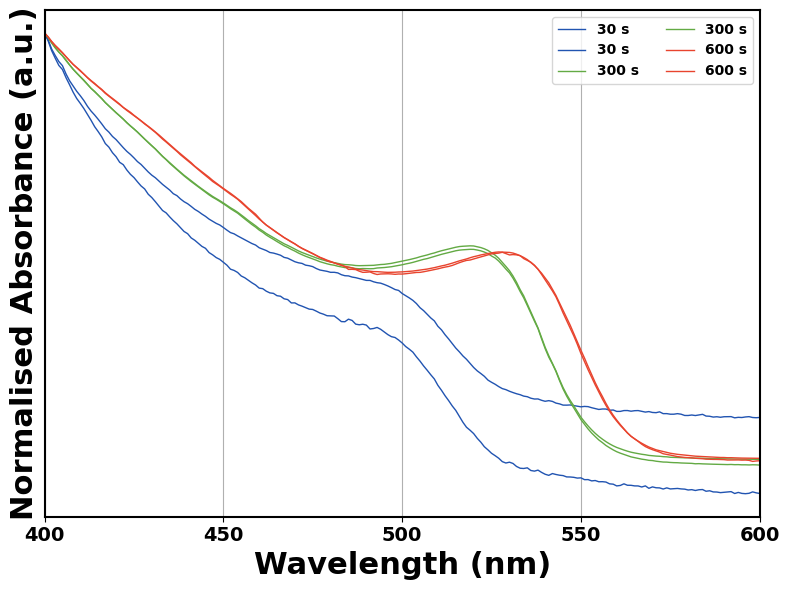

In [70]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------------- Settings ----------------
csv_path = "Run 3 overnight full comparison.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color
# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 3 UV-Vis Spectra Overnight Check.png', dpi=1200)
plt.show()

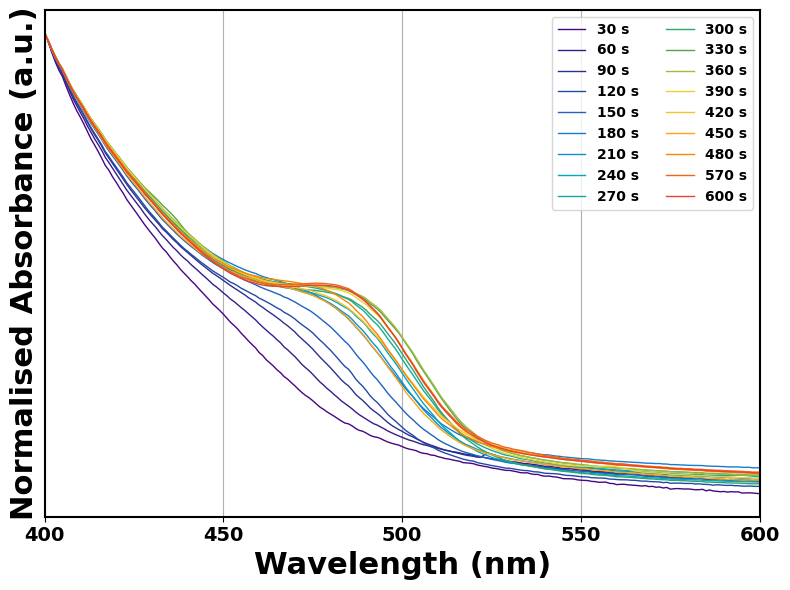

In [17]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------------- Settings ----------------
csv_path = "Run 4 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 4 UV-Vis Spectra.png', dpi=1200)
plt.show()

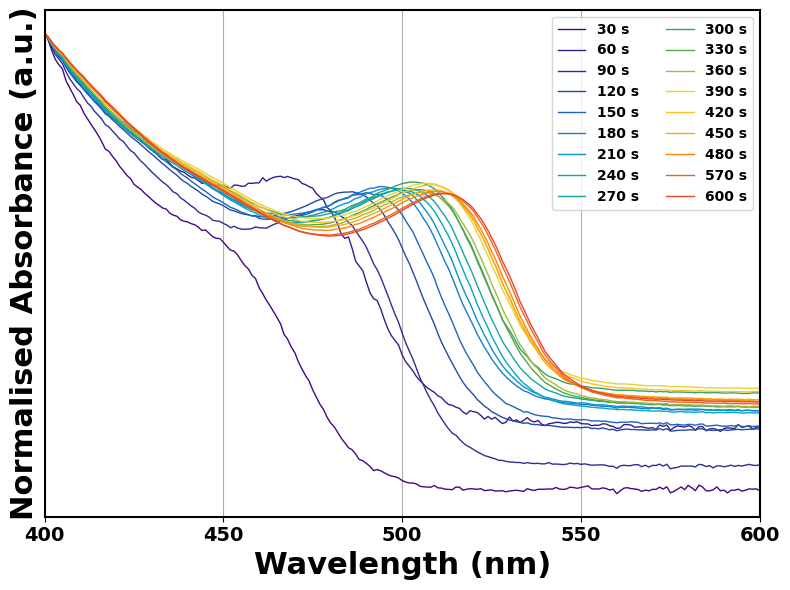

In [18]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------------- Settings ----------------
csv_path = "Run 5 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 5 UV-Vis Spectra.png', dpi=1200)
plt.show()

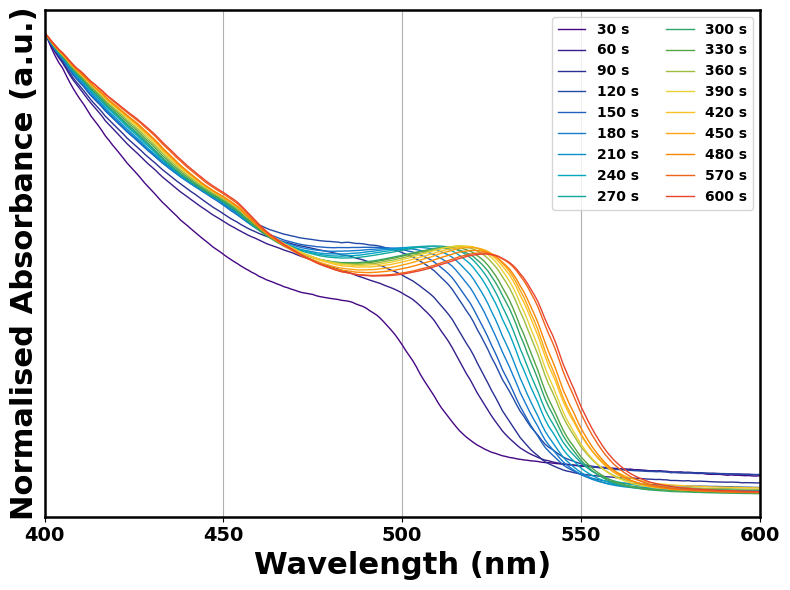

In [19]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------------- Settings ----------------
csv_path = "Run 6 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.tight_layout()
plt.savefig('Run 6 UV-Vis Spectra.png', dpi=1200)
plt.show()

## 5. Emission Spectra for Run 3-6

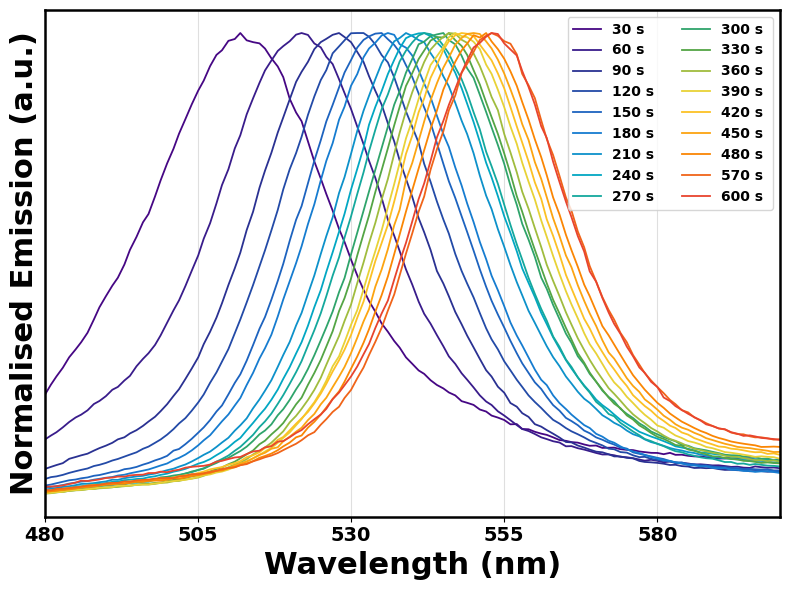

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color
# ---------------------------------------------------------------------------

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 3 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 480, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 25), fontsize=14, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 3 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       512.31        108.1         quadratic_vertex
60 s                       521.68        190.5         quadratic_vertex
90 s                       527.27        228.6         quadratic_vertex
120 s                      531.11        328.7         quadratic_vertex
150 s                      534.33        287.3         quadratic_vertex
180 s                      536.23        259.3         quadratic_vertex
210 s                      539.76        343.1         quadratic_vertex
240 s                      541.58        338.9         quadratic_vertex
270 s                      542.41        348.5         quadratic_vertex
300 s                      544.40        308.2         quadratic_vertex
330 s                      545.24        336.2         quadratic_vertex
360 s                      546.40        330.7         quadratic_vertex
390 s                      547.87        298.3         quadratic

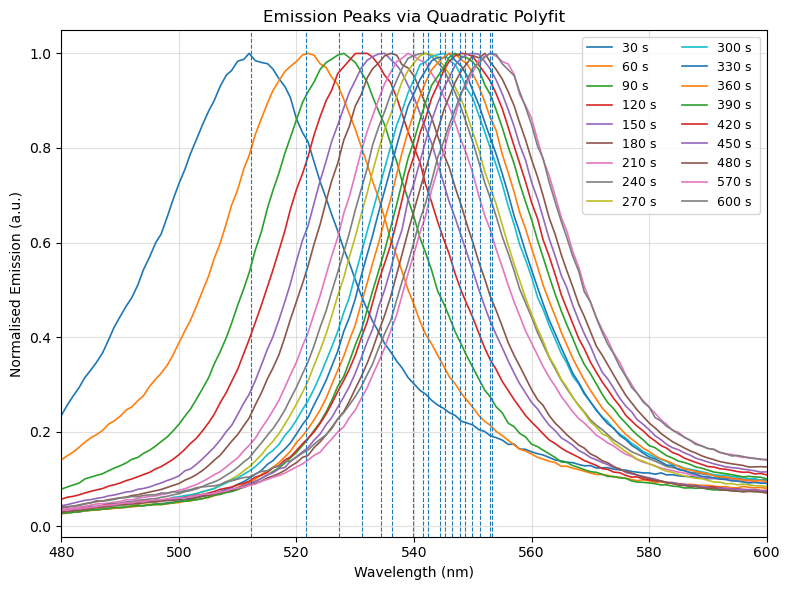

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 3 FL emission.csv"   # your tidy emission file
wl_min     = 480                             # analysis window (nm)
wl_max     = 600
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

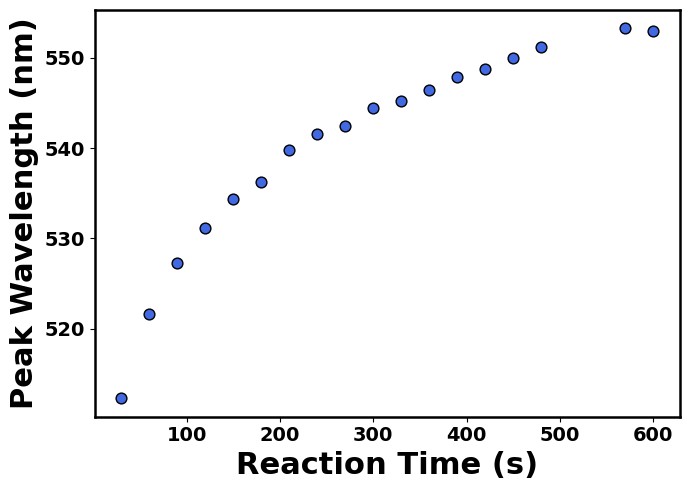

In [21]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 
                    534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 
                    542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 
                    547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 
                    553.2294869997208, 552.9586670594164]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 3 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 553.785 ± 0.918 nm
  A     = 46.301 ± 1.131 nm
  k     = 0.00555 ± 0.00040 s⁻¹
  R²    = 0.9915


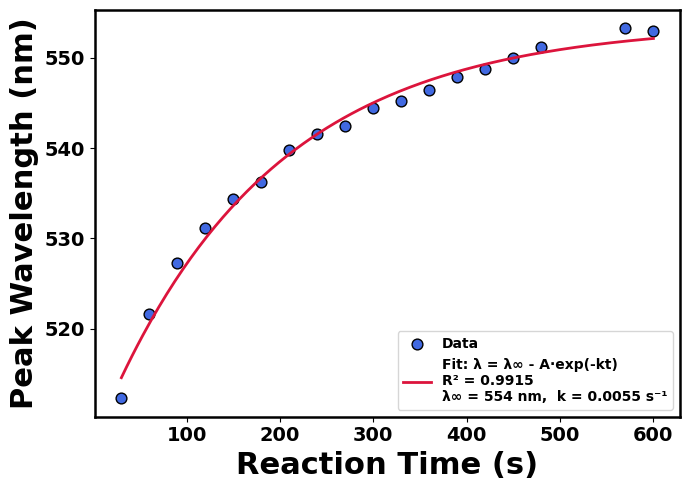

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 
                    534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 
                    542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 
                    547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 
                    553.2294869997208, 552.9586670594164]) 
# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 3 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

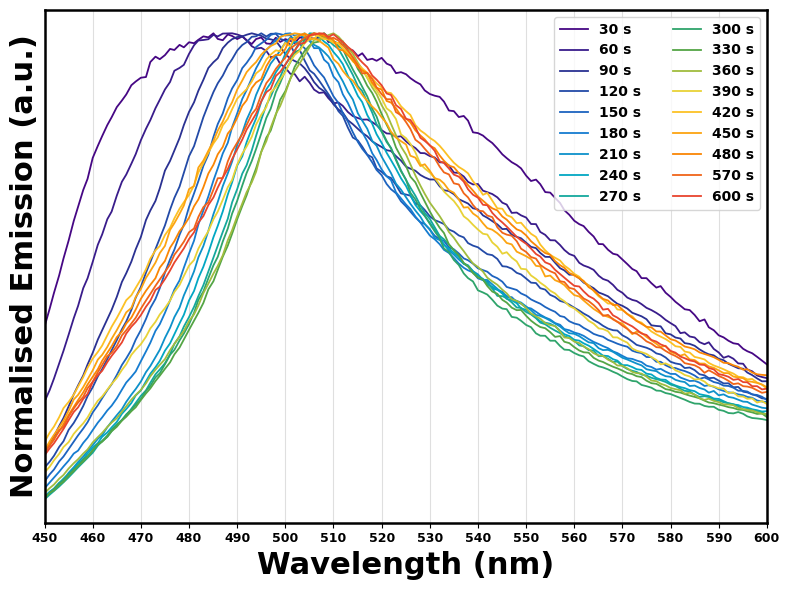

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 4 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 450, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 4 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       488.47        71.19         quadratic_vertex
60 s                       488.00        103.8         quadratic_vertex
90 s                       493.53        154.3         quadratic_vertex
120 s                      496.36        124.9         quadratic_vertex
150 s                      498.94        198.3         quadratic_vertex
180 s                      501.65        224.3         quadratic_vertex
210 s                      503.51        213.3         quadratic_vertex
240 s                      505.42        194.1         quadratic_vertex
270 s                      506.54        208.4         quadratic_vertex
300 s                      507.25        184.3         quadratic_vertex
330 s                      508.69        205.8         quadratic_vertex
360 s                      509.21        182.5         quadratic_vertex
390 s                      507.86        140.9         quadratic

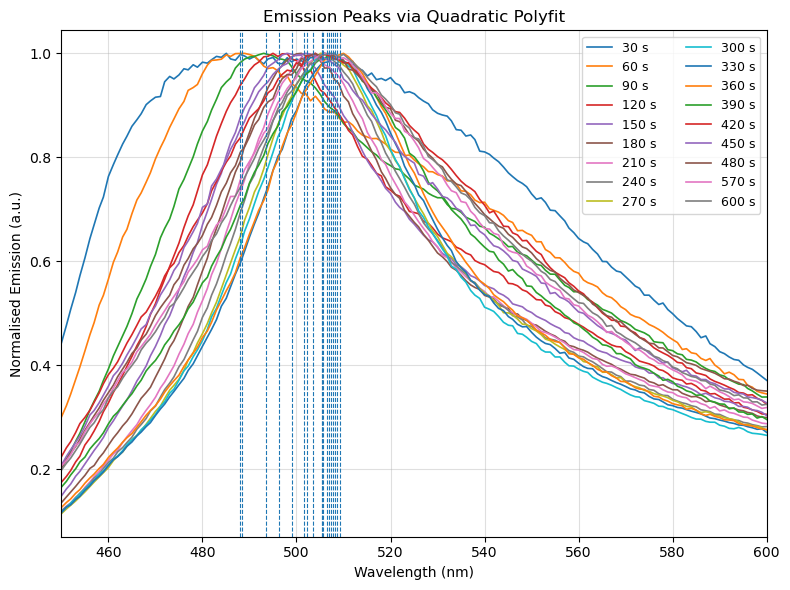

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 4 FL emission.csv"   # your tidy emission file
wl_min     = 450                             # analysis window (nm)
wl_max     = 600
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

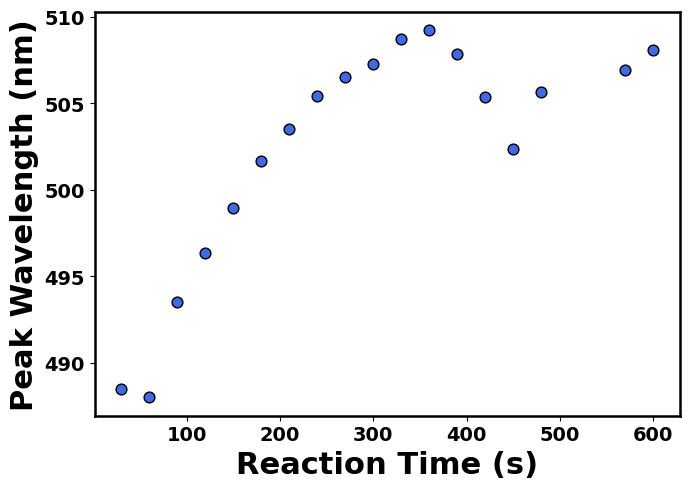

In [24]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 
                    498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 
                    506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 
                    507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 
                    506.94280202669444, 508.09903870385784]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 4 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 507.779 ± 1.062 nm
  A     = 28.532 ± 2.943 nm
  k     = 0.00856 ± 0.00171 s⁻¹
  R²    = 0.9083


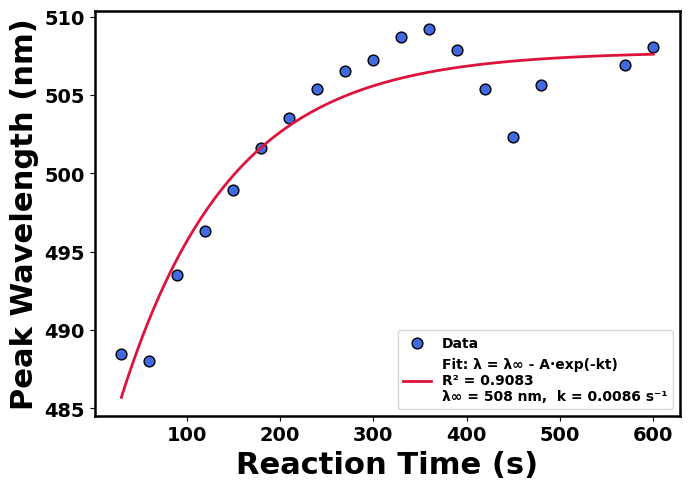

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 
                    498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 
                    506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 
                    507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 
                    506.94280202669444, 508.09903870385784])
# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 4 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

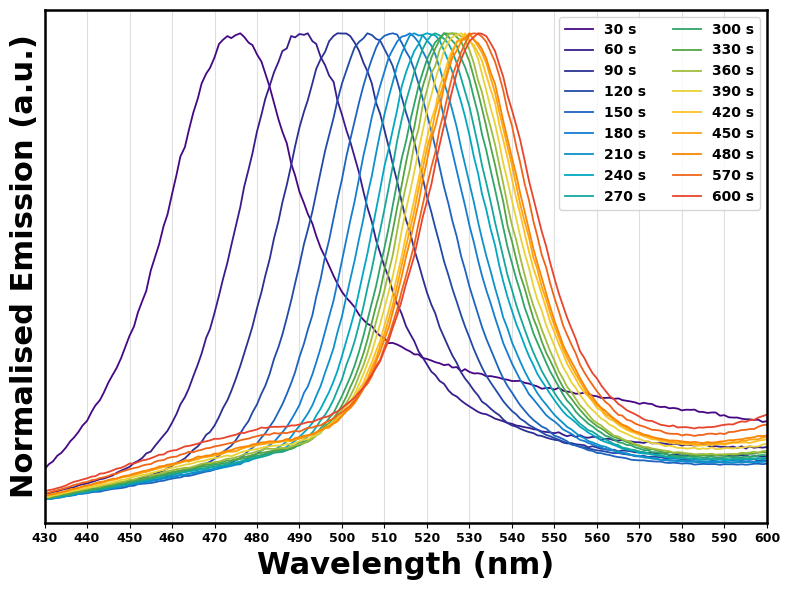

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 5 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 430, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 5 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       474.96        73.44         quadratic_vertex
60 s                       490.48        96.99         quadratic_vertex
90 s                       499.94          138         quadratic_vertex
120 s                      506.70        198.8         quadratic_vertex
150 s                      511.62        188.7         quadratic_vertex
180 s                      515.53        226.8         quadratic_vertex
210 s                      518.09        232.5         quadratic_vertex
240 s                      520.73        241.5         quadratic_vertex
270 s                      522.33        248.3         quadratic_vertex
300 s                      524.21        213.9         quadratic_vertex
330 s                      525.39        224.4         quadratic_vertex
360 s                      526.47        170.6         quadratic_vertex
390 s                      527.70          212         quadratic

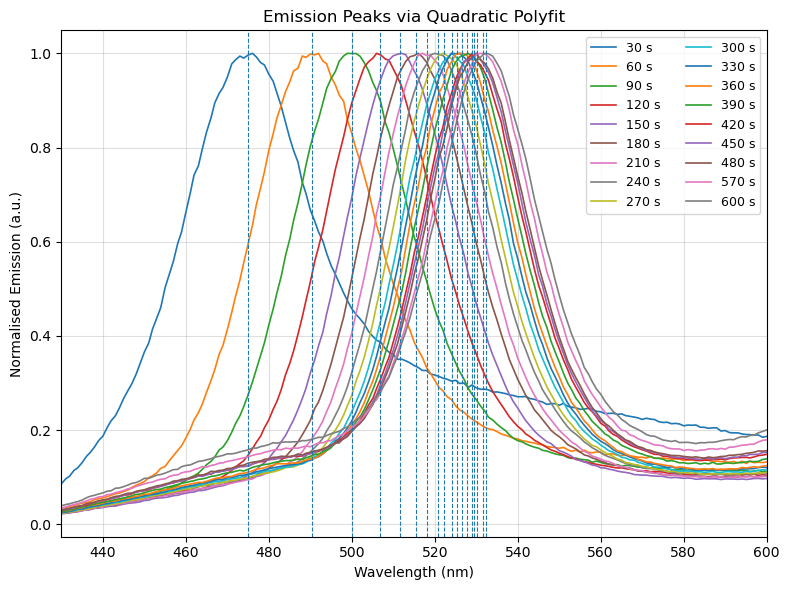

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 5 FL emission.csv"   # your tidy emission file
wl_min     = 430                             # analysis window (nm)
wl_max     = 600
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

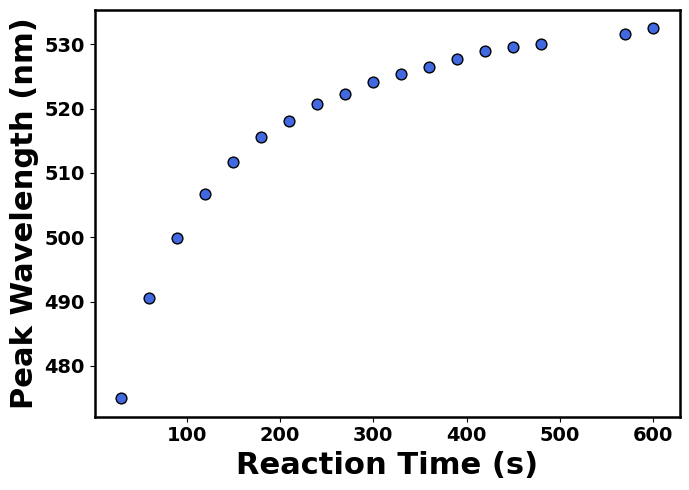

In [27]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 
                    511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 
                    522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 
                    527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 
                    531.6249238825708, 532.4511592900468]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 5 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 530.925 ± 0.635 nm
  A     = 69.089 ± 1.673 nm
  k     = 0.00833 ± 0.00040 s⁻¹
  R²    = 0.9943


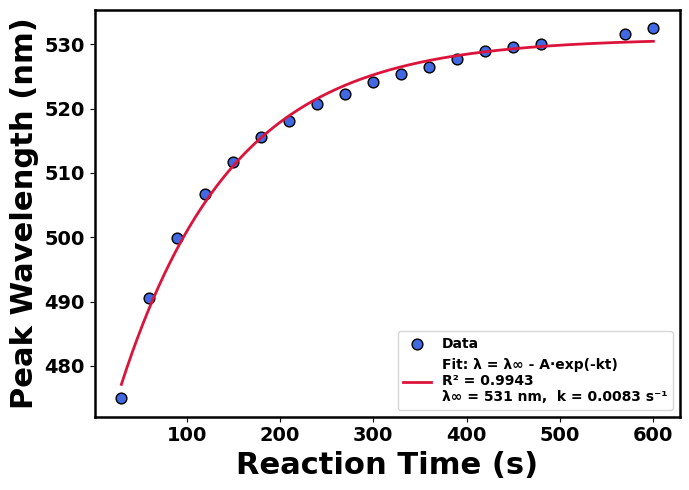

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 
                    511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 
                    522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 
                    527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 
                    531.6249238825708, 532.4511592900468]) 
# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 5 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

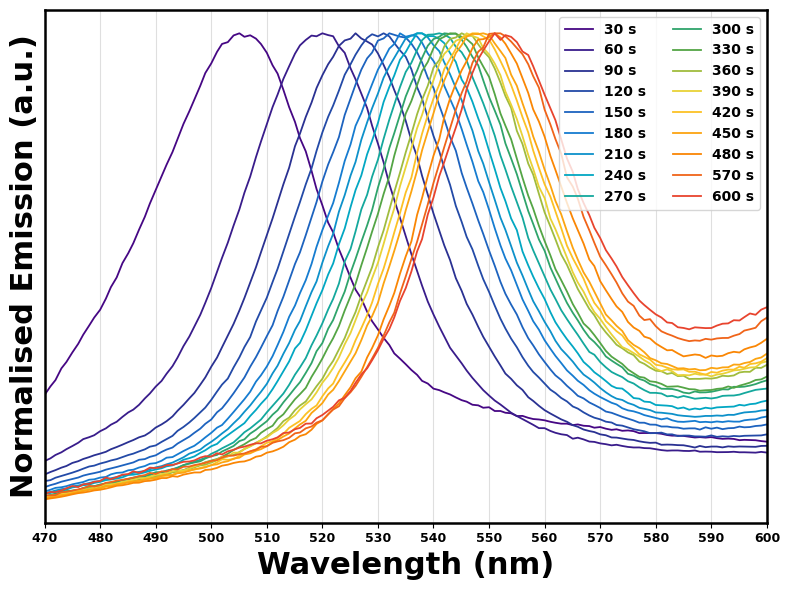

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 6 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 470, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 6 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       505.34        225.2         quadratic_vertex
60 s                       519.50        291.5         quadratic_vertex
90 s                       525.88        290.7         quadratic_vertex
120 s                      530.09        257.3         quadratic_vertex
150 s                      532.84        238.8         quadratic_vertex
180 s                      535.52        214.1         quadratic_vertex
210 s                      537.26        195.5         quadratic_vertex
240 s                      539.04          171         quadratic_vertex
270 s                      541.00        156.7         quadratic_vertex
300 s                      542.56          143         quadratic_vertex
330 s                      543.76        141.1         quadratic_vertex
360 s                      545.59        118.2         quadratic_vertex
390 s                      546.17        112.5         quadratic

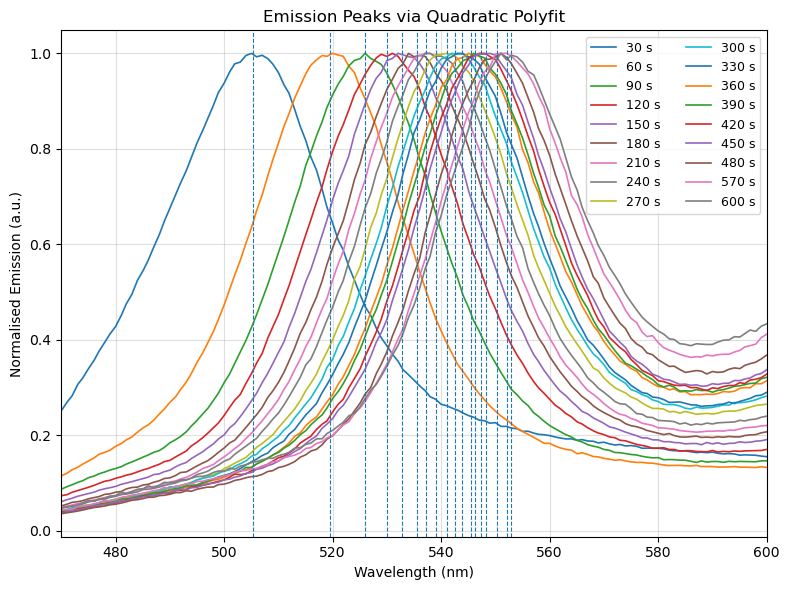

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 6 FL emission.csv"   # your tidy emission file
wl_min     = 470                             # analysis window (nm)
wl_max     = 600
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

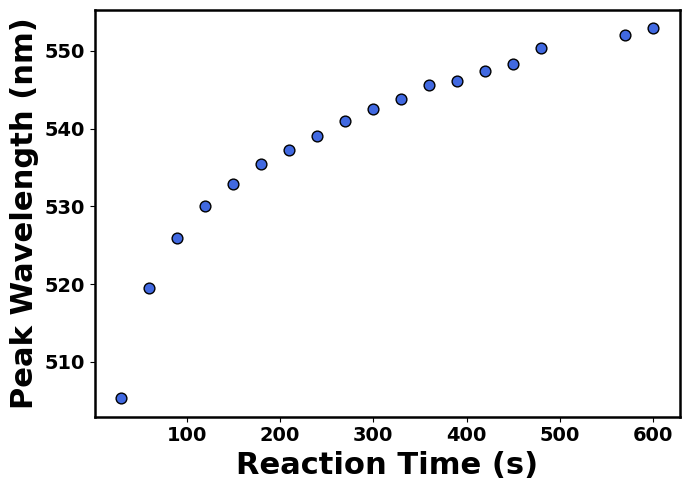

In [30]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 
                    532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 
                    540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 
                    546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 
                    552.1096565046201, 552.8950277213843]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 6 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 551.707 ± 1.422 nm
  A     = 50.728 ± 2.206 nm
  k     = 0.00628 ± 0.00071 s⁻¹
  R²    = 0.9759


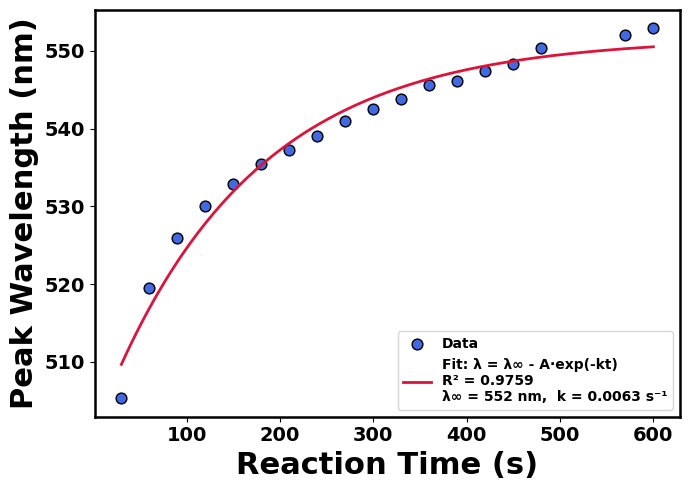

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 
                    532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 
                    540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 
                    546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 
                    552.1096565046201, 552.8950277213843]) 

# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 6 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

## 6. UV-Vis Spectra for Run 7-9

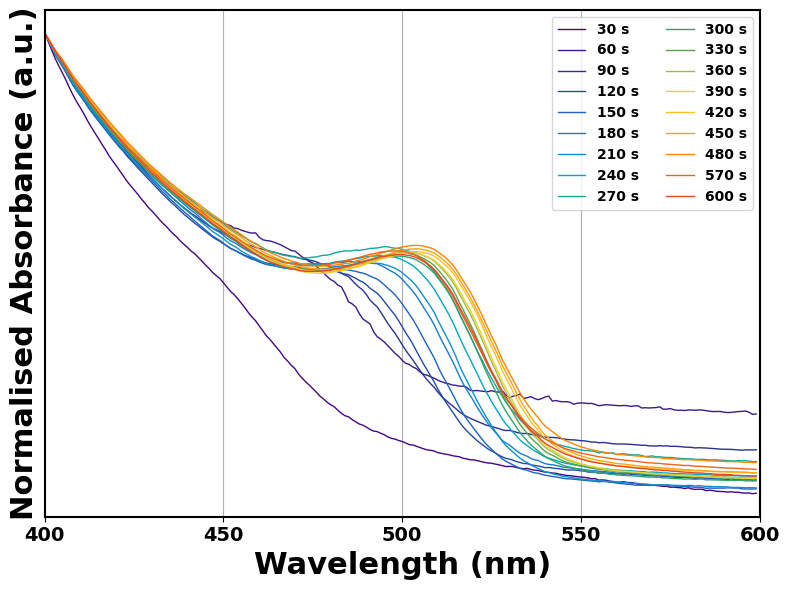

In [32]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps


# ---------------- Settings ----------------
csv_path = "Run 7 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 7 UV-Vis Spectra.png', dpi=1200)
plt.show()

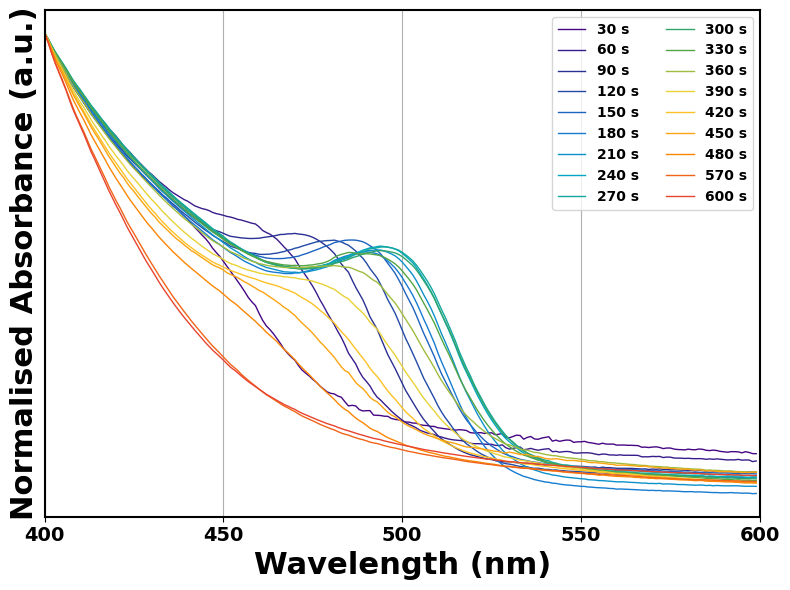

In [33]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps


# ---------------- Settings ----------------
csv_path = "Run 8 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 8 UV-Vis Spectra.png', dpi=1200)
plt.show()

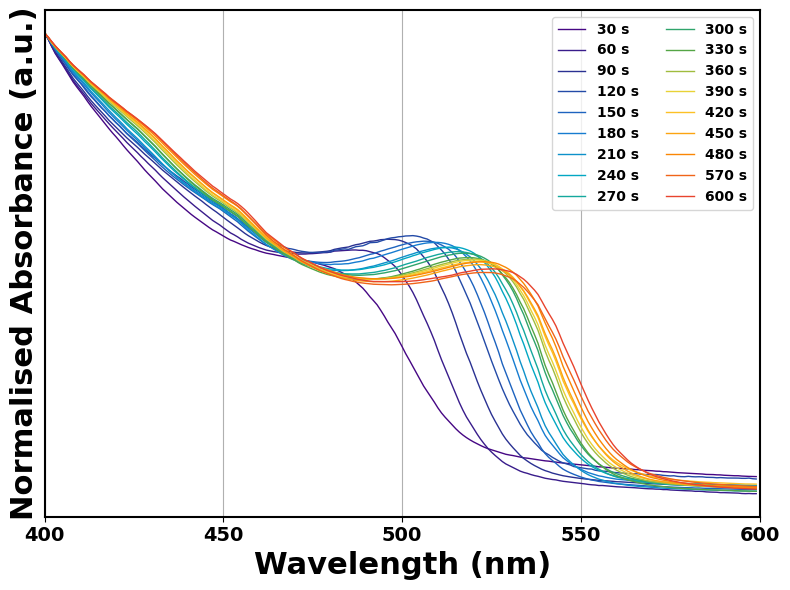

In [34]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps


# ---------------- Settings ----------------
csv_path = "Run 9 UV-Vis.csv"
wl_min, wl_max = 400, 600
figsize = (8, 6)

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- Load data ----------
df = pd.read_csv(csv_path)

# First column = wavelength, rest = absorbances
wl = pd.to_numeric(df.iloc[:, 0], errors="coerce")

# ---------- Build traces (simple and explicit) ----------
traces = []
for col in df.columns[1:]:
    A = pd.to_numeric(df[col], errors="coerce")
    # restrict to plotting window
    mask = np.isfinite(wl) & np.isfinite(A) & (wl >= wl_min) & (wl <= wl_max)
    wl_range = wl[mask]
    abs_range = A[mask]
    if wl_range.empty:
        continue
    # local normalisation in window
    max_val = abs_range.max()
    if not np.isfinite(max_val) or max_val == 0:
        continue
    abs_norm = abs_range / max_val

    # optional: clean label (e.g., extract "120 s" if present)
    m = re.search(r"(\d+)\s*s", str(col))
    label = f"{m.group(1)} s" if m else str(col)

    traces.append({"label": label, "wl": wl_range, "abs": abs_norm})

if not traces:
    raise RuntimeError("No valid absorbance columns found after the wavelength column.")

# ---------- Colour & plot ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

plt.figure(figsize=figsize)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    plt.plot(t["wl"], t["abs"], lw=1.0, label=t["label"],
             color=label_to_color.get(t["label"]))

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylabel("Normalised Absorbance (a.u.)", fontsize=22, fontweight='bold')
plt.xticks(np.arange(wl_min, wl_max + 1, 50), fontsize=14, fontweight='bold')
plt.yticks([])
plt.xlim(wl_min, wl_max)
plt.grid(True)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'})

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.savefig('Run 9 UV-Vis Spectra.png', dpi=1200)
plt.show()

## 7. Emission Spectra for Run 7-9

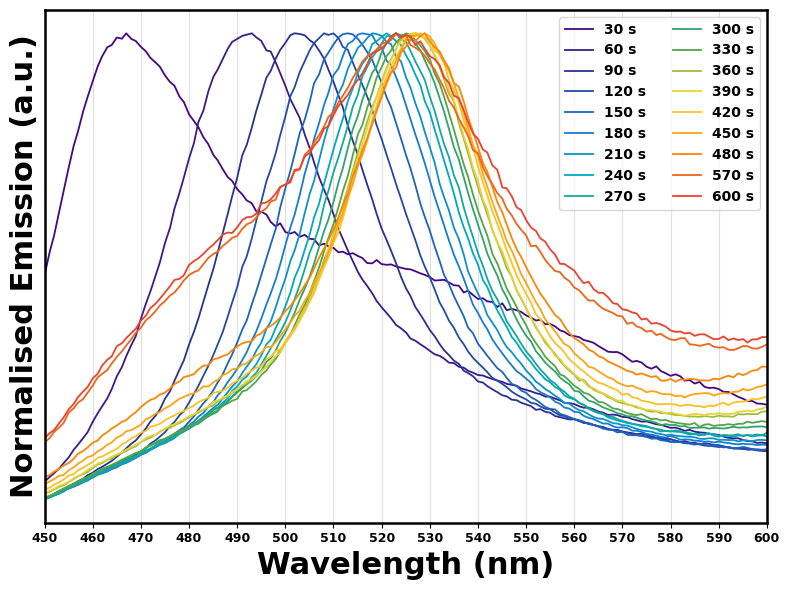

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 7 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 450, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 7 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       467.30        105.3         quadratic_vertex
60 s                       492.24        168.2         quadratic_vertex
90 s                       502.96        195.9         quadratic_vertex
120 s                      508.98          186         quadratic_vertex
150 s                      513.07        192.2         quadratic_vertex
180 s                      516.42        162.8         quadratic_vertex
210 s                      518.74        174.4         quadratic_vertex
240 s                      521.06        158.3         quadratic_vertex
270 s                      522.40        157.7         quadratic_vertex
300 s                      524.13        143.5         quadratic_vertex
330 s                      525.32        154.2         quadratic_vertex
360 s                      526.57        129.7         quadratic_vertex
390 s                      526.77        129.4         quadratic

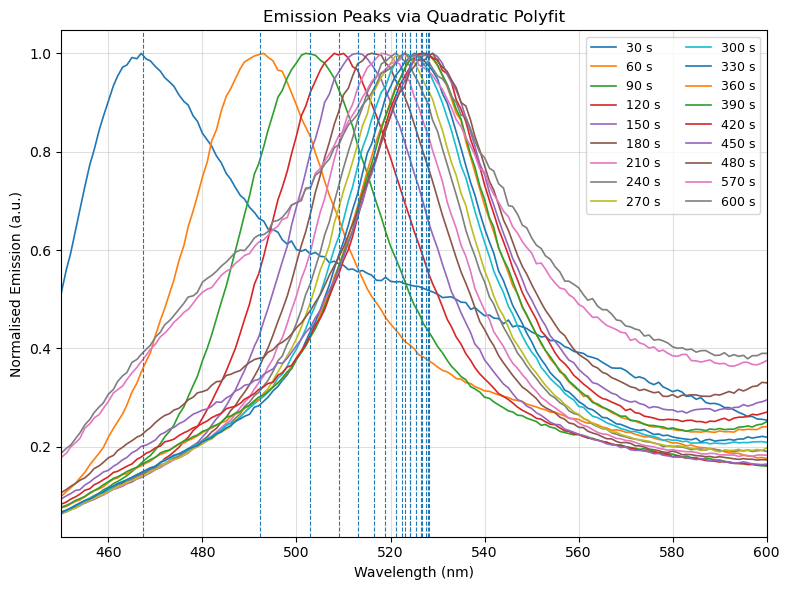

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 7 FL emission.csv"   # your tidy emission file
wl_min     = 450                             # analysis window (nm)
wl_max     = 600
window_nm  = 15                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

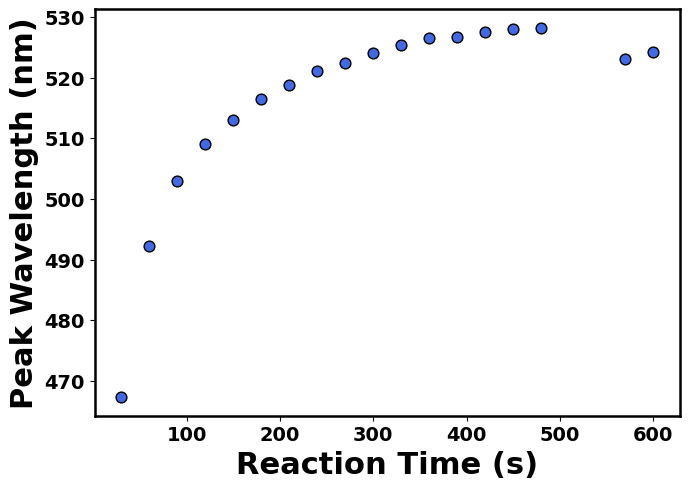

In [36]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 
                    513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 
                    522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 
                    526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 
                    523.0859927429811, 524.2284648603371]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 7 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 525.835 ± 0.752 nm
  A     = 83.981 ± 4.414 nm
  k     = 0.01349 ± 0.00100 s⁻¹
  R²    = 0.9833


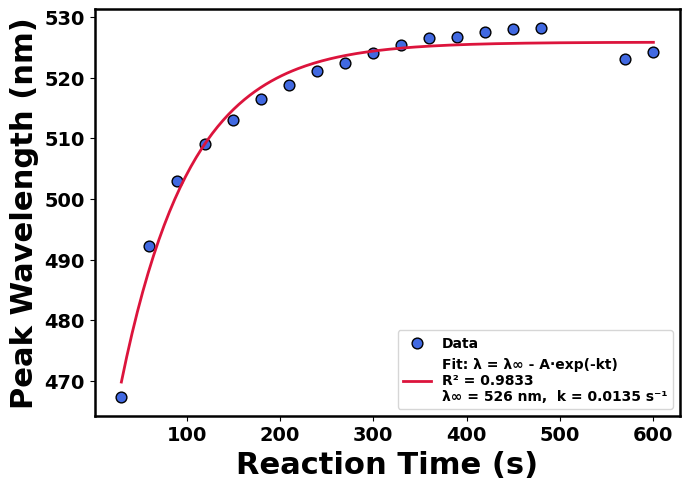

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 
                    513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 
                    522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 
                    526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 
                    523.0859927429811, 524.2284648603371]) 

# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 7 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

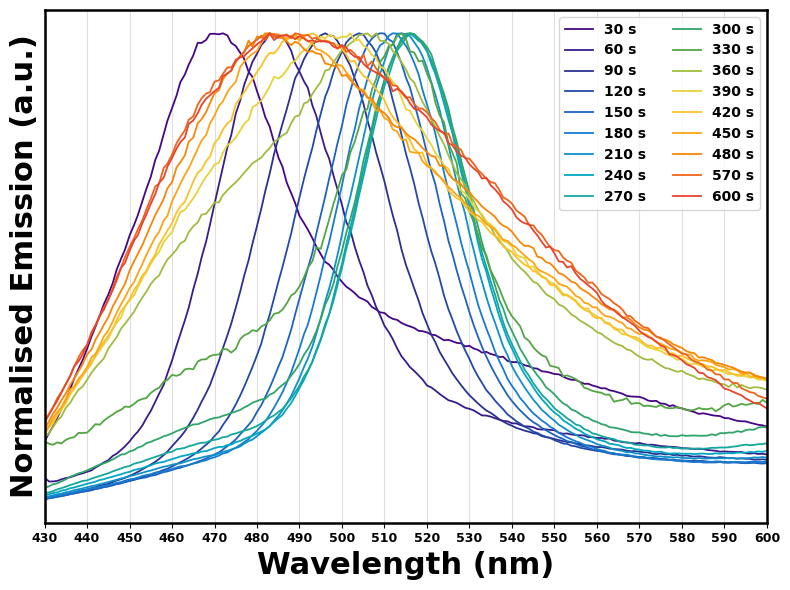

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 8 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 430, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 8 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       470.63        157.6         quadratic_vertex
60 s                       484.14        254.2         quadratic_vertex
90 s                       496.13        471.4         quadratic_vertex
120 s                      503.93          466         quadratic_vertex
150 s                      509.05        483.3         quadratic_vertex
180 s                      512.14        414.5         quadratic_vertex
210 s                      514.69        375.6         quadratic_vertex
240 s                      516.22        339.7         quadratic_vertex
270 s                      516.63        303.9         quadratic_vertex
300 s                      516.49        234.3         quadratic_vertex
330 s                      513.94        33.86         quadratic_vertex
360 s                      506.09        77.48         quadratic_vertex
390 s                      498.72        73.47         quadratic

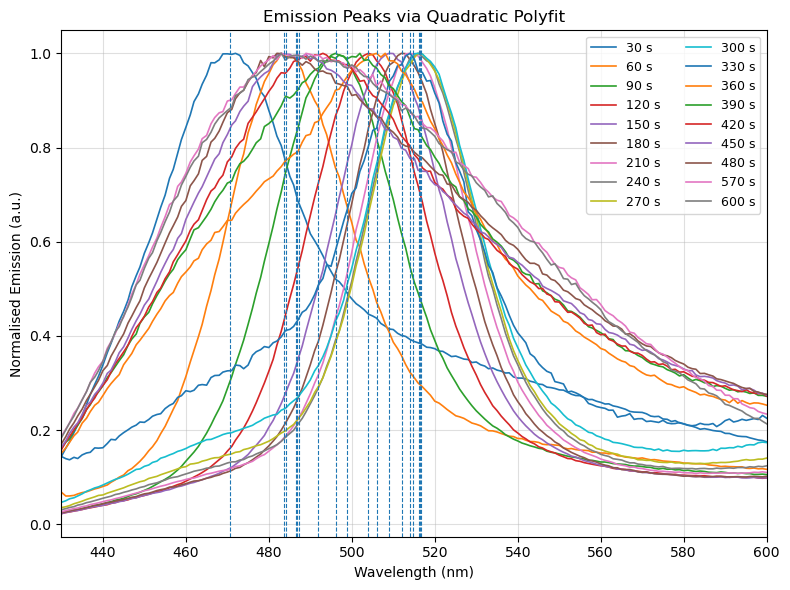

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 8 FL emission.csv"   # your tidy emission file
wl_min     = 430                             # analysis window (nm)
wl_max     = 600
window_nm  = 15                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

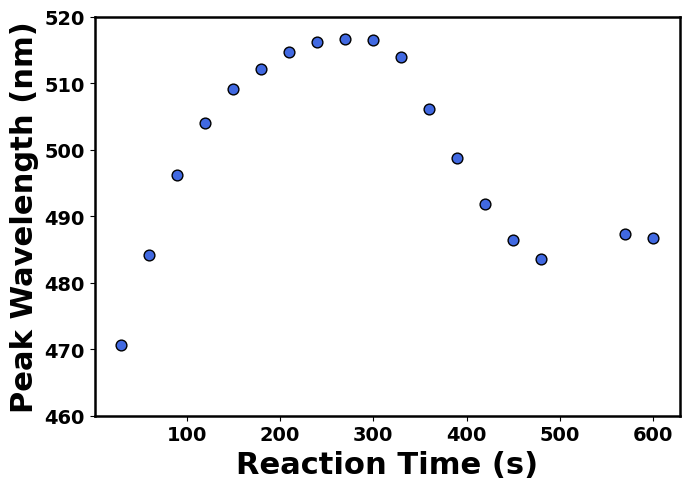

In [87]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 
                    509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 
                    516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 
                    498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 
                    487.3611622541664, 486.7703619742948]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylim(460,520)
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 8 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  a = -3.916119e-04 ± 8.042136e-05
  b = 2.283453e-01 ± 5.129651e-02
  c = 477.308 ± 6.982
  R²    = 0.6219


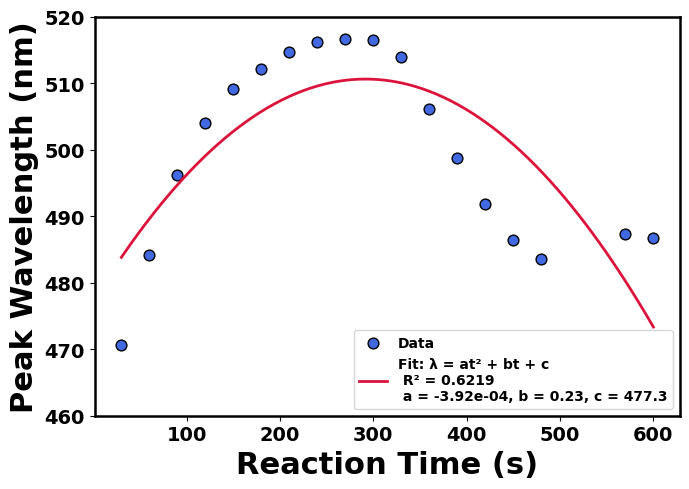

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 
                    509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 
                    516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 
                    498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 
                    487.3611622541664, 486.7703619742948]) 

# --- Define exponential saturation model ---
def parabola(t, a, b, c):
    return a*t**2 + b*t + c

# --- Initial guesses (important for convergence) ---
p0 = [1e-4, 0.1, 480]

# --- Fit ---
popt, pcov = curve_fit(parabola, reaction_time, peak_nm, p0=p0)
a, b, c = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute R² manually ---
fit_vals = parabola(reaction_time, *popt)
residuals = peak_nm - fit_vals
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Generate Smooth Curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 300)
lambda_fit = parabola(t_fit, *popt)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  a = {a:.6e} ± {perr[0]:.6e}")
print(f"  b = {b:.6e} ± {perr[1]:.6e}")
print(f"  c = {c:.3f} ± {perr[2]:.3f}")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lambda_fit, color="crimson", lw=2,
        label=f"Fit: λ = at² + bt + c\n R² = {r2:.4f}\n a = {a:.2e}, b = {b:.2f}, c = {c:.1f}")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.ylim(460,520)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 8 Emission Peak Values vs Reaction time, Parabolic Fit", dpi = 1200)
plt.show()


C:\Users\al6323\AppData\Local\Temp\ipykernel_2136\132752032.py:54: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


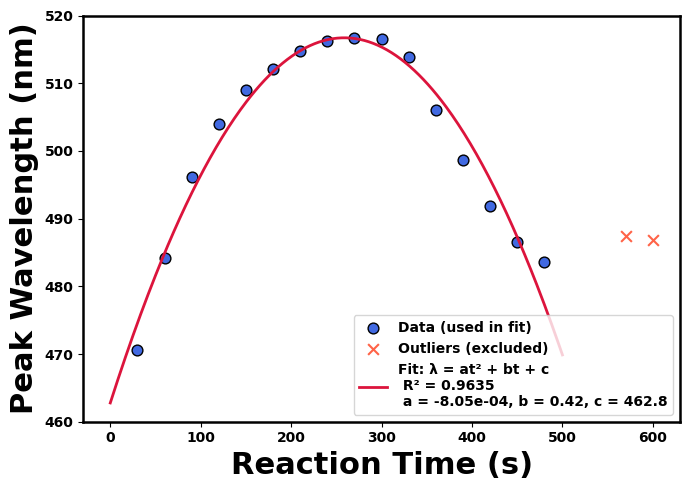

Fitted Parameters:
  a = -8.051535e-04 ± 4.356036e-05
  b = 4.167636e-01 ± 2.285238e-02
  c = 462.776 ± 2.532
  R²    = 0.9635


In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==== your data ====
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 
                    509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 
                    516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 
                    498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 
                    487.3611622541664, 486.7703619742948])


# ==== define your exponential saturation model ====
def parabola(t, a, b, c):
    return a*t**2 + b*t + c

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [-1, -2]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# --- Initial guesses (important for convergence) ---
p0 = [1e-4, 0.1, 480]

# --- Fit ---
popt, pcov = curve_fit(parabola, reaction_time[mask], peak_nm[mask], p0=p0)
a, b, c = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute R² manually ---
fit_vals = parabola(reaction_time, *popt)
residuals = peak_nm[mask] - fit_vals[mask]
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm[mask] - np.mean(peak_nm[mask]))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Generate Smooth Curve ---
t_fit = np.linspace(0, 500, 300)
lambda_fit = parabola(t_fit, *popt)

# ==== plot ====
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

# fitted line
plt.plot(t_fit, lambda_fit, color="crimson", lw=2,
        label=f"Fit: λ = at² + bt + c\n R² = {r2:.4f}\n a = {a:.2e}, b = {b:.2f}, c = {c:.1f}")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.ylim(460,520)
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')
#plt.title("Exponential Fit with Manual Outlier Exclusion", fontsize=16, fontweight='bold')
#plt.grid(True, alpha=0.4)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()


plt.savefig("Run 8 Emission Peak Values vs Reaction time Exponential Fit with Manual Outlier Exclusion", dpi = 1200)
plt.show()

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  a = {a:.6e} ± {perr[0]:.6e}")
print(f"  b = {b:.6e} ± {perr[1]:.6e}")
print(f"  c = {c:.3f} ± {perr[2]:.3f}")
print(f"  R²    = {r2:.4f}")

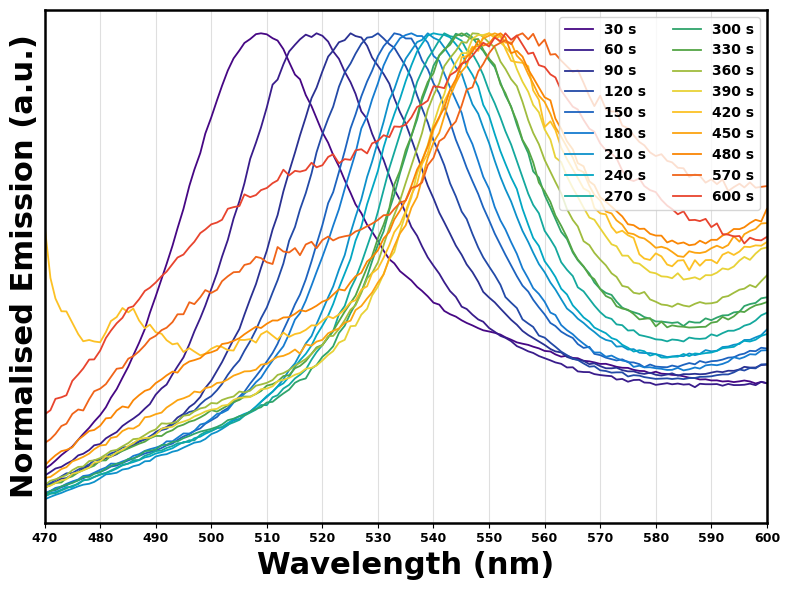

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 9 FL emission.csv")   # your cached loader
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")
    ymax = np.nanmax(y.values)
    if not np.isfinite(ymax) or ymax == 0:
        continue
    y_norm = y / ymax
    traces.append({"label": col, "wl": wl, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
wl_min, wl_max = 470, 600
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Emission (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.title("Fluorescence Emission (Locally Normalised)", fontsize=18, fontweight="bold")
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')  # adjust if many labels
plt.tight_layout()
plt.savefig('Run 9 Emission Spectra.png',dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       509.05        201.9         quadratic_vertex
60 s                       518.26        128.7         quadratic_vertex
90 s                       525.40        147.2         quadratic_vertex
120 s                      529.76        106.6         quadratic_vertex
150 s                      534.03        119.6         quadratic_vertex
180 s                      536.26          103         quadratic_vertex
210 s                      539.36        104.5         quadratic_vertex
240 s                      541.17        96.31         quadratic_vertex
270 s                      543.27        87.46         quadratic_vertex
300 s                      545.51        77.01         quadratic_vertex
330 s                      545.60        70.48         quadratic_vertex
360 s                      547.57        61.35         quadratic_vertex
390 s                      549.42        55.95         quadratic

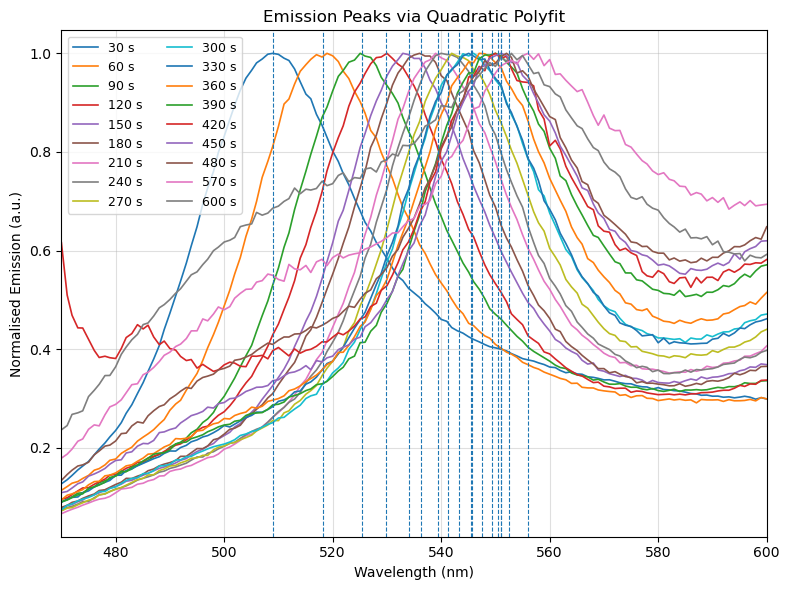

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 9 FL emission.csv"   # your tidy emission file
wl_min     = 470                             # analysis window (nm)
wl_max     = 600
window_nm  = 15                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

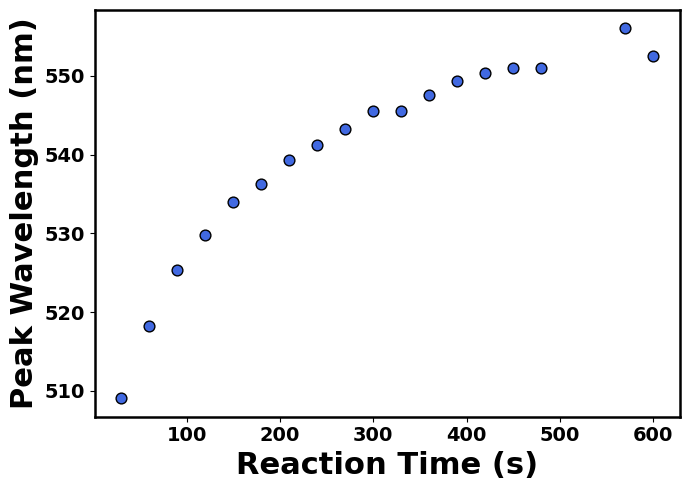

In [41]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 
                    534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 
                    543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 
                    549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 
                    556.0290025497369, 552.4786927109501]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 9 Emission Peak Values vs Reaction time", dpi = 1200)
plt.show()

Fitted Parameters:
  λ_inf = 554.744 ± 0.937 nm
  A     = 52.447 ± 1.276 nm
  k     = 0.00586 ± 0.00040 s⁻¹
  R²    = 0.9918


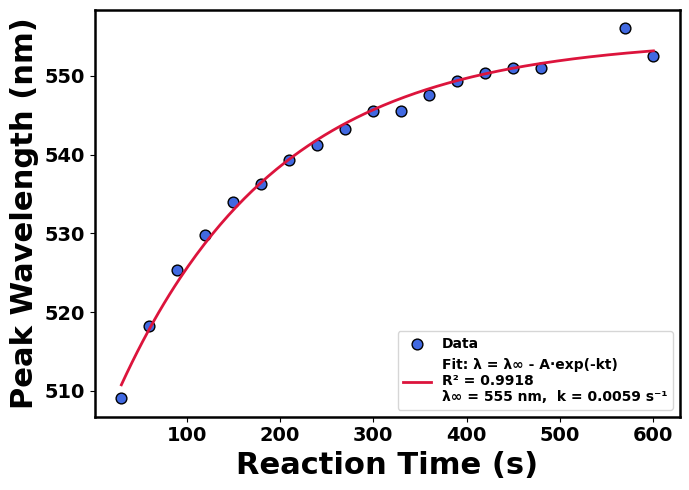

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import linregress

# --- Your data from peak analysis ---
# (replace these with your own extracted values)
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 
                    534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 
                    543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 
                    549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 
                    556.0290025497369, 552.4786927109501]) 

# --- Define exponential saturation model ---
def exp_saturation(t, lam_inf, A, k):
    """λ(t) = λ_inf - A * exp(-k * t)"""
    return lam_inf - A * np.exp(-k * t)

# --- Initial guesses (important for convergence) ---
# λ_inf ≈ last value, A ≈ range, k ≈ 0.01
p0 = [peak_nm.max(), peak_nm.max()-peak_nm.min(), 0.01]

# --- Fit ---
popt, pcov = curve_fit(exp_saturation, reaction_time, peak_nm, p0=p0, maxfev=10000)
lam_inf, A, k = popt
perr = np.sqrt(np.diag(pcov))

# --- Compute fitted curve ---
t_fit = np.linspace(reaction_time.min(), reaction_time.max(), 200)
lam_fit = exp_saturation(t_fit, *popt)

# --- Compute R² manually ---
residuals = peak_nm - exp_saturation(reaction_time, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((peak_nm - np.mean(peak_nm))**2)
r2 = 1 - (ss_res / ss_tot)

# --- Print parameters ---
print(f"Fitted Parameters:")
print(f"  λ_inf = {lam_inf:.3f} ± {perr[0]:.3f} nm")
print(f"  A     = {A:.3f} ± {perr[1]:.3f} nm")
print(f"  k     = {k:.5f} ± {perr[2]:.5f} s⁻¹")
print(f"  R²    = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, lam_fit, color="crimson", lw=2,
         label=f"Fit: λ = λ∞ - A·exp(-kt)\nR² = {r2:.4f}\nλ∞ = {lam_inf:.0f} nm,  k = {k:.4f} s⁻¹")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 9 Emission Peak Values vs Reaction time, Exponential Fit", dpi = 1200)
plt.show()

## 8. Excitation Spectra Run 2-9

### 8.1 Run 2

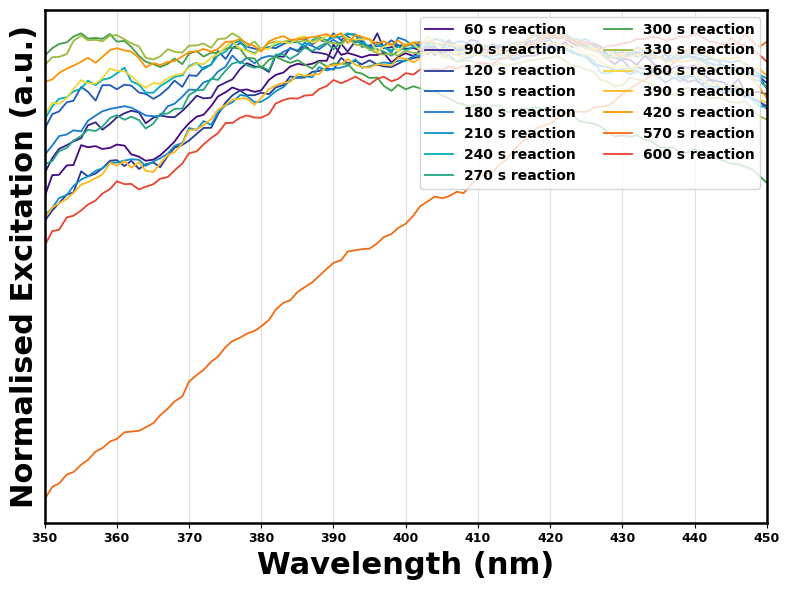

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 2 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 350, 450

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 2 Excitation Spectra.png', dpi=1200)
plt.show()

### 8.2 Run 4

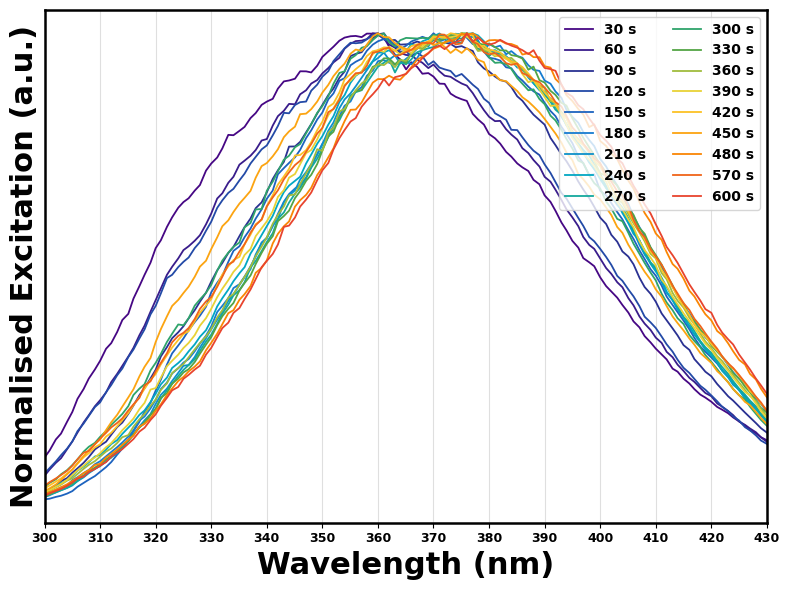

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 4 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 300, 430

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 4 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       357.35        157.3         quadratic_vertex
60 s                       359.67        160.1         quadratic_vertex
90 s                       364.45        162.3         quadratic_vertex
120 s                      360.32        146.3         quadratic_vertex
150 s                      369.23        149.8         quadratic_vertex
180 s                      375.48          144         quadratic_vertex
210 s                      373.71          134         quadratic_vertex
240 s                      373.40        125.7         quadratic_vertex
270 s                      374.49        126.1         quadratic_vertex
300 s                      369.37        128.2         quadratic_vertex
330 s                      374.77        121.2         quadratic_vertex
360 s                      373.79        119.5         quadratic_vertex
390 s                      372.83        124.3         quadratic

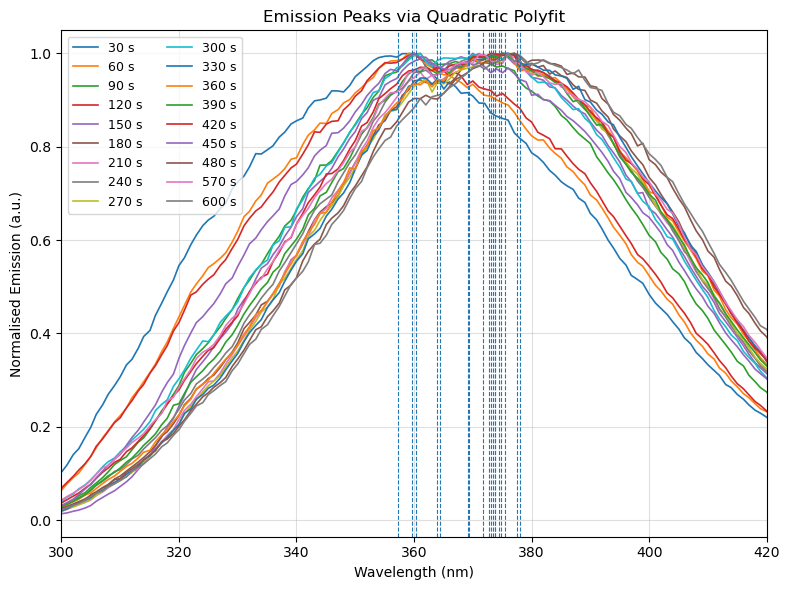

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 4 FL excitation.csv"   # your tidy emission file
wl_min     = 300                             # analysis window (nm)
wl_max     = 420
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

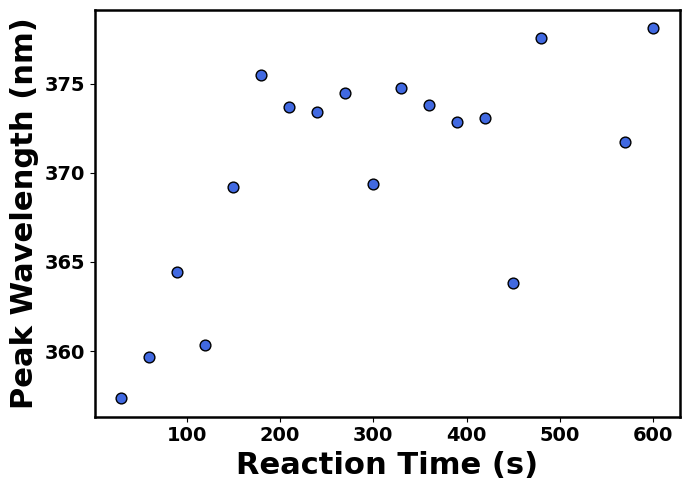

In [45]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 
                    369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 
                    374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 
                    372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 
                    371.76002054248767, 378.104045972207]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 4 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.023914 ± 0.007070 (nm/s)
c = 363.204 ± 2.375 (nm)
R2 = 0.4169


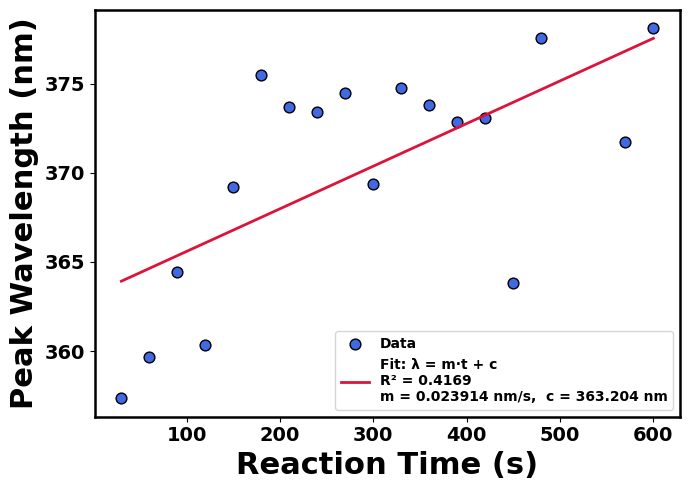

In [24]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 
                    369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 
                    374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 
                    372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 
                    371.76002054248767, 378.104045972207]) 

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 4 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.029317 ± 0.005833 (nm/s)
c = 361.778 ± 1.955 (nm)
R2 = 0.6434


/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/1473778167.py:62: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


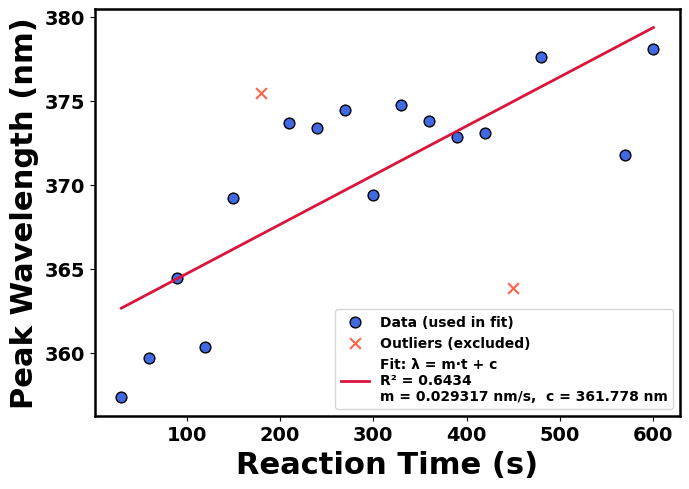

In [25]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 
                    369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 
                    374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 
                    372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 
                    371.76002054248767, 378.104045972207])   

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [5, -4]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# --- Linear Fit ---
coef, cov = np.polyfit(t[mask], y[mask], deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y[mask] - y_fit[mask])**2)
ss_total = np.sum((y[mask] - np.mean(y[mask]))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 4 Excitation Peak Values vs Reaction time, Linear Fit, Outlier Excluded", dpi = 1200)
plt.show()

### 8.3 Run 5

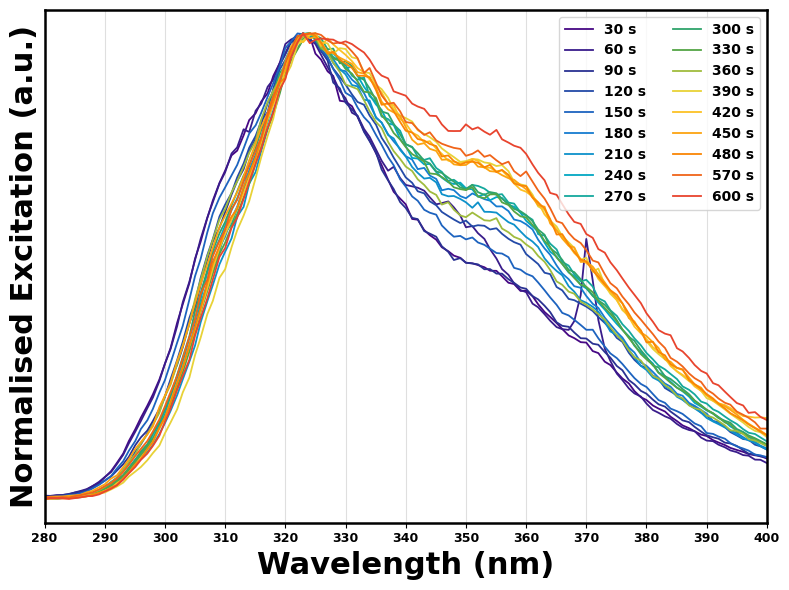

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 5 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 280, 400

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 5 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       322.93        112.4         quadratic_vertex
60 s                       322.99         85.5         quadratic_vertex
90 s                       323.59        90.12         quadratic_vertex
120 s                      324.19        98.61         quadratic_vertex
150 s                      323.65        96.82         quadratic_vertex
180 s                      325.46        99.66         quadratic_vertex
210 s                      325.68        98.54         quadratic_vertex
240 s                      325.82         97.8         quadratic_vertex
270 s                      325.81        94.89         quadratic_vertex
300 s                      325.73         86.2         quadratic_vertex
330 s                      326.03        89.69         quadratic_vertex
360 s                      324.86        82.09         quadratic_vertex
390 s                      326.91        82.16         quadratic

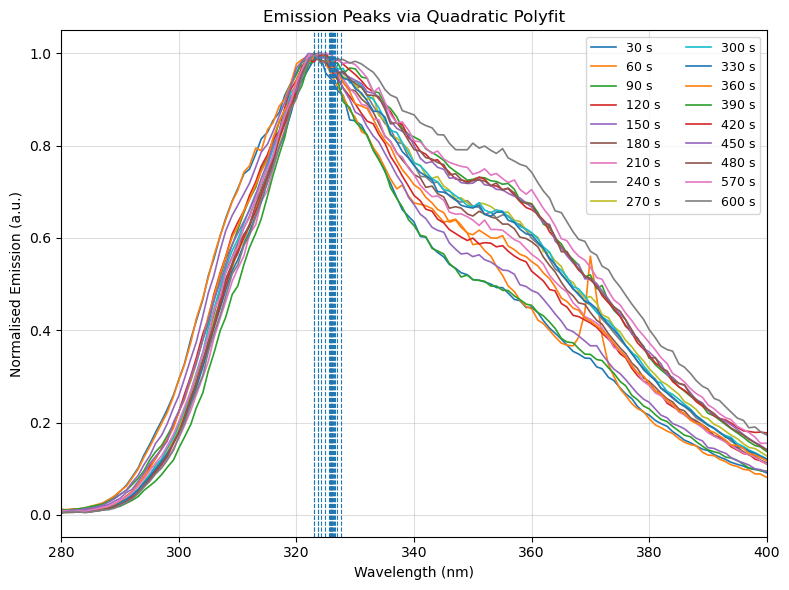

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 5 FL excitation.csv"   # your tidy emission file
wl_min     = 280                             # analysis window (nm)
wl_max     = 400
window_nm  = 20                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

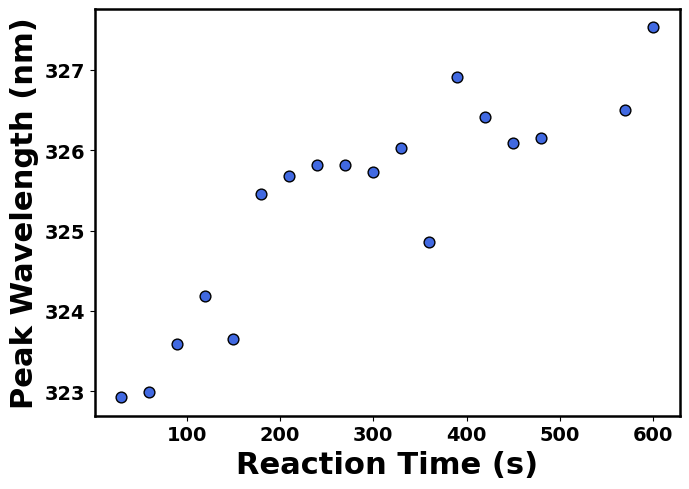

In [47]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 
                    323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 
                    325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 
                    326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 
                    326.5024987007395, 327.5266362950549]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 5 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.006901 ± 0.000950 (nm/s)
c = 323.339 ± 0.319 (nm)
R2 = 0.7674


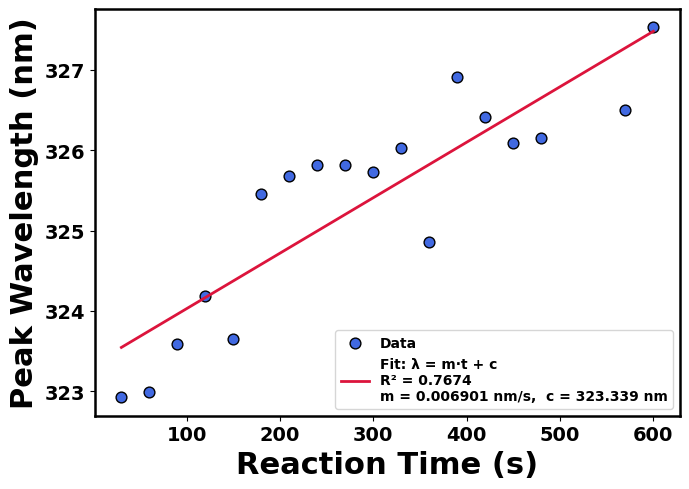

In [26]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 
                    323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 
                    325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 
                    326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 
                    326.5024987007395, 327.5266362950549]) 

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 5 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.007041 ± 0.000916 (nm/s)
c = 323.355 ± 0.306 (nm)
R2 = 0.7977


/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/2679725840.py:62: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


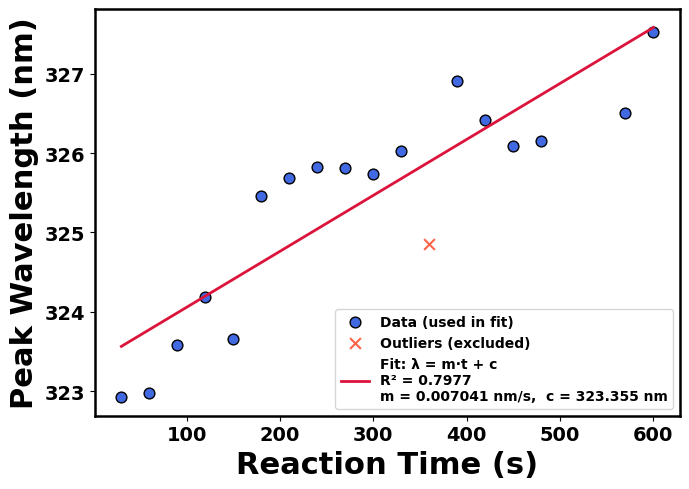

In [27]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 
                    323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 
                    325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 
                    326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 
                    326.5024987007395, 327.5266362950549])   

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [-7]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# --- Linear Fit ---
coef, cov = np.polyfit(t[mask], y[mask], deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y[mask] - y_fit[mask])**2)
ss_total = np.sum((y[mask] - np.mean(y[mask]))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 5 Excitation Peak Values vs Reaction time, Linear Fit, Outlier Excluded", dpi = 1200)
plt.show()

### 8.4 Run 6

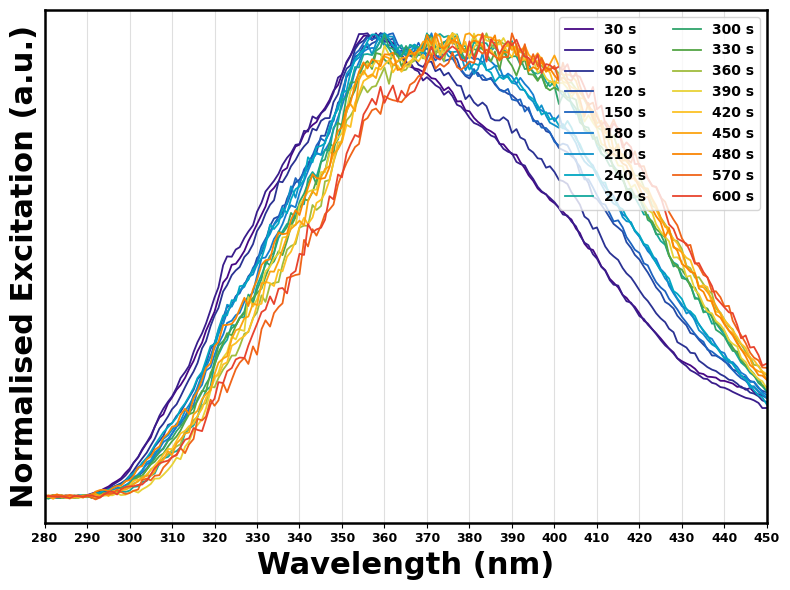

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 6 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 280, 450

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 6 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       361.25          148         quadratic_vertex
60 s                       360.39        111.5         quadratic_vertex
90 s                       363.17        83.89         quadratic_vertex
120 s                      366.99           60         quadratic_vertex
150 s                      366.73        50.81         quadratic_vertex
180 s                      371.30        40.17         quadratic_vertex
210 s                      368.13        36.23         quadratic_vertex
240 s                      368.07        32.15         quadratic_vertex
270 s                      374.41        24.01         quadratic_vertex
300 s                      375.73        23.07         quadratic_vertex
330 s                      375.31        20.54         quadratic_vertex
360 s                      381.00         16.5         quadratic_vertex
390 s                      377.71        17.51         quadratic

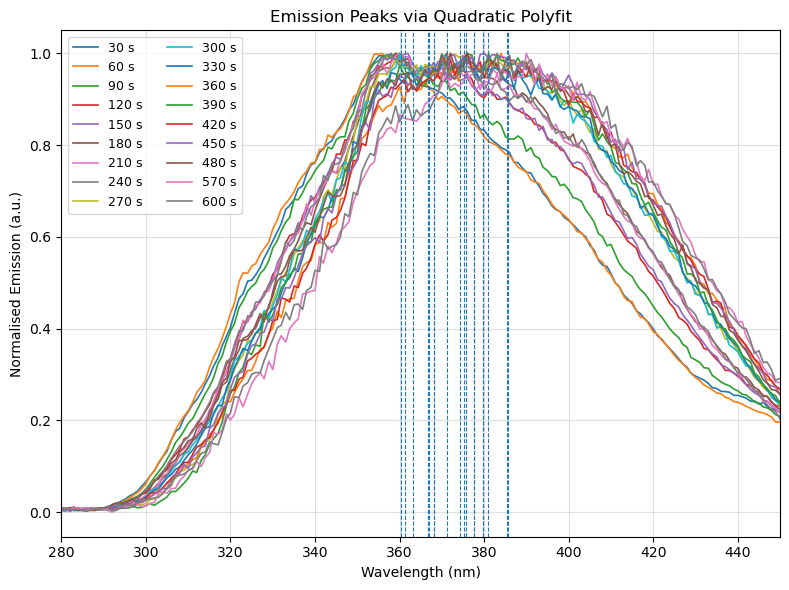

In [85]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 6 FL excitation.csv"   # your tidy emission file
wl_min     = 280                             # analysis window (nm)
wl_max     = 450
window_nm  = 50                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

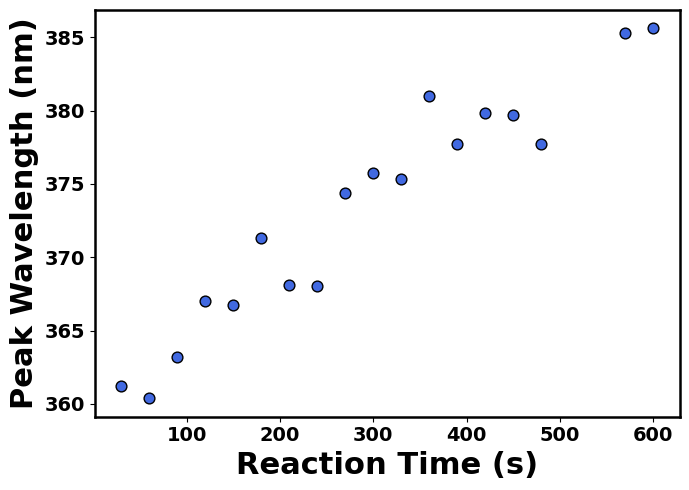

In [49]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 
                    366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 
                    374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 
                    377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 
                    385.3154458531392, 385.6052765070232]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 6 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.043943 ± 0.003142 (nm/s)
c = 360.427 ± 1.056 (nm)
R2 = 0.9244


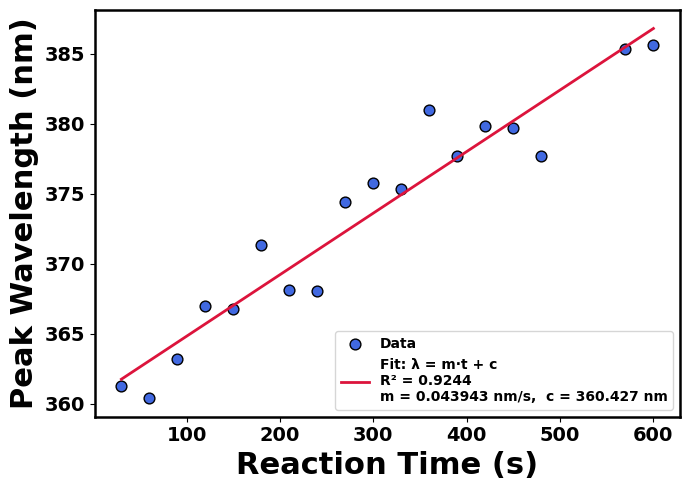

In [28]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 
                    366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 
                    374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 
                    377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 
                    385.3154458531392, 385.6052765070232]) 

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 6 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

### 8.5 Run 7

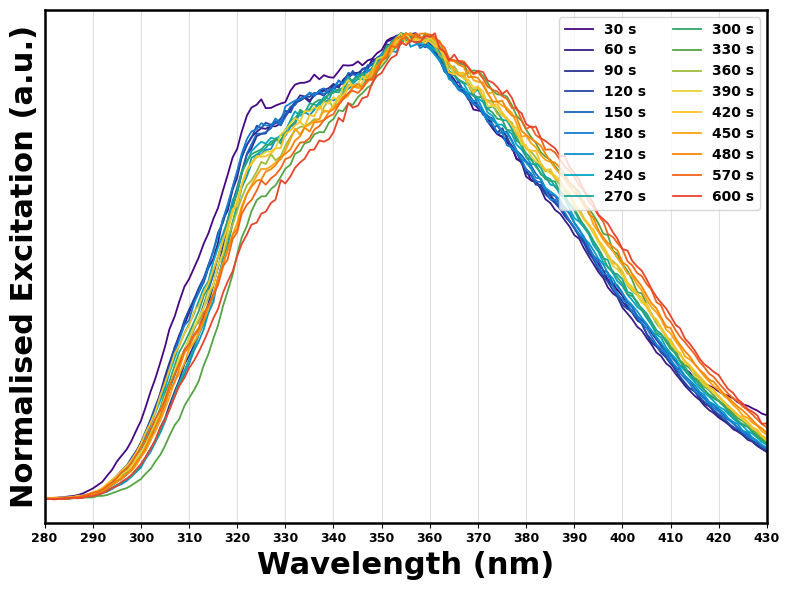

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 7 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 280, 430

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 7 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       350.82          138         quadratic_vertex
60 s                       352.04        120.1         quadratic_vertex
90 s                       352.56        110.9         quadratic_vertex
120 s                      352.48        104.1         quadratic_vertex
150 s                      352.81        99.71         quadratic_vertex
180 s                      352.22        90.02         quadratic_vertex
210 s                      354.00        91.14         quadratic_vertex
240 s                      354.52        85.68         quadratic_vertex
270 s                      354.62        82.84         quadratic_vertex
300 s                      354.35        80.12         quadratic_vertex
330 s                      358.88        83.29         quadratic_vertex
360 s                      356.18        77.56         quadratic_vertex
390 s                      355.23        77.13         quadratic

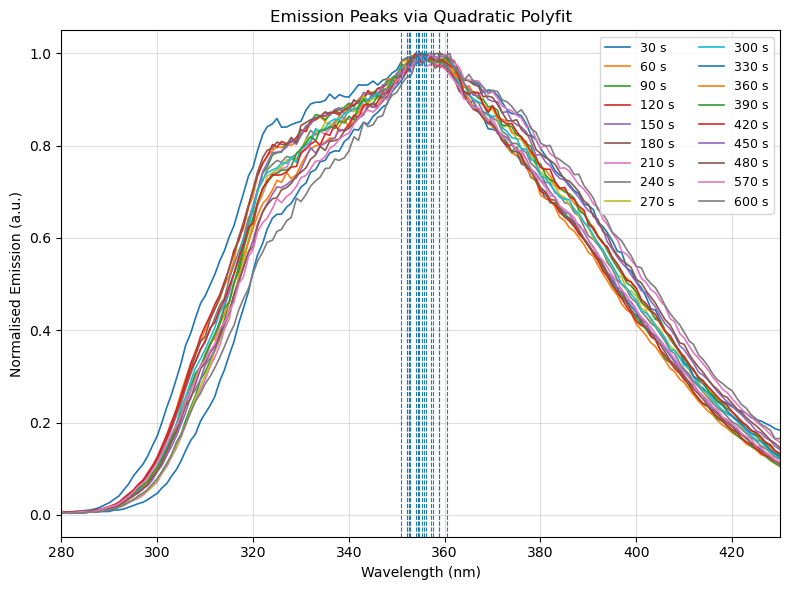

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 7 FL excitation.csv"   # your tidy emission file
wl_min     = 280                             # analysis window (nm)
wl_max     = 430
window_nm  = 50                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

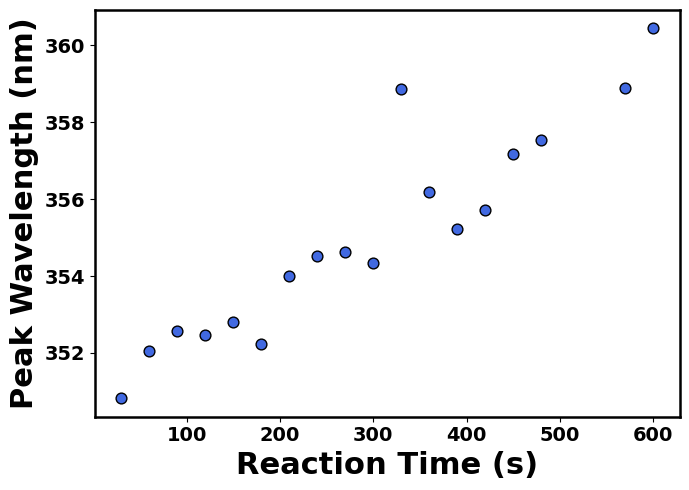

In [51]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721,
                    352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173,
                    354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755,
                    355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 
                    358.89064710214234, 360.44156437430405]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 7 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.014721 ± 0.001476 (nm/s)
c = 350.731 ± 0.496 (nm)
R2 = 0.8614


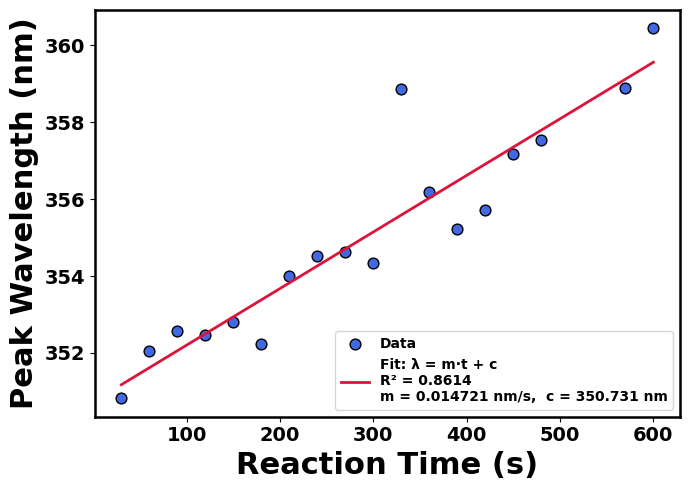

In [29]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721,
                    352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173,
                    354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755,
                    355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 
                    358.89064710214234, 360.44156437430405]) 

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 7 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.013492 ± 0.000866 (nm/s)
c = 350.803 ± 0.270 (nm)
R2 = 0.9455


/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/3956389539.py:62: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


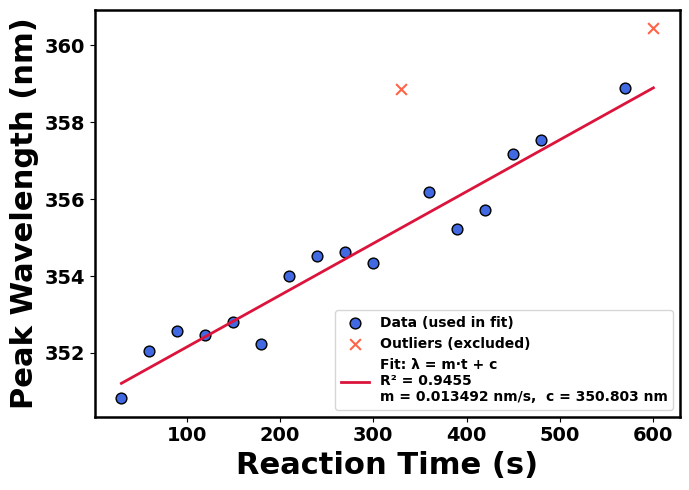

In [30]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721,
                    352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173,
                    354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755,
                    355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 
                    358.89064710214234, 360.44156437430405])  

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [-1, -8]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# --- Linear Fit ---
coef, cov = np.polyfit(t[mask], y[mask], deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y[mask] - y_fit[mask])**2)
ss_total = np.sum((y[mask] - np.mean(y[mask]))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 7 Excitation Peak Values vs Reaction time, Linear Fit, Outlier Excluded", dpi = 1200)
plt.show()

### 8.6 Run 8

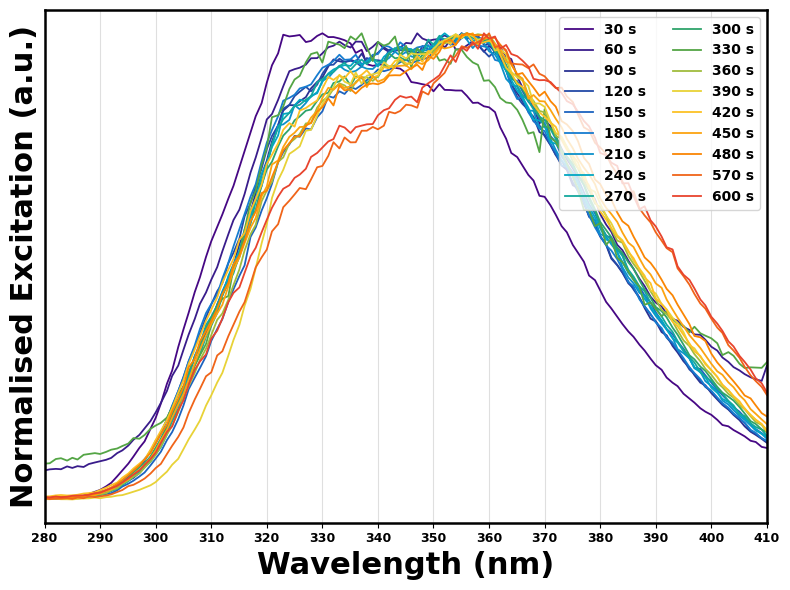

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 8 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 280, 410

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 8 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       336.51        118.5         quadratic_vertex
60 s                       344.13        71.29         quadratic_vertex
90 s                       347.49        97.18         quadratic_vertex
120 s                      346.88        88.33         quadratic_vertex
150 s                      351.00        81.23         quadratic_vertex
180 s                      346.48        79.65         quadratic_vertex
210 s                      347.82        73.77         quadratic_vertex
240 s                      347.79        74.98         quadratic_vertex
270 s                      348.53        73.03         quadratic_vertex
300 s                      350.00         71.1         quadratic_vertex
330 s                      342.66        20.46         quadratic_vertex
360 s                      351.33        72.93         quadratic_vertex
390 s                      350.57         72.1         quadratic

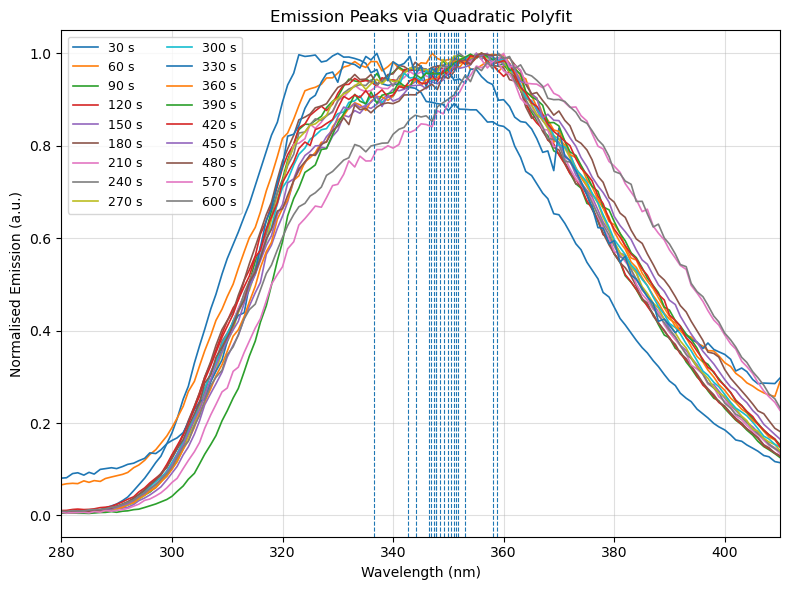

In [91]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 8 FL excitation.csv"   # your tidy emission file
wl_min     = 280                             # analysis window (nm)
wl_max     = 410
window_nm  = 50                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

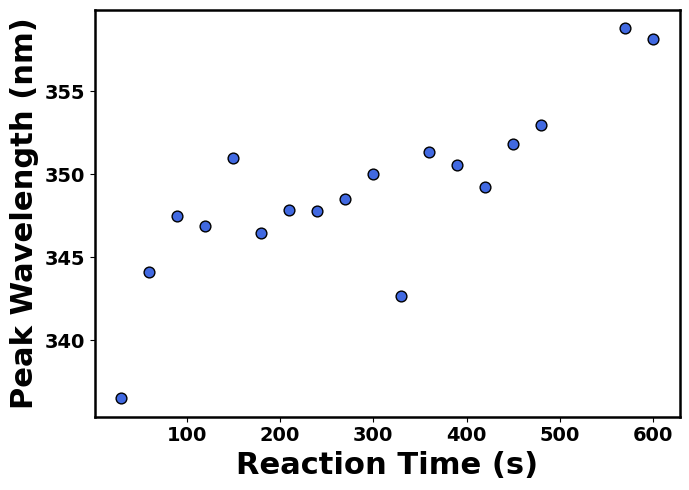

In [53]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 
                    351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 
                    348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 
                    350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 
                    358.77399258388596, 358.125437777175]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run 8 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.024142 ± 0.004476 (nm/s)
c = 341.966 ± 1.504 (nm)
R2 = 0.6451


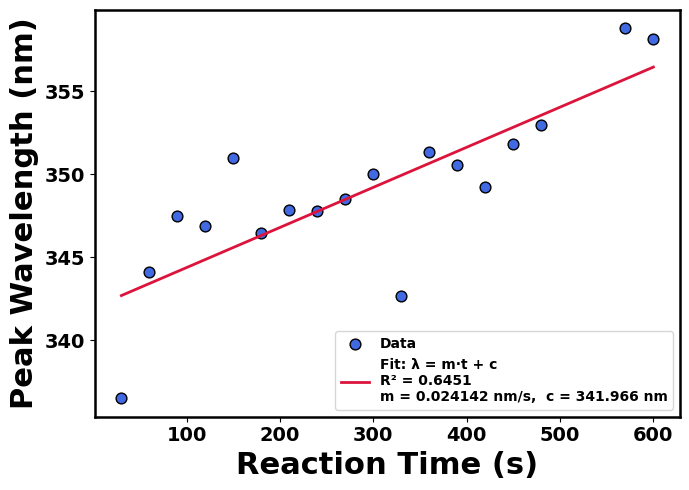

In [31]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 
                    351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 
                    348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 
                    350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 
                    358.77399258388596, 358.125437777175]) 


# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 8 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.014306 ± 0.000991 (nm/s)
c = 350.674 ± 0.343 (nm)
R2 = 0.9370


/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/2850218170.py:62: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(reaction_time[~mask], peak_nm[~mask],


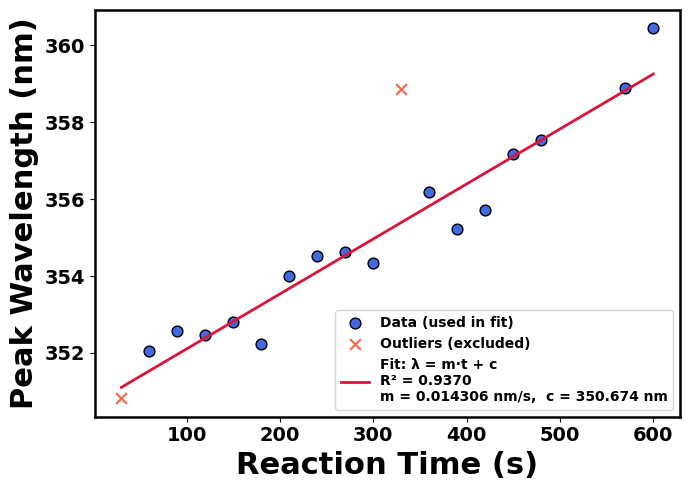

In [32]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721,
                    352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173,
                    354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755,
                    355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 
                    358.89064710214234, 360.44156437430405])  

# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# ==== manually choose outliers by index ====
# (for example, if you want to exclude the 8th and 13th points)
outlier_idx = [0, -8]  # 0-based indexing
mask = np.ones_like(reaction_time, dtype=bool)
mask[outlier_idx] = False

# --- Linear Fit ---
coef, cov = np.polyfit(t[mask], y[mask], deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y[mask] - y_fit[mask])**2)
ss_total = np.sum((y[mask] - np.mean(y[mask]))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# inliers (used in fit)
plt.scatter(reaction_time[mask], peak_nm[mask],
            color="royalblue", edgecolor="k", s=60, label="Data (used in fit)")

# outliers (excluded)
plt.scatter(reaction_time[~mask], peak_nm[~mask],
            color="tomato", edgecolor="k", s=60, marker="x", label="Outliers (excluded)")

plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 8 Excitation Peak Values vs Reaction time, Linear Fit, Outlier Excluded", dpi = 1200)
plt.show()

### 8.7 Run 9

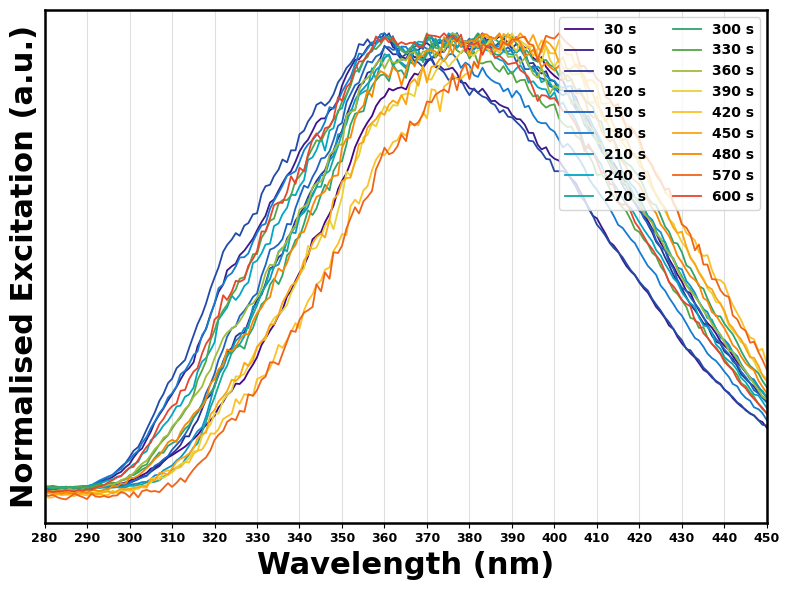

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps

# ---------- Colour assigner (time-ordered, violet→blue→cyan→green→yellow→orange→red) ----------
def assign_colors_monotonic(traces, cmap_name="unused"):
    """
    Assign colours that strictly follow reaction time:
      earliest → violet, latest → red, with blue/cyan/green/yellow/orange in between.
    Parses time tokens in labels (e.g., "30 s", "2 min", "120sec").
    Traces with no parsable time go after timed ones (original order) and still get unique colours.

    Returns: dict {label: RGBA}
    """
    import re
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap

    # --- parse reaction time (in seconds) from label ---
    def _parse_time_seconds(label: str):
        s = str(label).lower().strip()
        # seconds
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:s|sec|secs|second|seconds)\b', s)
        if m: return float(m.group(1))
        # minutes
        m = re.search(r'(\d+(?:\.\d+)?)\s*(?:m|min|mins|minute|minutes)\b', s)
        if m: return float(m.group(1)) * 60.0
        # compact forms like "120s", "2min"
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)s\b', s)
        if m: return float(m.group(1))
        m = re.search(r'(\d+(?:\.\d+)?)(?:\s*)min(?:s)?\b', s)
        if m: return float(m.group(1)) * 60.0
        return np.nan

    # Build sortable list: (label, time_in_s, original_index)
    meta = []
    for idx, t in enumerate(traces):
        tau = _parse_time_seconds(t.get("label", ""))
        meta.append((t["label"], tau, idx))

    # Sort: timed first by ascending time, then untimed by original order
    meta_sorted = sorted(meta, key=lambda x: (not np.isfinite(x[1]), x[1], x[2]))

    N = len(meta_sorted)
    if N == 0:
        return {}

    # Smooth spectral-like ramp: violet → blue → cyan → green → yellow → orange → red
    # (hand-picked, high-contrast stops for clear ordering across many traces)
    spectral_v2r = LinearSegmentedColormap.from_list(
        "spectral_violet_to_red",
        [
            "#4B0082",  # violet/indigo
            "#283593",  # deep blue
            "#1976D2",  # blue
            "#00ACC1",  # cyan
            "#43A047",  # green
            "#FDD835",  # yellow
            "#FB8C00",  # orange
            "#E53935",  # red
        ]
    )

    # Evenly spaced unique colours along the ramp (avoid exact extremes)
    positions = np.linspace(0.02, 0.98, N)
    label_to_color = {label: spectral_v2r(pos) for pos, (label, _, _) in zip(positions, meta_sorted)}
    return label_to_color

# ---------- load tidy fluorescence file ----------
df = pd.read_csv("Run 9 FL excitation.csv")
wavelength_col = df.columns[0]
wl = pd.to_numeric(df[wavelength_col], errors="coerce")

# Define wavelength window
wl_min, wl_max = 280, 450

# ---------- collect traces ----------
traces = []
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors="coerce")

    # crop the wavelength and signal to the desired range
    mask = (wl >= wl_min) & (wl <= wl_max)
    wl_crop = wl[mask]
    y_crop = y[mask]

    # skip empty or invalid traces
    if len(wl_crop) == 0 or np.all(np.isnan(y_crop)):
        continue

    # local normalization for each trace within the cropped range
    ymax_local = np.nanmax(y_crop)
    if not np.isfinite(ymax_local) or ymax_local == 0:
        continue

    # Normalize the trace individually by its local maximum
    y_norm = y_crop / ymax_local
    traces.append({"label": col, "wl": wl_crop, "abs": y_norm})

# ---------- assign colours ----------
label_to_color = assign_colors_monotonic(traces, cmap_name="turbo")

# ---------- plotting ----------
plt.figure(figsize=(8, 6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
for t in traces:
    color = label_to_color.get(t["label"], None)
    plt.plot(t["wl"], t["abs"], label=t["label"], color=color, linewidth=1.3)

# ---------- formatting ----------
plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Normalised Excitation (a.u.)", fontsize=22, fontweight="bold")
plt.xticks(np.arange(wl_min, wl_max + 1, 10), fontsize=9, fontweight="bold")
plt.yticks([])
plt.xlim(wl_min, wl_max)
#plt.ylim(0, 1.05)
plt.grid(True, alpha=0.4)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig('Run 9 Excitation Spectra.png', dpi=1200)
plt.show()

Label                   Peak (nm)    Intensity                   Method
30 s                       383.27        105.7         quadratic_vertex
60 s                       364.91        94.42         quadratic_vertex
90 s                       377.50        62.29         quadratic_vertex
120 s                      363.48        67.09         quadratic_vertex
150 s                      375.20        43.74         quadratic_vertex
180 s                      367.08        50.26         quadratic_vertex
210 s                      378.63        33.09         quadratic_vertex
240 s                      372.96        37.61         quadratic_vertex
270 s                      378.19        30.24         quadratic_vertex
300 s                      382.36        24.97         quadratic_vertex
330 s                      370.04         35.6         quadratic_vertex
360 s                      377.45        27.46         quadratic_vertex
390 s                      387.07        18.16         quadratic

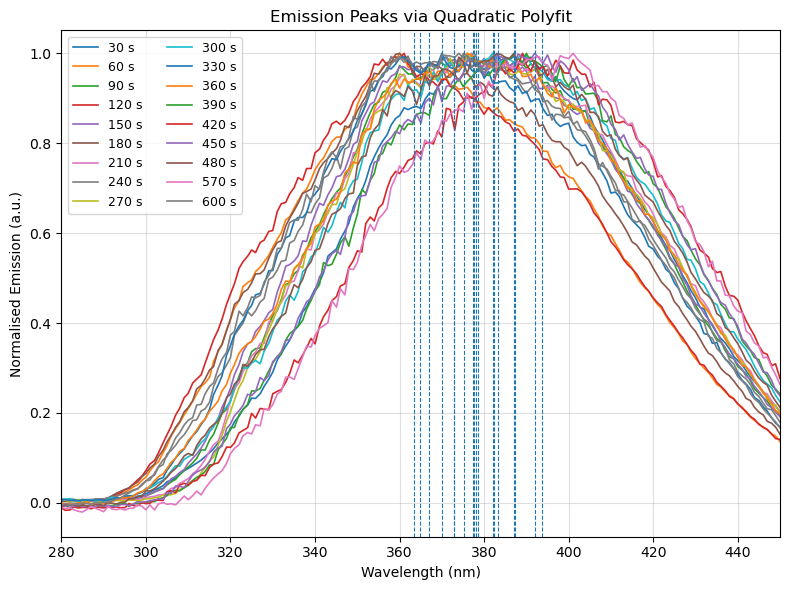

In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== SETTINGS ====
csv_path   = "Run 9 FL excitation.csv"   # your tidy emission file
wl_min     = 280                             # analysis window (nm)
wl_max     = 450
window_nm  = 50                              # width of quadratic-fit window around the max (nm)
smooth_win = 5                               # moving-average points for light smoothing (odd int)

# ---- small helpers ----
def moving_average(y, win=5):
    win = max(1, int(win) | 1)   # make odd
    if win == 1:
        return y
    k = np.ones(win, dtype=float) / win
    return np.convolve(y, k, mode="same")

def peak_polyfit(wavelength, intensity,
                 wl_min=None, wl_max=None,
                 window_nm=20, smooth_win=5):
    """
    Find emission peak by fitting a quadratic near the max:
      1) (optional) smooth curve
      2) find rough maximum index inside [wl_min, wl_max]
      3) fit y = a x^2 + b x + c within ± window_nm/2 around the max
      4) peak at x* = -b/(2a); fallback to argmax if a >= 0 or ill-conditioned
    Returns: peak_wavelength_nm, peak_intensity, method
    """
    # prepare arrays
    wl = np.asarray(pd.to_numeric(wavelength, errors='coerce'), float)
    y  = np.asarray(pd.to_numeric(intensity,  errors='coerce'), float)

    # finite and window mask
    m = np.isfinite(wl) & np.isfinite(y)
    if wl_min is not None: m &= (wl >= wl_min)
    if wl_max is not None: m &= (wl <= wl_max)
    wl, y = wl[m], y[m]
    if wl.size < 5:
        return np.nan, np.nan, "too_few_points"

    # light smoothing to stabilise the maximum
    y_s = moving_average(y, smooth_win) if smooth_win and smooth_win > 1 else y

    # rough max index
    i0 = int(np.nanargmax(y_s))
    wl0 = wl[i0]

    # window for quadratic fit
    half = window_nm / 2.0
    mw = (wl >= wl0 - half) & (wl <= wl0 + half)
    x = wl[mw]; z = y_s[mw]

    # if not enough points, expand once
    if x.size < 5:
        mw = (wl >= wl0 - max(half, 10)) & (wl <= wl0 + max(half, 10))
        x = wl[mw]; z = y_s[mw]

    if x.size < 3:
        # fallback: just use argmax location
        return float(wl0), float(y[i0]), "argmax_fallback"

    # quadratic fit
    try:
        a, b, c = np.polyfit(x, z, 2)
    except Exception:
        return float(wl0), float(y[i0]), "fit_error_fallback"

    # vertex
    if a >= 0:  # not a concave peak -> fallback
        return float(wl0), float(y[i0]), "non_concave_fallback"

    x_star = -b / (2*a)
    # clamp to analysis window if necessary
    if (wl_min is not None and x_star < wl_min) or (wl_max is not None and x_star > wl_max):
        return float(wl0), float(y[i0]), "oob_fallback"

    y_star = a*x_star**2 + b*x_star + c
    return float(x_star), float(y_star), "quadratic_vertex"

# ==== LOAD & RUN ====
df = pd.read_csv(csv_path)

# first column = wavelength; others = emission traces
wl = pd.to_numeric(df.iloc[:, 0], errors='coerce')

results = []   # (label, peak_nm, peak_intensity, method)
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    pk_nm, pk_I, method = peak_polyfit(
        wl, y,
        wl_min=wl_min, wl_max=wl_max,
        window_nm=window_nm, smooth_win=smooth_win
    )
    results.append((col, pk_nm, pk_I, method))

# pretty print
print("Label".ljust(22), "Peak (nm)".rjust(10), "Intensity".rjust(12), "Method".rjust(24))
for label, pk_nm, pk_I, method in results:
    print(f"{label.ljust(22)} {pk_nm:10.2f} {pk_I:12.4g} {method:>24}")

# just the wavelengths as a list
peak_list = [pk_nm for _, pk_nm, _, _ in results]
print("\npeak_list =", peak_list)

# ==== (optional) quick check plot with markers ====
plt.figure(figsize=(8,6))
for col in df.columns[1:]:
    y = pd.to_numeric(df[col], errors='coerce')
    # local normalisation for display
    ymax = np.nanmax(y)
    if not np.isfinite(ymax) or ymax == 0: 
        continue
    plt.plot(wl, y/ymax, lw=1.2, label=col)

for label, pk_nm, _, _ in results:
    if np.isfinite(pk_nm):
        plt.axvline(pk_nm, ls="--", lw=0.8)

plt.xlim(wl_min, wl_max)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Normalised Emission (a.u.)")
plt.title("Emission Peaks via Quadratic Polyfit")
plt.grid(True, alpha=0.4)
plt.legend(fontsize=9, ncol=2)
plt.tight_layout()
plt.show()

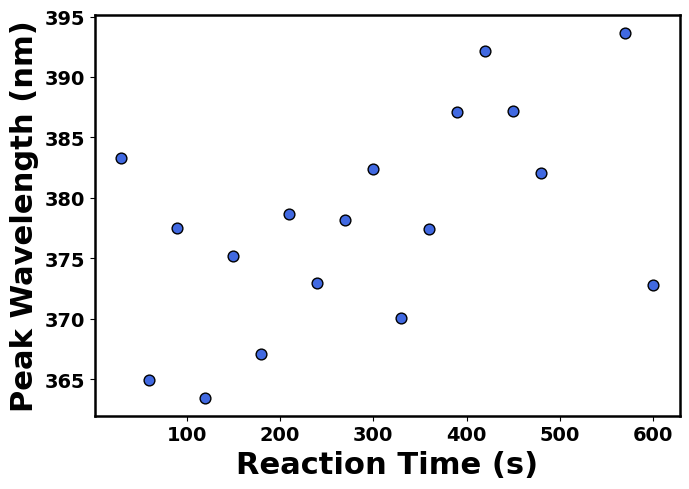

In [55]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 
                    375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 
                    378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 
                    387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 
                    393.6165995112899, 372.77779768474863]) 

# --- plot scatter + optional line ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, color="royalblue", edgecolor="k", s=60, zorder=3)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.title("Emission Peak Values vs. Reaction Time", fontsize=16, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("Run9 Excitation Peak Values vs Reaction time", dpi = 1200)
plt.show()

#Linear Fit: λ = m t + c
m = 0.026856 ± 0.010841 (nm/s)
c = 370.275 ± 3.642 (nm)
R2 = 0.2772


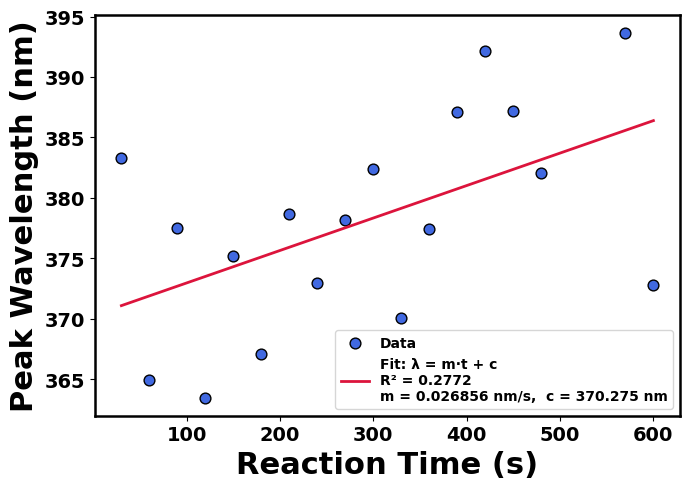

In [33]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
peak_nm = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 
                    375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 
                    378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 
                    387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 
                    393.6165995112899, 372.77779768474863])


# --- Basic Sanity: same length + finite values ---
n = min(len(reaction_time), len(peak_nm))
t = reaction_time[:n].astype(float)
y = peak_nm[:n].astype(float)

m = np.isfinite(t) & np.isfinite(y)
t,y = t[m], y[m]

if t.size < 2:
    raise ValueError("Not Enough Valid Points")

# --- Linear Fit ---
coef, cov = np.polyfit(t, y, deg=1, cov=True)
m_fit, c_fit = coef
perr = np.sqrt(np.diag(cov))

# --- R^2 ---
y_fit = m_fit*t + c_fit
ss_res = np.sum((y - y_fit)**2)
ss_total = np.sum((y - np.mean(y))**2)
r2 = 1 - ss_res/ss_total

# --- Smooth Line ---
t_fit = np.linspace(t.min(), t.max(), 300)
y_line = m_fit*t_fit + c_fit

# --- Print Results ---
print("#Linear Fit: λ = m t + c")
print(f"m = {m_fit:.6f} ± {perr[0]:.6f} (nm/s)")
print(f"c = {c_fit:.3f} ± {perr[1]:.3f} (nm)")
print(f"R2 = {r2:.4f}")

# --- Plot ---
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(reaction_time, peak_nm, s=60, color='royalblue', edgecolor='k', label='Data')
plt.plot(t_fit, y_line, color="crimson", lw=2,
         label=f"Fit: λ = m·t + c\nR² = {r2:.4f}\nm = {m_fit:.6f} nm/s,  c = {c_fit:.3f} nm")

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("Peak Wavelength (nm)", fontsize=22, fontweight='bold')
plt.xticks(fontweight='bold', fontsize = 14)
plt.yticks(fontweight='bold', fontsize = 14)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'lower right')
plt.tight_layout()
plt.savefig("Run 9 Excitation Peak Values vs Reaction time, Linear Fit", dpi = 1200)
plt.show()

## 9. UV-Vis Peaks

### 9.1 Whole picture (Run 1 Included)

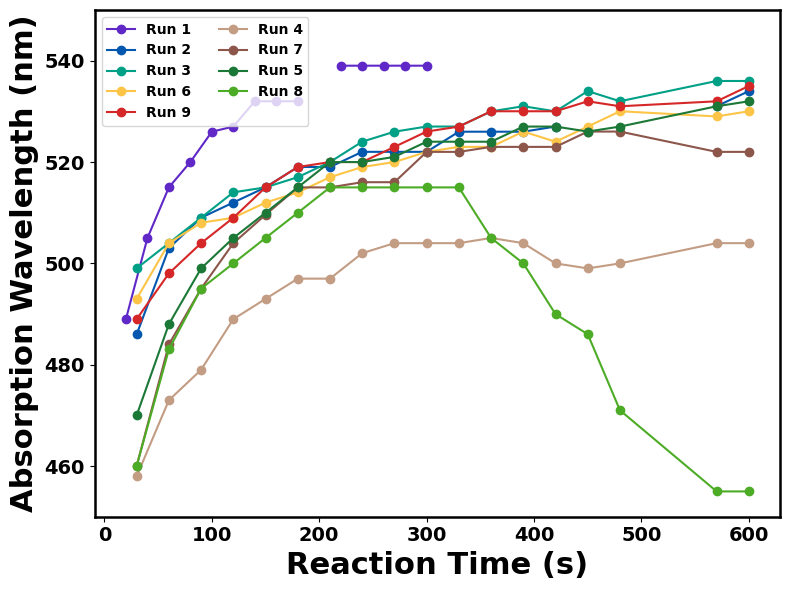

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
reaction_time_run1 = np.array([20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 101, 101, 101])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run1 = df.iloc[:,1]
run2 = df.iloc[:,3]
run3 = df.iloc[:,4]
run6 = df.iloc[:,7]
run9 = df.iloc[:,10]
run4 = df.iloc[:,5]
run7 = df.iloc[:,8]
run5 = df.iloc[:,6]
run8 = df.iloc[:,9]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time_run1, run1, 'o-', label = 'Run 1', color = '#5F28C7')
plt.plot(reaction_time, run2, 'o-', label = 'Run 2', color = '#0357AE')
plt.plot(reaction_time, run3, 'o-', label = 'Run 3', color = '#00A087')
plt.plot(reaction_time, run6, 'o-', label = 'Run 6', color = '#FDC548')
plt.plot(reaction_time, run9, 'o-', label = 'Run 9', color = '#D62728')
plt.plot(reaction_time, run4, 'o-', label = 'Run 4', color = '#C39C84')
plt.plot(reaction_time, run7, 'o-', label = 'Run 7', color = '#8C564B')
plt.plot(reaction_time, run5, 'o-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8, 'o-', label = 'Run 8', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 550)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Whole Picture.png", dpi = 1200)
plt.show()

### 9.2 1.33:1 concentration (Run 1 Included)

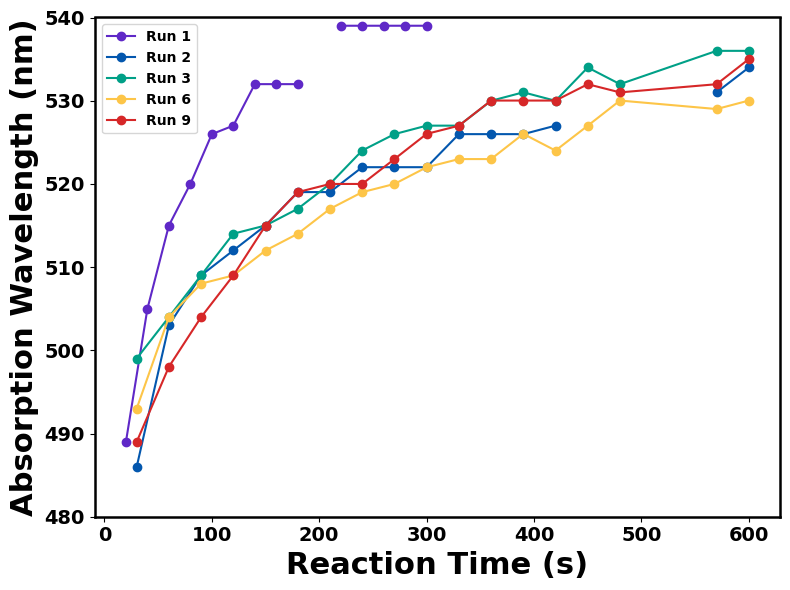

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
reaction_time_run1 = np.array([20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 101, 101, 101])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run1 = df.iloc[:,1]
run2 = df.iloc[:,3]
run3 = df.iloc[:,4]
run6 = df.iloc[:,7]
run9 = df.iloc[:,10]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time_run1, run1, 'o-', label = 'Run 1', color = '#5F28C7')
plt.plot(reaction_time, run2, 'o-', label = 'Run 2', color = '#0357AE')
plt.plot(reaction_time, run3, 'o-', label = 'Run 3', color = '#00A087')
plt.plot(reaction_time, run6, 'o-', label = 'Run 6', color = '#FDC548')
plt.plot(reaction_time, run9, 'o-', label = 'Run 9', color = '#D62728')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(480, 540)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Cd-Se = 1.33.png", dpi = 1200)
plt.show()

### 9.3 1:3 Concentration

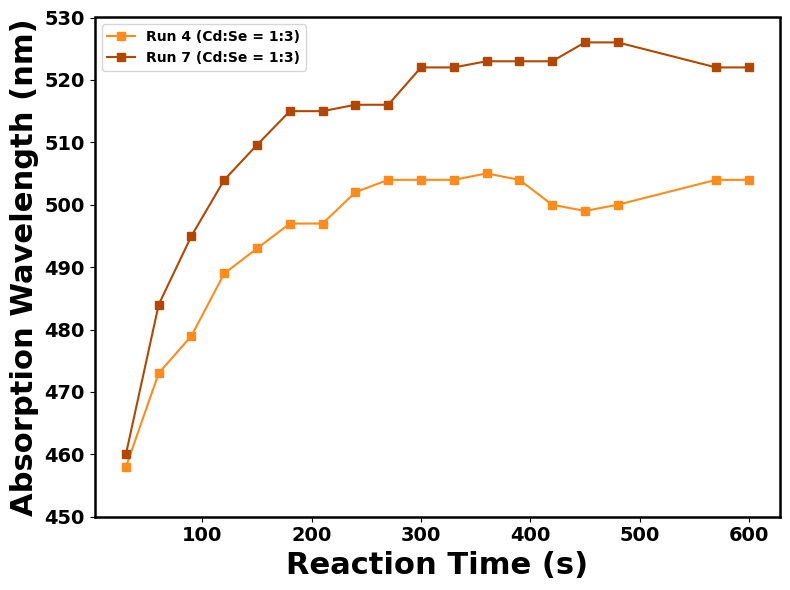

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run4 = df.iloc[:,5]
run7 = df.iloc[:,8]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time, run4, 's-', label = 'Run 4 (Cd:Se = 1:3)', color = '#FF8C1A')
plt.plot(reaction_time, run7, 's-', label = 'Run 7 (Cd:Se = 1:3)', color = '#B34700')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 530)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Cd-Se = 0.33.png", dpi = 1200)
plt.show()

### 9.4 1:5 Concentration

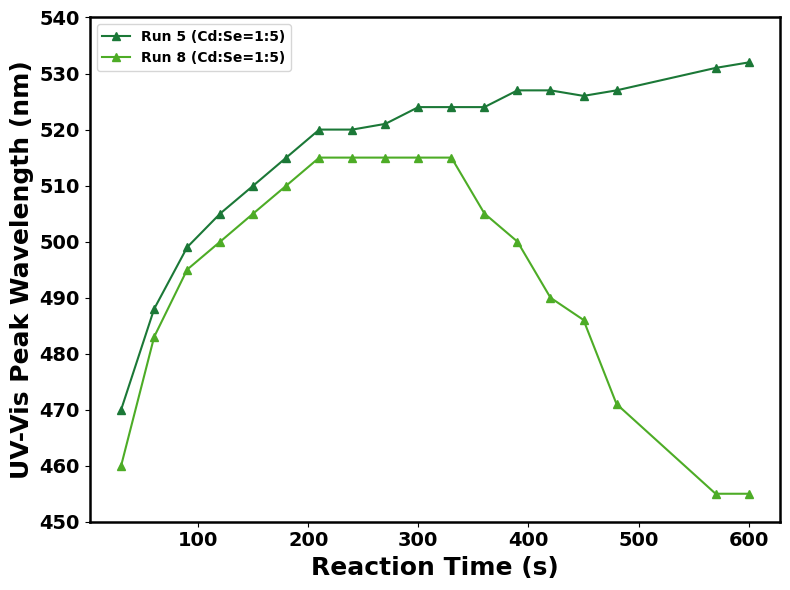

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run5 = df.iloc[:,6]
run8 = df.iloc[:,9]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time, run5, '^-', label = 'Run 5 (Cd:Se=1:5)', color = '#1B7837')
plt.plot(reaction_time, run8, '^-', label = 'Run 8 (Cd:Se=1:5)', color = '#4DAC26')


plt.xlabel("Reaction Time (s)", fontsize=18, fontweight="bold")
plt.ylabel("UV-Vis Peak Wavelength (nm)", fontsize=18, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 540)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Cd-Se = 0.2.png", dpi = 1200)
plt.show()

### 9.5 One of the best

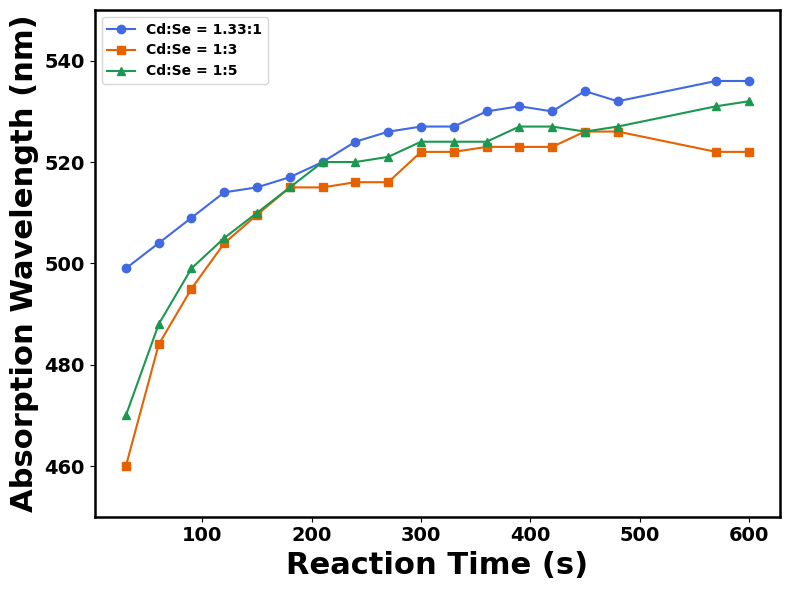

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run3 = df.iloc[:,4]
run7 = df.iloc[:,8]
run5 = df.iloc[:,6]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time, run3, 'o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.plot(reaction_time, run7, 's-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.plot(reaction_time, run5, '^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 550)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_One of its best.png", dpi = 1200)
plt.show()

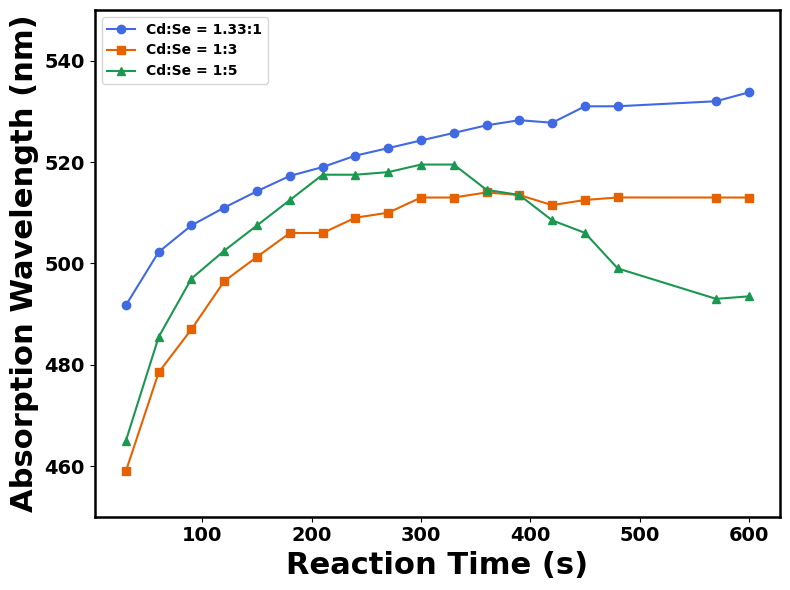

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
Abs_133_cols = [3,4,7,10]
Abs_133 = df.iloc[:, Abs_133_cols].mean(axis=1)
Abs_033_cols = [5,8]
Abs_033 = df.iloc[:, Abs_033_cols].mean(axis=1)
Abs_020_cols = [6,9]
Abs_020 = df.iloc[:, Abs_020_cols].mean(axis=1)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, Abs_133, 'o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.plot(reaction_time, Abs_033, 's-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.plot(reaction_time, Abs_020, '^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 550)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_Average.png", dpi = 1200)
plt.show()

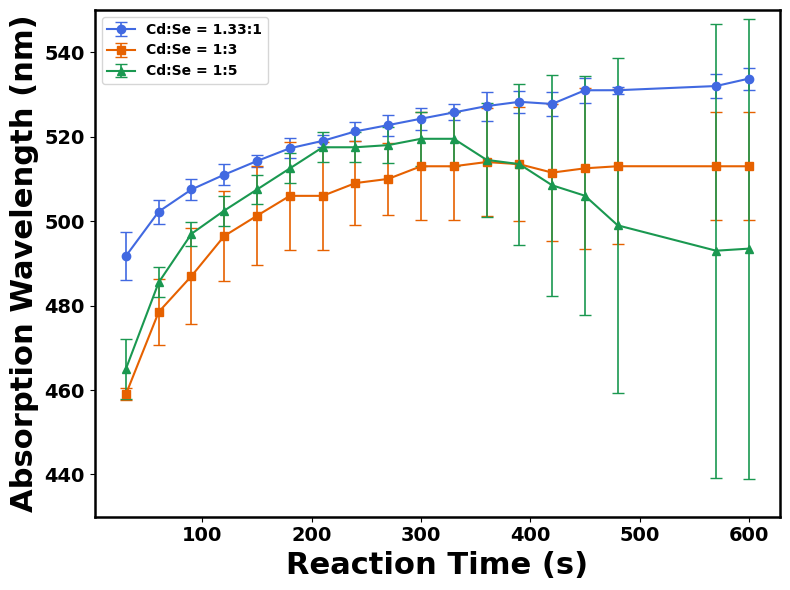

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
Abs_133_cols = [3,4,7,10]
Abs_133 = df.iloc[:, Abs_133_cols].mean(axis=1)
Abs_033_cols = [5,8]
Abs_033 = df.iloc[:, Abs_033_cols].mean(axis=1)
Abs_020_cols = [6,9]
Abs_020 = df.iloc[:, Abs_020_cols].mean(axis=1)

Err_133 = df.iloc[:, Abs_133_cols].std(axis=1)
Err_033 = df.iloc[:, Abs_033_cols].std(axis=1)
Err_020 = df.iloc[:, Abs_020_cols].std(axis=1)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.errorbar(reaction_time, Abs_133, yerr=Err_133, elinewidth=1.2, capsize=4, fmt='o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.errorbar(reaction_time, Abs_033, yerr=Err_033, elinewidth=1.2, capsize=4, fmt='s-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.errorbar(reaction_time, Abs_020, yerr=Err_020, elinewidth=1.2, capsize=4, fmt='^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(430, 550)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_Average_Error bars.png", dpi = 1200)
plt.show()

C:\Users\al6323\AppData\Local\Temp\ipykernel_21608\2359110517.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


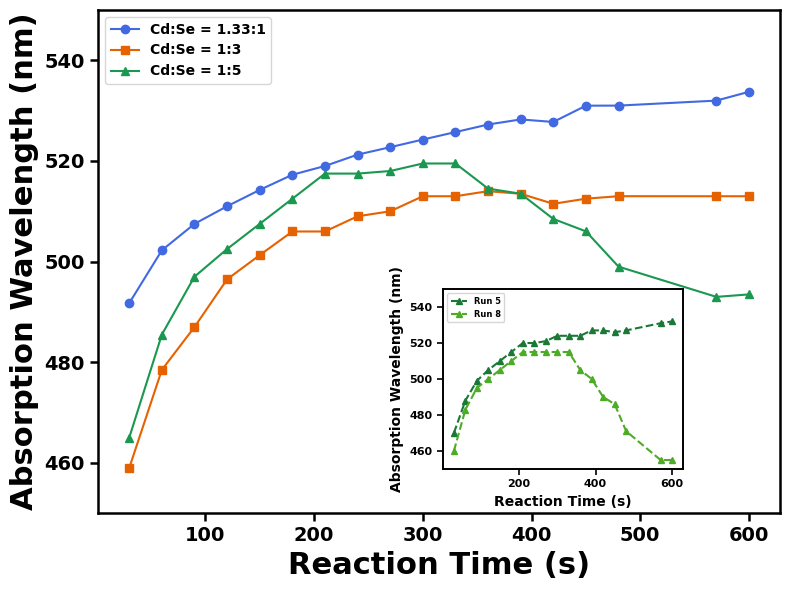

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
Abs_133_cols = [3,4,7,10]
Abs_133 = df.iloc[:, Abs_133_cols].mean(axis=1)
Abs_033_cols = [5,8]
Abs_033 = df.iloc[:, Abs_033_cols].mean(axis=1)
Abs_020_cols = [6,9]
Abs_020 = df.iloc[:, Abs_020_cols].mean(axis=1)


# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Abs_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Abs_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Abs_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylim(450, 550)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time,df.iloc[:,6], '^--', ms=4, color='#1B7837', label='Run 5')
inset_ax.plot(reaction_time, df.iloc[:,9], '^--', ms=4, color='#4DAC26', label='Run 8')

#inset_ax.set_title("Run 5 vs Run 8 (Raw Data)", fontsize=11, fontweight="bold", pad=6)
inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Absorption Wavelength (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_ylim(450,550)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_Average_1:5 Subplot Included_Abs.png", dpi=1200)
plt.show()

C:\Users\al6323\AppData\Local\Temp\ipykernel_21608\2548608852.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


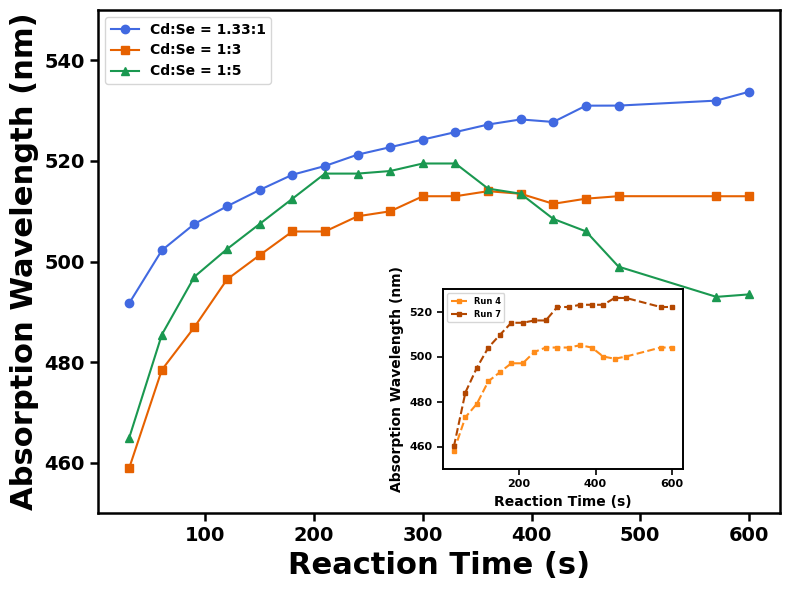

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
Abs_133_cols = [3,4,7,10]
Abs_133 = df.iloc[:, Abs_133_cols].mean(axis=1)
Abs_033_cols = [5,8]
Abs_033 = df.iloc[:, Abs_033_cols].mean(axis=1)
Abs_020_cols = [6,9]
Abs_020 = df.iloc[:, Abs_020_cols].mean(axis=1)


# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Abs_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Abs_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Abs_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylim(450, 550)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time,df.iloc[:,5], 's--', ms=3, color='#FF8C1A', label='Run 4')
inset_ax.plot(reaction_time, df.iloc[:,8], 's--', ms=3, color='#B34700', label='Run 7')

#inset_ax.set_title("Run 5 vs Run 8 (Raw Data)", fontsize=11, fontweight="bold", pad=6)
inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Absorption Wavelength (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_ylim(450,530)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_Average_1:3 Subplot Included_Abs.png", dpi=1200)
plt.show()

C:\Users\al6323\AppData\Local\Temp\ipykernel_21608\197225375.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


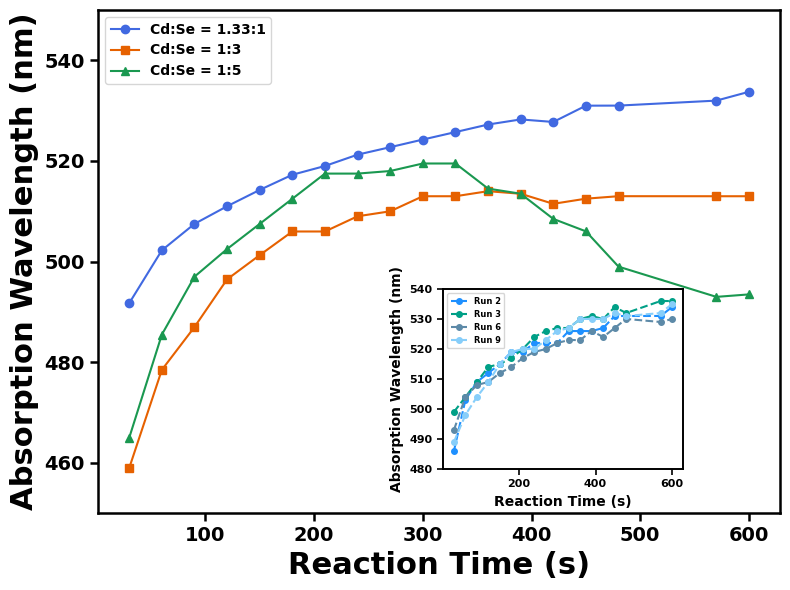

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
Abs_133_cols = [3,4,7,10]
Abs_133 = df.iloc[:, Abs_133_cols].mean(axis=1)
Abs_033_cols = [5,8]
Abs_033 = df.iloc[:, Abs_033_cols].mean(axis=1)
Abs_020_cols = [6,9]
Abs_020 = df.iloc[:, Abs_020_cols].mean(axis=1)


# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Abs_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Abs_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Abs_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylim(450, 550)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time,df.iloc[:,3], 'o--', ms=4, color='#1E90FF', label='Run 2')
inset_ax.plot(reaction_time, df.iloc[:,4], 'o--', ms=4, color='#00A087', label='Run 3')
inset_ax.plot(reaction_time, df.iloc[:,7], 'o--', ms=4, color='#5D8AA8', label='Run 6')
inset_ax.plot(reaction_time, df.iloc[:,10], 'o--', ms=4, color= '#87CEFA', label='Run 9')

#inset_ax.set_title("Run 5 vs Run 8 (Raw Data)", fontsize=11, fontweight="bold", pad=6)
inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Absorption Wavelength (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_ylim(480,540)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Concentration Comparison_Average_1.33:1 Subplot Included_Abs.png", dpi=1200)
plt.show()

### 9.6 Whole picture (Run 1 Not Included)

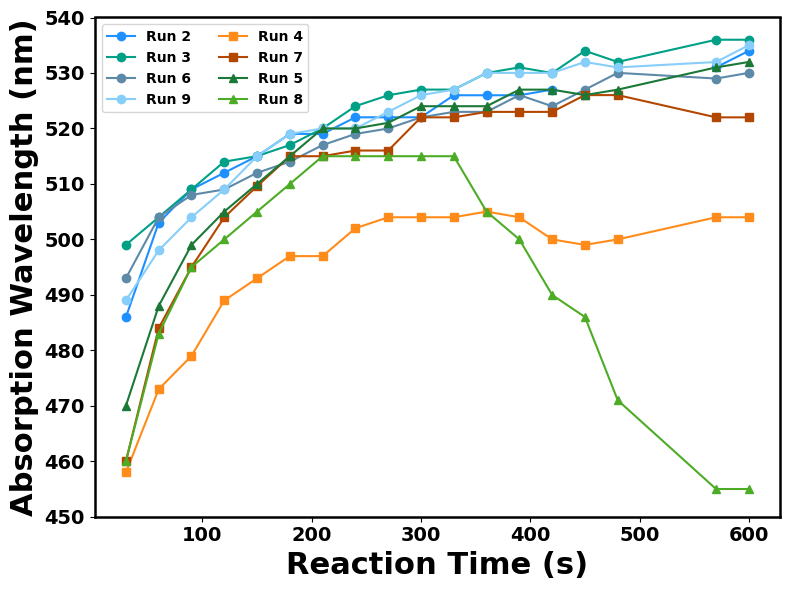

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run2 = df.iloc[:,3]
run3 = df.iloc[:,4]
run6 = df.iloc[:,7]
run9 = df.iloc[:,10]
run4 = df.iloc[:,5]
run7 = df.iloc[:,8]
run5 = df.iloc[:,6]
run8 = df.iloc[:,9]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, run2, 'o-', label = 'Run 2', color = '#1E90FF')
plt.plot(reaction_time, run3, 'o-', label = 'Run 3', color = '#00A087')
plt.plot(reaction_time, run6, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9, 'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, run4, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, run7, 's-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, run5, '^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8, '^-', label = 'Run 8', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(450, 540)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Whole Picture Run 1 Excluded.png", dpi = 1200)
plt.show()

### 9.7 1.33:1 concentration (Run 1 Not Included)

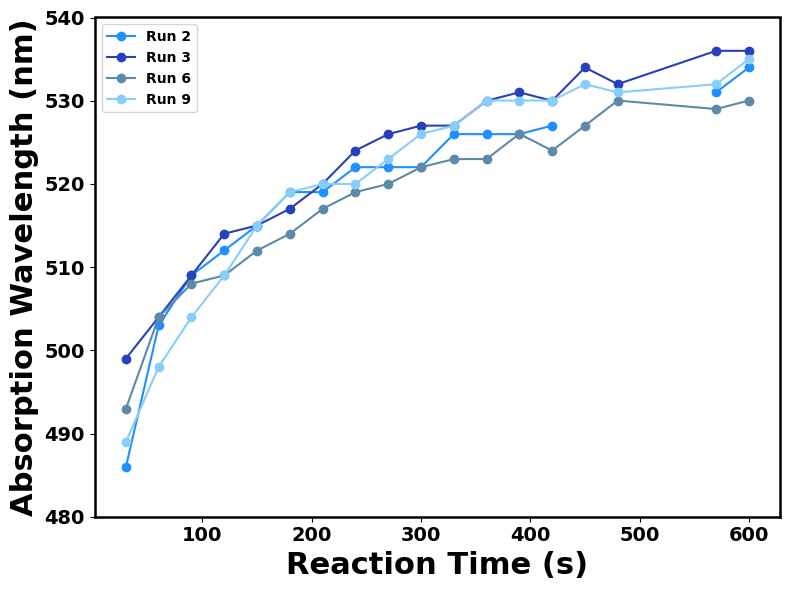

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

csv_path = 'UV-Vis Peak Values.csv'
df = pd.read_csv(csv_path)
run2 = df.iloc[:,3]
run3 = df.iloc[:,4]
run6 = df.iloc[:,7]
run9 = df.iloc[:,10]

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time, run2, 'o-', label = 'Run 2', color = '#1E90FF')
plt.plot(reaction_time, run3, 'o-', label = 'Run 3', color = '#2740BB')
plt.plot(reaction_time, run6, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9, 'o-', label = 'Run 9', color = '#87CEFA')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(480, 540)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("UV-Vis Peak Values vs Reaction time Cd-Se = 1.33 Run 1 Excluded.png", dpi = 1200)
plt.show()

## 10. All Emission vs Absorption

### 10.1 Emi vs Abs Figure

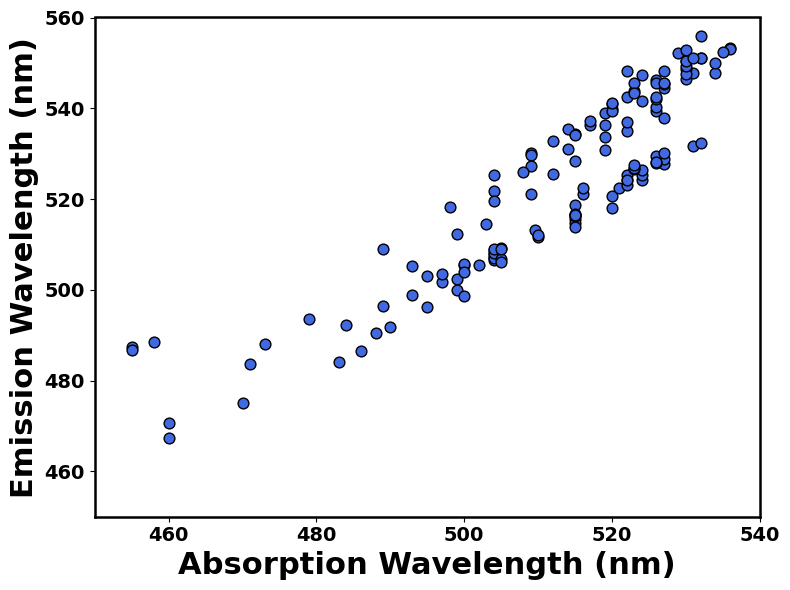

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

Abs_array = []
Abs_run2 = [485.98003, 503.00574, 509.00899, 512.00478, 515.00067, 519.0174, 519.0174, 522.00873, 522.00873, 522.00873, 525.98145, 525.98145, 525.98145, 527.00244, 0, 0, 531.00854, 533.99194]
Abs_run3 = [499.01324, 503.99377, 509.00699, 514.01489, 515.00067, 517.00946, 520.00201, 524.0144, 525.98145, 527.00244, 527.00244, 529.98853, 531.00854, 529.98853, 533.99194, 531.9906, 535.99225, 535.99225]
Abs_run4 = [457.98242, 472.9936, 478.99353, 488.990204, 492.991, 496.98331, 496.98331, 502.00891, 503.98535, 503.98535, 503.98535, 505.0112, 503.98535, 499.99368, 499.004791, 499.99368, 503.98535, 503.98535]
Abs_run5 = [470.010162, 487.99912, 499.00479, 505.0112, 509.98541, 514.99231, 519.99371, 519.99371, 521.01559, 524.00604, 524.00604, 524.00604, 526.9942, 526.9942, 526.010099, 526.9942, 531.00031, 531.98242]
Abs_run6 = [492.991, 503.98535, 508.01154, 508.99857, 511.9964, 514.00653, 517.0011, 519.00897, 519.99371, 522.00037, 522.98444, 522.98444, 526.01099, 524.00604, 526.9942, 530.01807, 528.99768, 530.01807]
Abs_run7 = [460.016937, 483.99588, 495.01016, 503.98062, 509.58987, 514.99249, 514.99249, 516.01593, 516.01593, 522.00037, 522.00037, 522.98438, 522.98438, 522.98438, 526.0108, 526.0108, 522.00037, 522.00037]
Abs_run8 = [460.016937, 483.00378, 495.01016, 499.99463, 505.0119, 509.98587, 514.99249, 514.99249, 514.99249, 514.99249, 514.99249, 505.011902, 499.99463, 489.982513, 486.0177, 471.006867, 454.993073, 454.993073]
Abs_run9 = [488.99161, 498.0166, 503.98602, 508.99908, 514.992249, 519.00916, 519.99384, 519.99384, 522.98438, 526.0108, 526.9939, 530.01764, 530.01764, 530.01764, 531.98199, 530.99994, 531.98199, 535.00232]

Abs_array += Abs_run2
Abs_array += Abs_run3
Abs_array += Abs_run4
Abs_array += Abs_run5
Abs_array += Abs_run6
Abs_array += Abs_run7
Abs_array += Abs_run8
Abs_array += Abs_run9

Abs_array = np.array(Abs_array)

Emi_array = []
Emi_run2 = [0, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, 0, 0, 0, 547.8703954178537]
Emi_run3 = [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164]
Emi_run4 = [488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784]
Emi_run5 = [474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468]
Emi_run6 = [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843]
Emi_run7 = [467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371]
Emi_run8 = [470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948]
Emi_run9 = [509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501]

Emi_array += Emi_run2
Emi_array += Emi_run3
Emi_array += Emi_run4
Emi_array += Emi_run5
Emi_array += Emi_run6
Emi_array += Emi_run7
Emi_array += Emi_run8
Emi_array += Emi_run9

Emi_array = np.array(Emi_array)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(Abs_array, Emi_array, color = 'royalblue', marker = 'o', edgecolor="k", s=60, zorder=3)
plt.xlabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
# plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.gca().xaxis.set_major_locator(MultipleLocator(20))
plt.yticks(fontsize=14, fontweight="bold")
plt.xlim(450,540)
plt.ylim(450,560)
#plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig('Emission vs Absorption Peak Positions.png', dpi=1200)
plt.show()

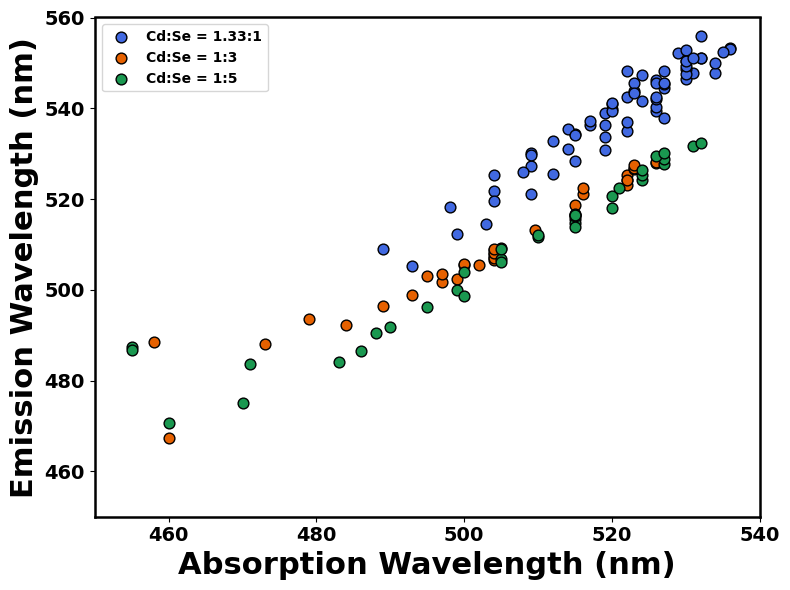

In [50]:
import numpy as np
import matplotlib.pyplot as plt

Abs_array_133 = []
Abs_array_033 = []
Abs_array_020 = []
Abs_run2 = [503.00574, 509.00899, 512.00478, 515.00067, 519.0174, 519.0174, 522.00873, 522.00873, 522.00873, 525.98145, 525.98145, 525.98145, 527.00244, 533.99194]
Abs_run3 = [499.01324, 503.99377, 509.00699, 514.01489, 515.00067, 517.00946, 520.00201, 524.0144, 525.98145, 527.00244, 527.00244, 529.98853, 531.00854, 529.98853, 533.99194, 531.9906, 535.99225, 535.99225]
Abs_run4 = [457.98242, 472.9936, 478.99353, 488.990204, 492.991, 496.98331, 496.98331, 502.00891, 503.98535, 503.98535, 503.98535, 505.0112, 503.98535, 499.99368, 499.004791, 499.99368, 503.98535, 503.98535]
Abs_run5 = [470.010162, 487.99912, 499.00479, 505.0112, 509.98541, 514.99231, 519.99371, 519.99371, 521.01559, 524.00604, 524.00604, 524.00604, 526.9942, 526.9942, 526.010099, 526.9942, 531.00031, 531.98242]
Abs_run6 = [492.991, 503.98535, 508.01154, 508.99857, 511.9964, 514.00653, 517.0011, 519.00897, 519.99371, 522.00037, 522.98444, 522.98444, 526.01099, 524.00604, 526.9942, 530.01807, 528.99768, 530.01807]
Abs_run7 = [460.016937, 483.99588, 495.01016, 503.98062, 509.58987, 514.99249, 514.99249, 516.01593, 516.01593, 522.00037, 522.00037, 522.98438, 522.98438, 522.98438, 526.0108, 526.0108, 522.00037, 522.00037]
Abs_run8 = [460.016937, 483.00378, 495.01016, 499.99463, 505.0119, 509.98587, 514.99249, 514.99249, 514.99249, 514.99249, 514.99249, 505.011902, 499.99463, 489.982513, 486.0177, 471.006867, 454.993073, 454.993073]
Abs_run9 = [488.99161, 498.0166, 503.98602, 508.99908, 514.992249, 519.00916, 519.99384, 519.99384, 522.98438, 526.0108, 526.9939, 530.01764, 530.01764, 530.01764, 531.98199, 530.99994, 531.98199, 535.00232]

Abs_array_133 += Abs_run2
Abs_array_133 += Abs_run3
Abs_array_033 += Abs_run4
Abs_array_020 += Abs_run5
Abs_array_133 += Abs_run6
Abs_array_033 += Abs_run7
Abs_array_020 += Abs_run8
Abs_array_133 += Abs_run9

Abs_array_133 = np.array(Abs_array_133)
Abs_array_033 = np.array(Abs_array_033)
Abs_array_020 = np.array(Abs_array_020)

Emi_array_133 = []
Emi_array_033 = []
Emi_array_020 = []
Emi_run2 = [514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, 547.8703954178537]
Emi_run3 = [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164]
Emi_run4 = [488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784]
Emi_run5 = [474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468]
Emi_run6 = [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843]
Emi_run7 = [467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371]
Emi_run8 = [470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948]
Emi_run9 = [509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501]

Emi_array_133 += Emi_run2
Emi_array_133 += Emi_run3
Emi_array_033 += Emi_run4
Emi_array_020 += Emi_run5
Emi_array_133 += Emi_run6
Emi_array_033 += Emi_run7
Emi_array_020 += Emi_run8
Emi_array_133 += Emi_run9

Emi_array_133 = np.array(Emi_array_133)
Emi_array_033 = np.array(Emi_array_033)
Emi_array_020 = np.array(Emi_array_020)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.scatter(Abs_array_133, Emi_array_133, color = 'royalblue', marker = 'o', edgecolor="k", s=60, zorder=3, label = 'Cd:Se = 1.33:1')
plt.scatter(Abs_array_033, Emi_array_033, color = '#E66100', marker = 'o', edgecolor="k", s=60, zorder=3, label = 'Cd:Se = 1:3')
plt.scatter(Abs_array_020, Emi_array_020, color = '#1A9850', marker = 'o', edgecolor="k", s=60, zorder=3, label = 'Cd:Se = 1:5')

plt.xlabel("Absorption Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
# plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.gca().xaxis.set_major_locator(MultipleLocator(20))
plt.yticks(fontsize=14, fontweight="bold")
plt.xlim(450,540)
plt.ylim(450,560)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig('Emission vs Absorption Peak Positions Correlation_Concentration Varying.png', dpi=1200)
plt.show()

### 10.2 Stokes Shift

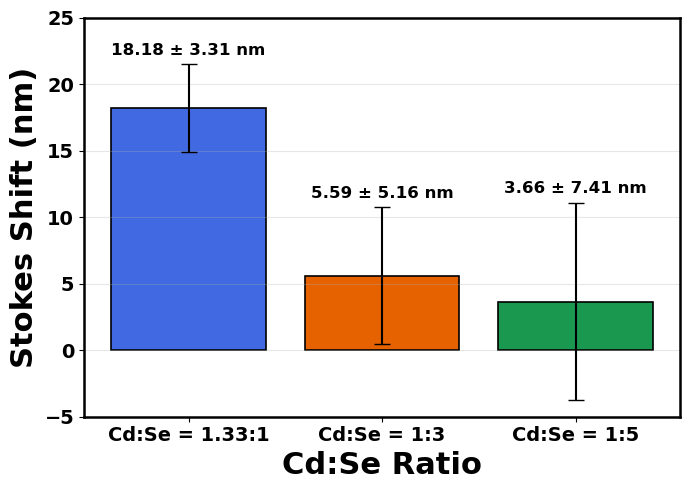

In [65]:
import numpy as np
import matplotlib.pyplot as plt

Stokes_133 = Emi_array_133 - Abs_array_133
Stokes_033 = Emi_array_033 - Abs_array_033
Stokes_020 = Emi_array_020 - Abs_array_020

def stokes_stats(arr):
    arr = np.array(arr)
    arr = arr[np.isfinite(arr) & (arr != 0)]  # clean zeros or NaNs
    return np.mean(arr), np.std(arr)

means = []
errors = []
labels = ["Cd:Se = 1.33:1", "Cd:Se = 1:3", "Cd:Se = 1:5"]

for arr in [Stokes_133, Stokes_033, Stokes_020]:
    m, s = stokes_stats(arr)
    means.append(m)
    errors.append(s)

# ---- Plot mean ± SD ----
x = np.arange(len(labels))

plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
bars = plt.bar(x, means, yerr=errors, capsize=6,
        color=['royalblue','#E66100','#1A9850'],
        edgecolor='k', linewidth=1.2)

plt.xticks(x, labels, fontsize=14, fontweight='bold')
plt.yticks(fontsize = 14, fontweight='bold')
plt.ylabel("Stokes Shift (nm)", fontsize=22, fontweight='bold')
plt.xlabel("Cd:Se Ratio", fontsize=22, fontweight='bold')
#plt.title("Mean Stokes Shift with Standard Deviation", fontsize=14, fontweight='bold')
plt.ylim(-5,25)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

for i, (bar, m, s) in enumerate(zip(bars, means, errors)):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + s + 0.5,
        f"{m:.2f} ± {s:.2f} nm",
        ha='center', va='bottom',
        fontsize=12, fontweight='bold'
    )

plt.savefig('Stokes Shift Mean and SD.png', dpi=1200)
plt.show()

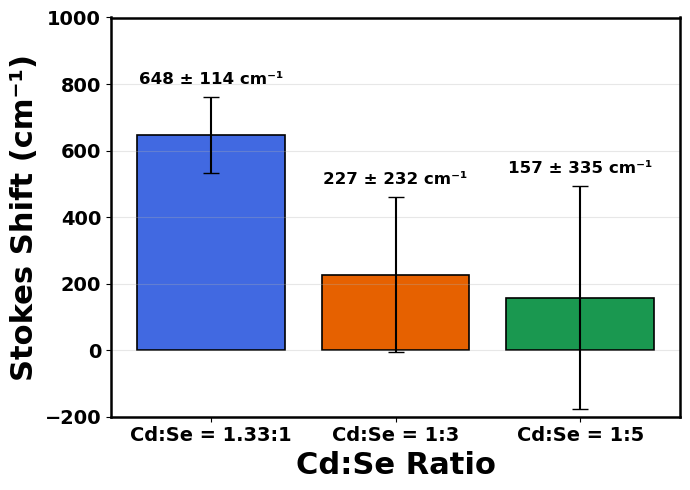

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# ---- Calculate Stokes shift in cm⁻¹ ----
def stokes_shift_cm1(abs_arr, emi_arr):
    abs_arr = np.array(abs_arr)
    emi_arr = np.array(emi_arr)
    m = (np.isfinite(abs_arr) & np.isfinite(emi_arr) &
         (abs_arr != 0) & (emi_arr != 0))
    # convert nm → cm and compute Δν̃
    return 1e7 * (1/abs_arr[m] - 1/emi_arr[m])

Stokes_133 = stokes_shift_cm1(Abs_array_133, Emi_array_133)
Stokes_033 = stokes_shift_cm1(Abs_array_033, Emi_array_033)
Stokes_020 = stokes_shift_cm1(Abs_array_020, Emi_array_020)

# ---- Statistics ----
def stokes_stats(arr):
    arr = np.array(arr)
    arr = arr[np.isfinite(arr) & (arr != 0)]
    return np.mean(arr), np.std(arr)

means = []
errors = []
labels = ["Cd:Se = 1.33:1", "Cd:Se = 1:3", "Cd:Se = 1:5"]

for arr in [Stokes_133, Stokes_033, Stokes_020]:
    m, s = stokes_stats(arr)
    means.append(m)
    errors.append(s)

# ---- Plot mean ± SD ----
x = np.arange(len(labels))
plt.figure(figsize=(7,5))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

bars = plt.bar(x, means, yerr=errors, capsize=6,
        color=['royalblue','#E66100','#1A9850'],
        edgecolor='k', linewidth=1.2)

plt.xticks(x, labels, fontsize=14, fontweight='bold')
plt.yticks(fontsize = 14, fontweight='bold')
plt.ylabel("Stokes Shift (cm⁻¹)", fontsize=22, fontweight='bold')
plt.xlabel("Cd:Se Ratio", fontsize=22, fontweight='bold')
plt.ylim(-200, 1000)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

for i, (bar, m, s) in enumerate(zip(bars, means, errors)):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + s + 30,
        f"{m:.0f} ± {s:.0f} cm⁻¹",
        ha='center', va='bottom',
        fontsize=12, fontweight='bold'
    )

plt.savefig('Stokes Shift Mean and SD_cm-1.png', dpi=1200)
plt.show()

## 11. Brus Equation & QD Size

In [57]:
import numpy as np
import pandas as pd
from math import pi
# Try SciPy's brentq; if unavailable, use a simple bisection fallback
try:
    from scipy.optimize import brentq
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

# ---------- Constants ----------
h  = 6.62607015e-34
e  = 1.602176634e-19
m0 = 9.10938356e-31
eps0 = 8.8541878128e-12

# ---------- CdSe parameters (tune if needed) ----------
Eg_bulk_eV = 1.74
me_eff = 0.13 * m0
mh_eff = 0.45 * m0
eps_r  = 9.5
inv_meh = (1/me_eff + 1/mh_eff)

# ---------- Brus equation ----------
def brus_Eg_eV(a_nm, Eg_bulk_eV=Eg_bulk_eV, eps_r=eps_r):
    a_m = a_nm * 1e-9
    E_conf_J = h**2 * inv_meh / (8 * a_m**2)
    E_coul_J = 1.8 * e**2 / (4 * pi * eps0 * eps_r * a_m)
    return (Eg_bulk_eV*e + E_conf_J - E_coul_J) / e  # eV

def _bisection(f, lo, hi, maxiter=200, tol=1e-9):
    flo, fhi = f(lo), f(hi)
    if np.sign(flo) == np.sign(fhi):
        return np.nan
    for _ in range(maxiter):
        mid = 0.5*(lo+hi)
        fm  = f(mid)
        if abs(fm) < tol or abs(hi-lo) < tol:
            return mid
        if np.sign(fm) == np.sign(flo):
            lo, flo = mid, fm
        else:
            hi, fhi = mid, fm
    return mid

def radius_from_Eg(Eg_eV, a_lo_nm=0.3, a_hi_nm=20.0):
    """Solve Brus for radius given Eg' (eV). Returns np.nan if no solution."""
    if not np.isfinite(Eg_eV) or Eg_eV <= Eg_bulk_eV:
        return np.nan
    def f(a): return brus_Eg_eV(a) - Eg_eV
    lo, hi = float(a_lo_nm), float(a_hi_nm)
    flo, fhi = f(lo), f(hi)

    # expand hi until sign change or cap
    tries = 0
    while np.sign(flo) == np.sign(fhi) and hi < 200.0 and tries < 12:
        hi *= 1.5
        fhi = f(hi)
        tries += 1

    if np.sign(flo) == np.sign(fhi):
        # try shrinking lo as a last resort
        lo2 = max(0.1, lo/2)
        flo2 = f(lo2)
        if np.sign(flo2) != np.sign(fhi):
            lo, flo = lo2, flo2
        else:
            return np.nan

    if HAVE_SCIPY:
        try:
            return float(brentq(f, lo, hi, maxiter=200, xtol=1e-12, rtol=1e-10))
        except Exception:
            pass
    # fallback
    return float(_bisection(f, lo, hi))

# ---------- INSERT YOUR RUN ARRAYS ----------
Emi_run2 = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
Emi_run3 = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
Emi_run4 = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])
Emi_run5 = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])
Emi_run6 = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
Emi_run7 = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])
Emi_run8 = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])
Emi_run9 = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

runs = {
    "Run 2": Emi_run2,
    "Run 3": Emi_run3,
    "Run 4": Emi_run4,
    "Run 5": Emi_run5,
    "Run 6": Emi_run6,
    "Run 7": Emi_run7,
    "Run 8": Emi_run8,
    "Run 9": Emi_run9
}

# ---------- Process all runs safely ----------
rows = []
for run_name, emi_list in runs.items():
    emi_nm = np.array(emi_list, dtype=float)

    # Clean: finite, >0, plausible UV-Vis range (nm)
    mask = np.isfinite(emi_nm) & (emi_nm > 0) & (emi_nm >= 350) & (emi_nm <= 800)
    emi_nm = emi_nm[mask]

    if emi_nm.size == 0:
        print(f"[WARN] {run_name}: no valid emission peaks after cleaning.")
        continue

    Eg_eV = 1240.0 / emi_nm

    radii_nm = np.array([radius_from_Eg(Eg) for Eg in Eg_eV], float)
    valid = np.isfinite(radii_nm)
    radii_nm = radii_nm[valid]
    emi_used  = emi_nm[valid]
    Eg_used   = Eg_eV[valid]

    if radii_nm.size == 0:
        print(f"[WARN] {run_name}: solver returned no valid radii (check inputs/constants).")
        continue

    r_mean, r_std = float(np.mean(radii_nm)), float(np.std(radii_nm))
    d_mean, d_std = 2*r_mean, 2*r_std

    print(f"\n=== {run_name} ===")
    print(f"Radii (nm): {np.round(radii_nm, 4).tolist()})")
    print(f"Solved {radii_nm.size} points (of {emi_nm.size} cleaned).")
    print(f"Mean radius:   {r_mean:.3f} ± {r_std:.3f} nm")

    for a, Egp, r in zip(emi_used, Eg_used, radii_nm):
        rows.append((run_name, a, Egp, r))

# ---------- Save tidy CSV ----------
if rows:
    df = pd.DataFrame(rows, columns=["Run", "Emi_peak_nm", "Eg_prime_eV", "Radius_nm"])
    df.to_csv("CdSe_QD_Radii_AllRuns_Emi.csv", index=False)
    print("\nAll results saved to 'CdSe_QD_Radii_AllRuns_Emi.csv'")
else:
    print("\nNo results to save. Please check that your Abs_array_runX lists contain valid (>0) nm values.")


=== Run 2 ===
Radii (nm): [2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Solved 18 points (of 18 cleaned).
Mean radius:   2.361 ± 0.087 nm

=== Run 3 ===
Radii (nm): [2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Solved 18 points (of 18 cleaned).
Mean radius:   2.361 ± 0.087 nm

=== Run 4 ===
Radii (nm): [1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Solved 18 points (of 18 cleaned).
Mean radius:   2.084 ± 0.041 nm

=== Run 5 ===
Radii (nm): [1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Solved 18 points (of 18 cleaned).
Mean radius:   2.190 ± 0.102 nm

=== Run 6 ===
Radii (nm): [2.1022, 2.199, 2.2454

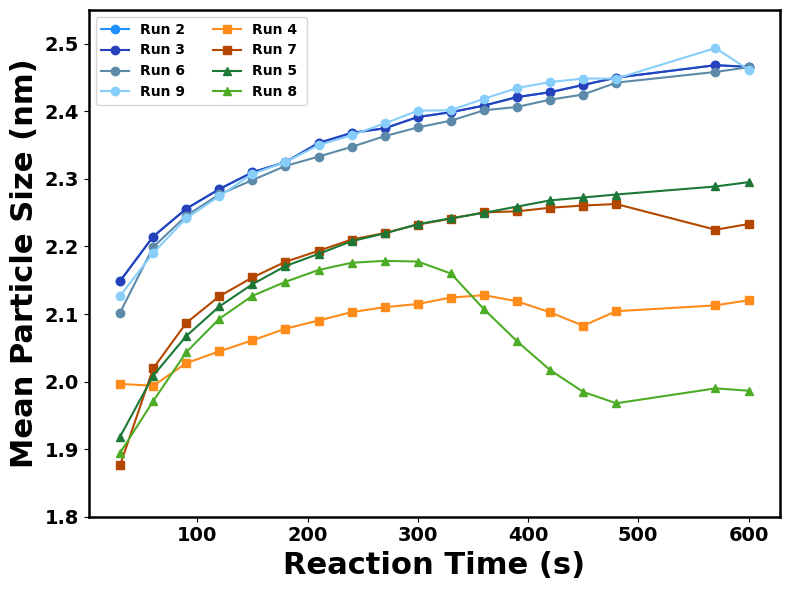

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time_run2 = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 570, 600])
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(reaction_time, Radii_run2, 'o-', label = 'Run 2', color = '#1E90FF')
plt.plot(reaction_time, Radii_run3, 'o-', label = 'Run 3', color = '#2740BB')
plt.plot(reaction_time, Radii_run6, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, Radii_run9, 'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, Radii_run4, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, Radii_run7, 's-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, Radii_run5, '^-', label = 'Run 5 ', color = '#1B7837')
plt.plot(reaction_time, Radii_run8, '^-', label = 'Run 8 ', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Mean Particle Size (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(1.8, 2.55)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Quantum Dot Size vs Reaction Time Run 1 Excluded_Emi.png", dpi = 1200)
plt.show()

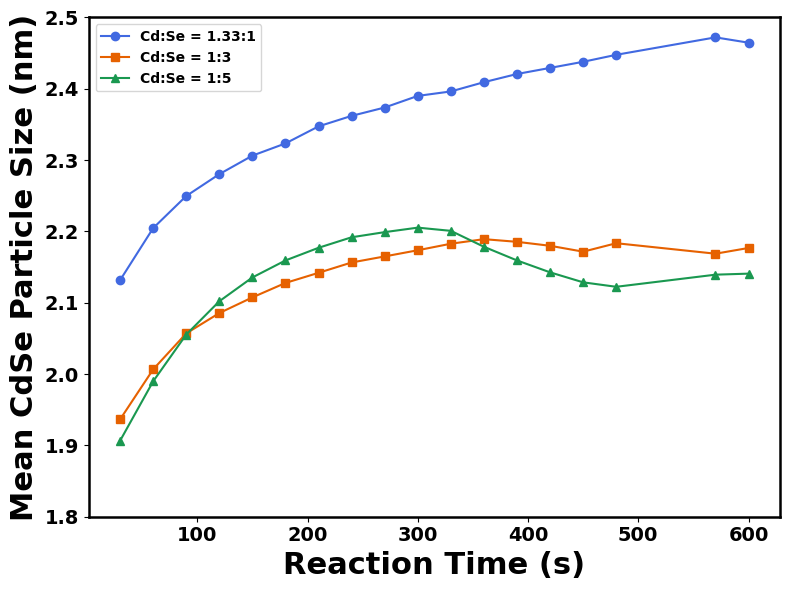

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

Radii_array_133 = (Radii_run2+Radii_run3+Radii_run6+Radii_run9)/4
Radii_array_033 = (Radii_run4+Radii_run7)/2
Radii_array_020 = (Radii_run5+Radii_run8)/2

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, Radii_array_133, 'o-', color = 'royalblue',  label = 'Cd:Se = 1.33:1')
plt.plot(reaction_time, Radii_array_033, 's-', color = '#E66100',  label = 'Cd:Se = 1:3')
plt.plot(reaction_time, Radii_array_020, '^-', color = '#1A9850',  label = 'Cd:Se = 1:5')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Mean CdSe Particle Size (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(1.8, 2.5)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Mean Particle Size vs Reaction Time Correlation_Concentration Varying_Emi.png", dpi = 1200)
plt.show()

/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/610129353.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


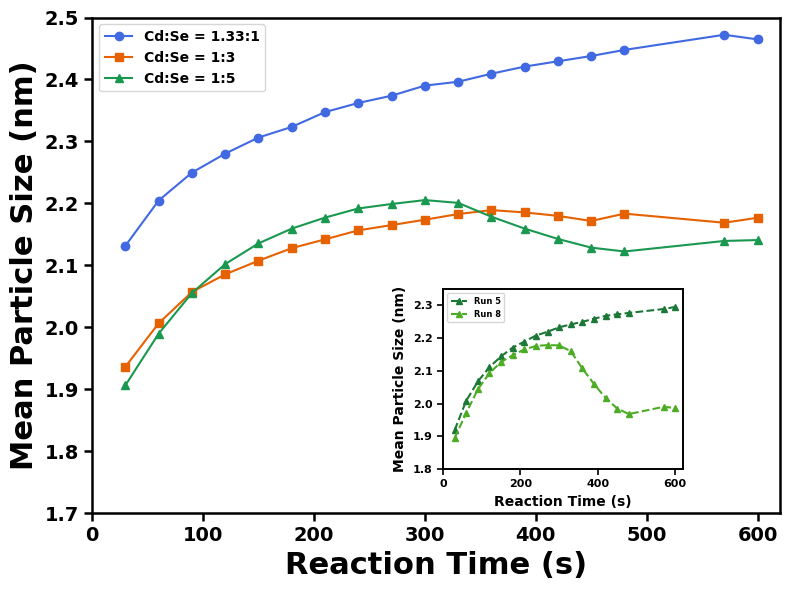

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ---------- DATA ----------
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

# ---------- Averages ----------
Radii_array_133 = (Radii_run2 + Radii_run3 + Radii_run6 + Radii_run9) / 4
Radii_array_033 = (Radii_run4 + Radii_run7) / 2
Radii_array_020 = (Radii_run5 + Radii_run8) / 2

# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Radii_array_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Radii_array_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Radii_array_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Mean Particle Size (nm)", fontsize=22, fontweight="bold")
ax.set_xlim(0, 620)
ax.set_ylim(1.7, 2.5)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time, Radii_run5, '^--', ms=4, color='#1B7837', label='Run 5')
inset_ax.plot(reaction_time, Radii_run8, '^--', ms=4, color='#4DAC26', label='Run 8')

#inset_ax.set_title("Run 5 vs Run 8 (Raw Data)", fontsize=11, fontweight="bold", pad=6)
inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Mean Particle Size (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_xlim(0, 620)
inset_ax.set_ylim(1.8, 2.35)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("Mean Particle Size vs Reaction Time Correlation_Concentration Varying_1:5 Subplot Included_Emi.png", dpi=1200)
plt.show()

/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/2790957872.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


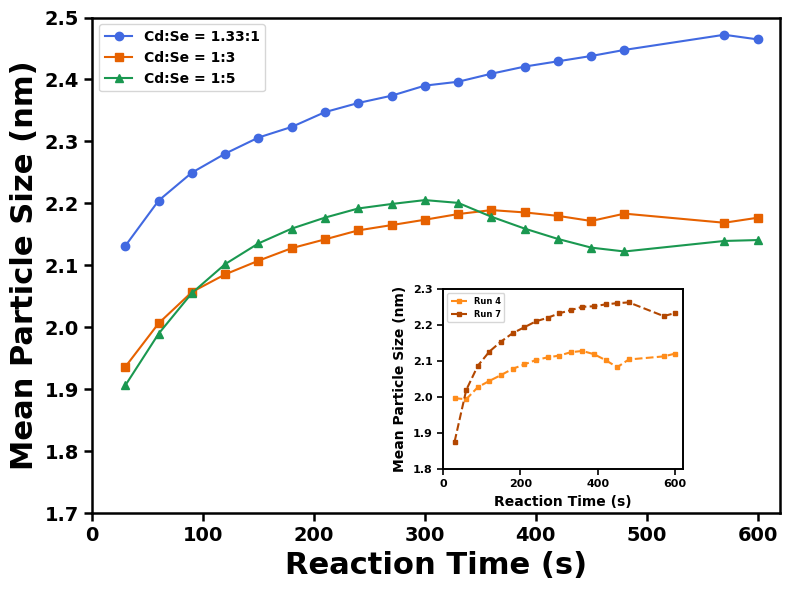

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ---------- DATA ----------
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

# ---------- Averages ----------
Radii_array_133 = (Radii_run2 + Radii_run3 + Radii_run6 + Radii_run9) / 4
Radii_array_033 = (Radii_run4 + Radii_run7) / 2
Radii_array_020 = (Radii_run5 + Radii_run8) / 2

# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Radii_array_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Radii_array_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Radii_array_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Mean Particle Size (nm)", fontsize=22, fontweight="bold")
ax.set_xlim(0, 620)
ax.set_ylim(1.7, 2.5)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time, Radii_run4, 's--', ms=3.5, color='#FF8C1A', label='Run 4')
inset_ax.plot(reaction_time, Radii_run7, 's--', ms=3.5, color='#B34700', label='Run 7')

#inset_ax.set_title("Run 4 vs Run 7 (Raw Data)", fontsize=11, fontweight="bold", pad=6)
inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Mean Particle Size (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_xlim(0, 620)
inset_ax.set_ylim(1.8, 2.3)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("Mean Particle Size vs Reaction Time Correlation_Concentration Varying_1:3 Subplot Included_Emi.png", dpi=1200)
plt.show()

/var/folders/n1/bmzcbfxs2fgc29_x3l4x_s_m0000gn/T/ipykernel_6894/3162020929.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


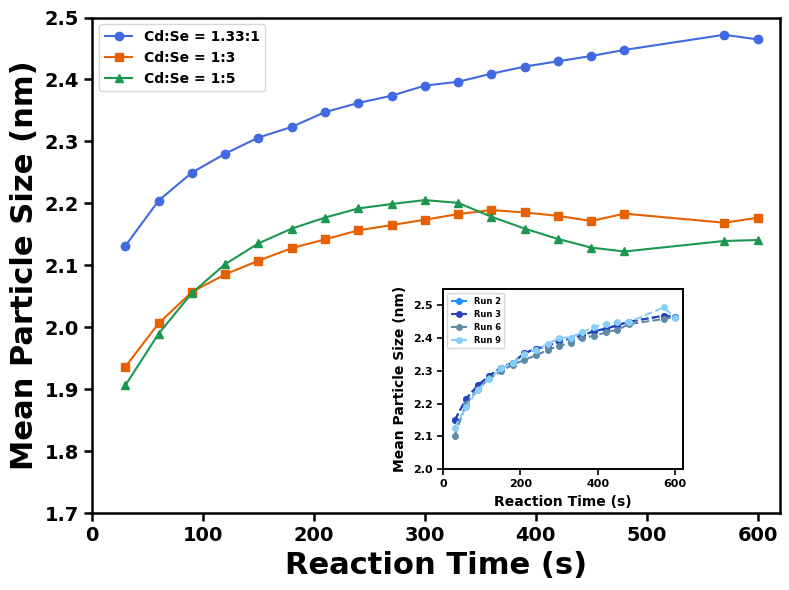

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ---------- DATA ----------
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

# ---------- Averages ----------
Radii_array_133 = (Radii_run2 + Radii_run3 + Radii_run6 + Radii_run9) / 4
Radii_array_033 = (Radii_run4 + Radii_run7) / 2
Radii_array_020 = (Radii_run5 + Radii_run8) / 2

# ---------- Main figure ----------
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(reaction_time, Radii_array_133, 'o-', color='royalblue',  label='Cd:Se = 1.33:1')
ax.plot(reaction_time, Radii_array_033, 's-', color='#E66100',   label='Cd:Se = 1:3')
ax.plot(reaction_time, Radii_array_020, '^-', color='#1A9850',   label='Cd:Se = 1:5')

# ---------- Main figure formatting (bold everywhere) ----------
ax.set_xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
ax.set_ylabel("Mean Particle Size (nm)", fontsize=22, fontweight="bold")
ax.set_xlim(0, 620)
ax.set_ylim(1.7, 2.5)

# Make tick labels bold
for tick in ax.get_xticklabels() + ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(14)

# Bold tick lines
ax.tick_params(axis='both', width=1.8, length=6)

# Bold spine borders
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

ax.legend(prop={'size': 10, 'weight': 'bold'}, loc='upper left')

# ---------- Subplot (Run 5 & Run 8) ----------
inset_ax = fig.add_axes([0.56, 0.21, 0.30, 0.30])  # [left, bottom, width, height]

inset_ax.plot(reaction_time, Radii_run2, 'o--', ms=4, color='#1E90FF', label='Run 2')
inset_ax.plot(reaction_time, Radii_run3, 'o--', ms=4, color='#2740BB', label='Run 3')
inset_ax.plot(reaction_time, Radii_run6, 'o--', ms=4, color='#5D8AA8', label='Run 6')
inset_ax.plot(reaction_time, Radii_run9, 'o--', ms=4, color='#87CEFA', label='Run 9')

inset_ax.set_xlabel("Reaction Time (s)", fontsize=10, fontweight="bold")
inset_ax.set_ylabel("Mean Particle Size (nm)", fontsize=10, fontweight="bold")
inset_ax.tick_params(axis='both', width=1.2, length=4)
inset_ax.set_xlim(0, 620)
inset_ax.set_ylim(2, 2.55)

# Bold ticks and labels in subplot too
for tick in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    tick.set_fontweight("bold")
    tick.set_fontsize(8)

# Thicker frame on inset too
for spine in inset_ax.spines.values():
    spine.set_linewidth(1.4)

inset_ax.legend(loc='upper left', prop = {'size': 6, 'weight': 'bold'})

plt.tight_layout()
plt.savefig("Mean Particle Size vs Reaction Time Correlation_Concentration Varying_1.33:1 Subplot Included_Emi.png", dpi=1200)
plt.show()

## 12. Emission Comparison

### 12.1 Whole Picture

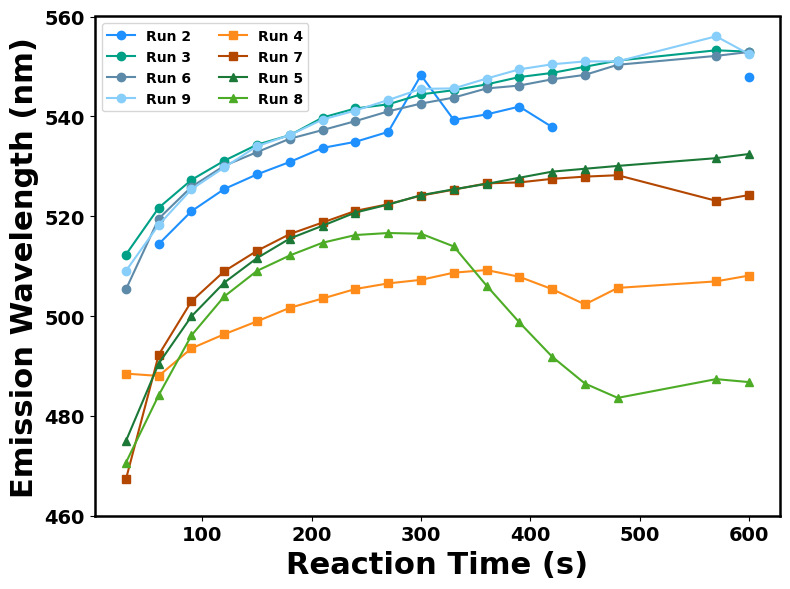

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission = np.array( [np.nan, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, np.nan, np.nan, np.nan, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, run2_emission, 'o-', label = 'Run 2', color = '#1E90FF')
plt.plot(reaction_time, run3_emission, 'o-', label = 'Run 3', color = '#00A087')
plt.plot(reaction_time, run6_emission, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9_emission, 'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, run4_emission, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, run7_emission, 's-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, run5_emission, '^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8_emission, '^-', label = 'Run 8', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
ax.yaxis.set_major_locator(MultipleLocator(20))
plt.ylim(460, 560)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Whole Picture Run 1 Excluded.png", dpi = 1200)
plt.show()

In [34]:
print((run3_emission+run6_emission+run9_emission)/3)

[508.89716195 519.81608591 526.18543903 530.32312593 533.73203744
 536.00044056 538.7942661  540.59709244 542.22490494 544.153487
 544.86857576 546.5190847  547.81707588 548.84854102 549.74975218
 550.83363328 553.78938202 552.7774625 ]


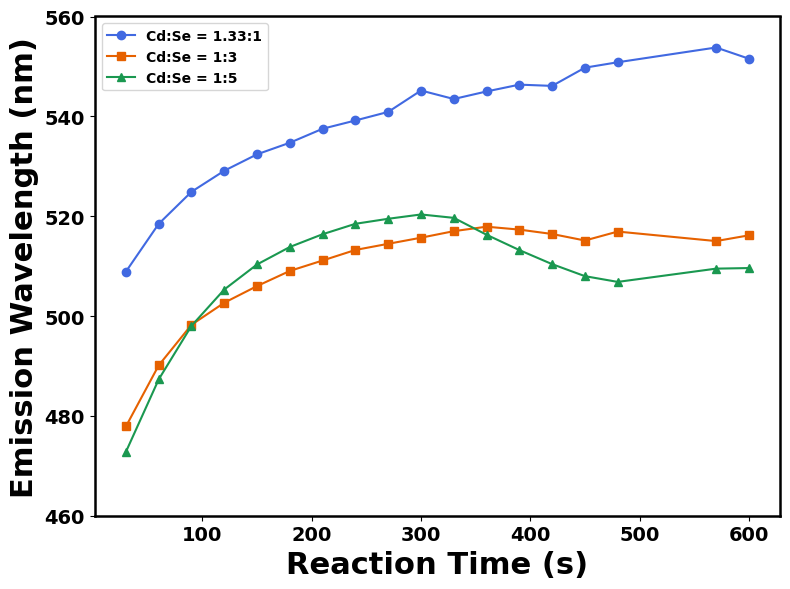

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission_adapted = np.array( [508.89716195, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, 549.74975218, 550.83363328, 553.78938202, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])

Emi_133 = (run2_emission_adapted+run3_emission+run6_emission+run9_emission)/4
Emi_033 = (run4_emission+run7_emission)/2
Emi_020 = (run5_emission+run8_emission)/2

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, Emi_133, 'o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.plot(reaction_time, Emi_033, 's-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.plot(reaction_time, Emi_020, '^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(460, 560)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Concentration Comparison_Average.png", dpi = 1200)
plt.show()

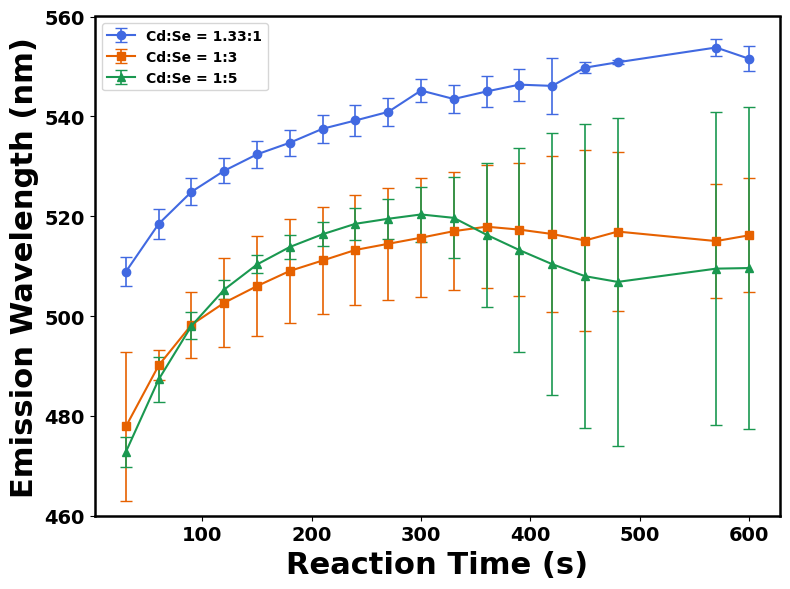

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission_adapted = np.array( [508.89716195, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, 549.74975218, 550.83363328, 553.78938202, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])

Emi_133 = (run2_emission_adapted+run3_emission+run6_emission+run9_emission)/4
Emi_033 = (run4_emission+run7_emission)/2
Emi_020 = (run5_emission+run8_emission)/2

Err_133 = np.std(
    np.stack([run2_emission_adapted,run3_emission,run6_emission,run9_emission], axis=0), axis=0, ddof=1)
Err_033 = np.std(
    np.stack([run4_emission,run7_emission], axis=0), axis=0, ddof=1)
Err_020 = np.std(
    np.stack([run5_emission,run8_emission], axis=0), axis=0, ddof=1)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.errorbar(reaction_time, Emi_133, yerr=Err_133, elinewidth=1.2, capsize=4, fmt='o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.errorbar(reaction_time, Emi_033, yerr=Err_033, elinewidth=1.2, capsize=4, fmt='s-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.errorbar(reaction_time, Emi_020, yerr=Err_020, elinewidth=1.2, capsize=4, fmt='^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(460, 560)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Concentration Comparison_Average_Error bars.png", dpi = 1200)
plt.show()

### 12.2 1.33:1

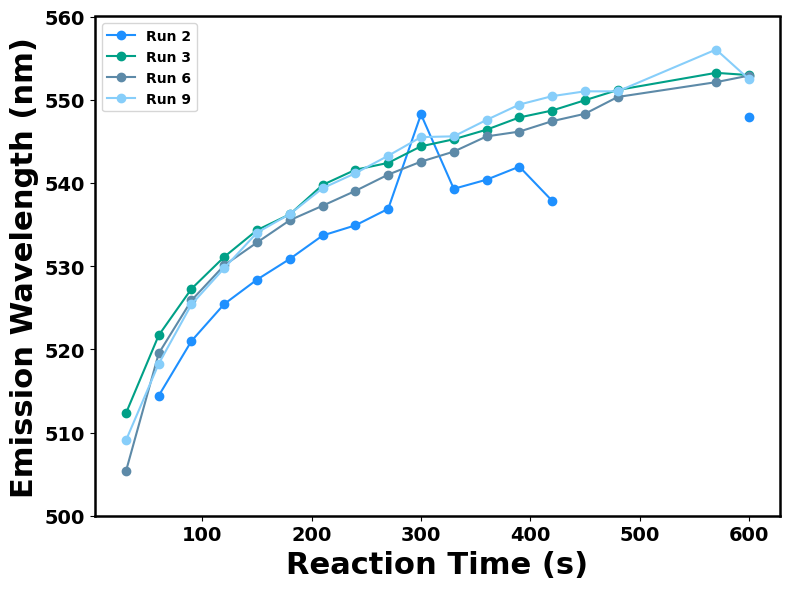

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator

reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission = np.array( [np.nan, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, np.nan, np.nan, np.nan, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, run2_emission, 'o-', label = 'Run 2', color = '#1E90FF')
plt.plot(reaction_time, run3_emission, 'o-', label = 'Run 3', color = '#00A087')
plt.plot(reaction_time, run6_emission, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9_emission, 'o-', label = 'Run 9', color = '#87CEFA')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.ylim(500, 560)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 1.33.png", dpi = 1200)
plt.show()

### 12.3 1:3

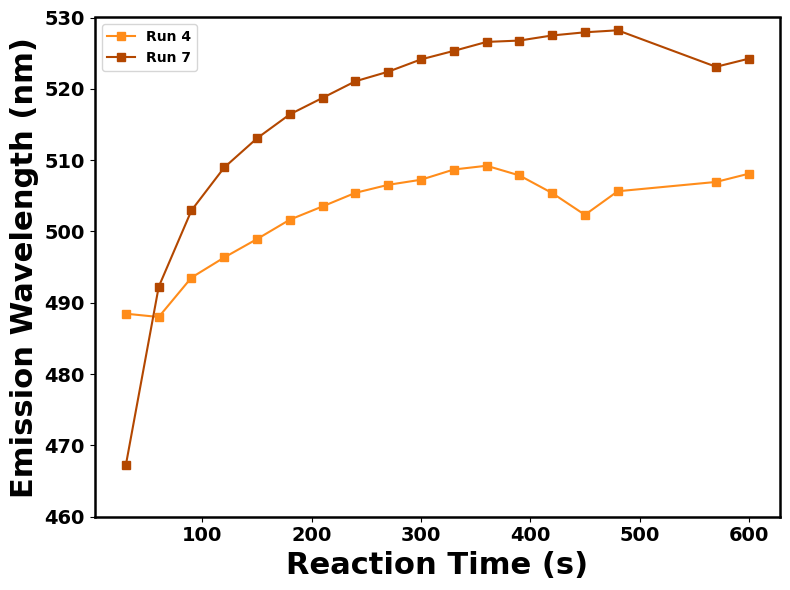

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission = np.array( [np.nan, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, np.nan, np.nan, np.nan, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, run4_emission, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, run7_emission, 's-', label = 'Run 7', color = '#B34700')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(460, 530)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 0.33.png", dpi = 1200)
plt.show()

### 12.4 1:5

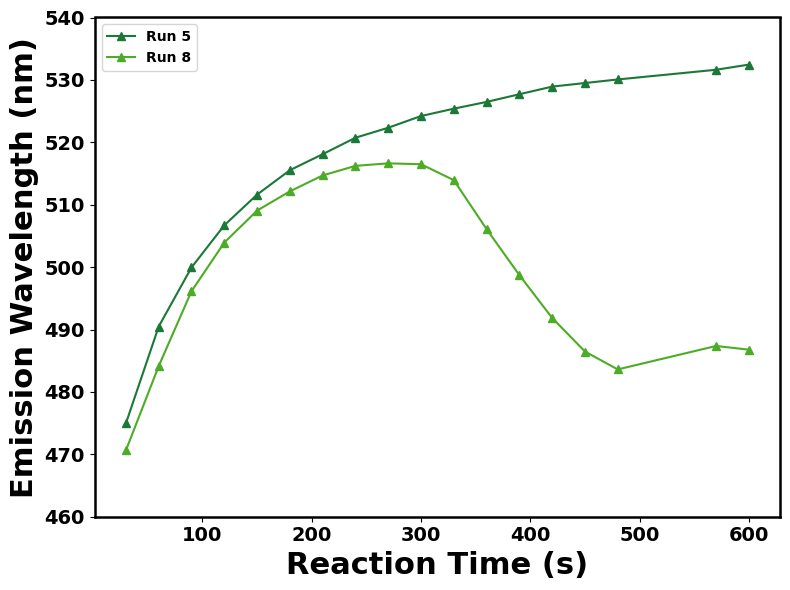

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run2_emission = np.array( [np.nan, 514.4206563437748, 521.0042088795248, 525.4458259531337, 528.380734879287, 530.8663584452188, 533.6798083428873, 534.9011216754151, 536.886850248623, 548.2372751609345, 539.2898312370974, 540.3875508366853, 541.9549020192717, 537.8512515597004, np.nan, np.nan, np.nan, 547.8703954178537]) 
run3_emission = np.array( [512.3070029594222, 521.6846480599407, 527.2736282150706, 531.1127920109002, 534.3277831123041, 536.2271529121384, 539.7618011703164, 541.5804283986132, 542.4091189455767, 544.4000997099008, 545.2446549908778, 546.397254994729, 547.8682431700723, 548.6983909226931, 549.9359221178156, 551.1670135934531, 553.2294869997208, 552.9586670594164])
run6_emission = np.array( [505.33592190822736, 519.5025216114215, 525.8849321392368, 530.0939270676532, 532.8410736242301, 535.5186197367233, 537.2569170712427, 539.0435546391705, 540.9996281768332, 542.5550289025947, 543.7625429007994, 545.5893236340374, 546.167090853131, 547.420223126444, 548.3062209256516, 550.3289764813013, 552.1096565046201, 552.8950277213843])
run9_emission = np.array([509.0485609821685, 518.2610880625158, 525.3977567435858, 529.7626587259898, 534.0272555925457, 536.2555490359766, 539.3640800700023, 541.1672942710078, 543.2659677116665, 545.5053323991201, 545.5985293841948, 547.5706754825353, 549.4158936024178, 550.4270090061644, 551.0071134907737, 551.0049097571354, 556.0290025497369, 552.4786927109501])

run4_emission = np.array([488.4664862003888, 488.00398185872007, 493.5340407697392, 496.3571342906631, 498.93752549001766, 501.65346291884975, 503.5148317651257, 505.41688818159037, 506.5378614109998, 507.25208945158624, 508.68536640634414, 509.21329455654234, 507.86055867149764, 505.38449764366965, 502.32866038140764, 505.63542809467356, 506.94280202669444, 508.09903870385784])

run7_emission = np.array([467.2951518820494, 492.23690872588645, 502.9597277784448, 508.9766205621469, 513.0707344000216, 516.4219814904233, 518.7361865282091, 521.0601381892523, 522.4000479922711, 524.1264921110791, 525.3168282642783, 526.574355650129, 526.765864804057, 527.4817886108318, 527.9254437790734, 528.2055670879115, 523.0859927429811, 524.2284648603371])

run5_emission = np.array([474.9601217636249, 490.4788682674479, 499.9446422880549, 506.6986452493561, 511.61545994947613, 515.5278628816113, 518.0919022787969, 520.7313099399859, 522.3320503183312, 524.2066016534765, 525.3889887767823, 526.4705757942542, 527.701276553421, 528.924012940282, 529.498694138753, 530.0700012233991, 531.6249238825708, 532.4511592900468])

run8_emission = np.array([470.6325970541513, 484.1424232340987, 496.13243205682744, 503.92672068164995, 509.05300100368646, 512.1387606752289, 514.6886373497314, 516.2244235152269, 516.6303792377037, 516.4864130474153, 513.939910664872, 506.0912767974683, 498.7210567072796, 491.8594725195372, 486.4764812489439, 483.6058526334916, 487.3611622541664, 486.7703619742948])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.plot(reaction_time, run5_emission, '^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8_emission, '^-', label = 'Run 8', color = '#4DAC26')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(460, 540)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Emission Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 0.2.png", dpi = 1200)
plt.show()

## 13. Excitation Comparison

### 13.1 Whole Picture

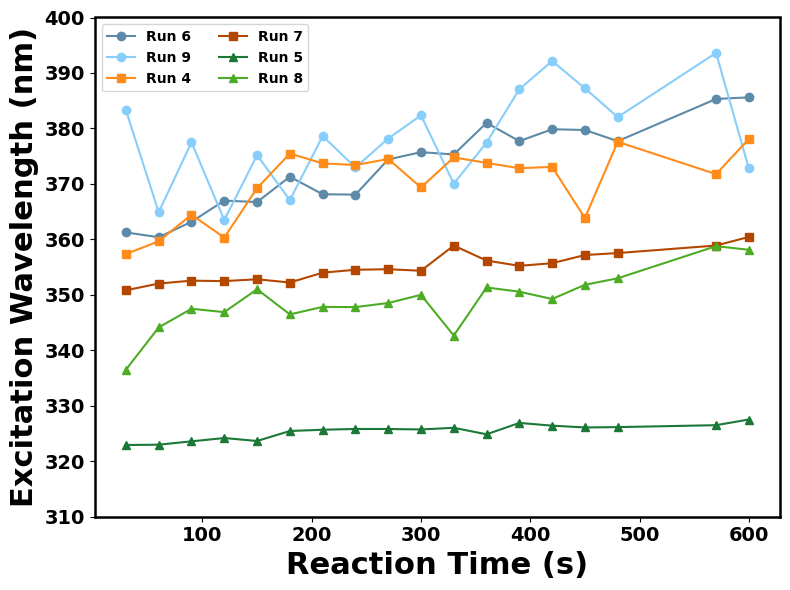

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, run6_excitation, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9_excitation, 'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, run4_excitation, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, run7_excitation, 's-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, run5_excitation, '^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8_excitation, '^-', label = 'Run 8', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(310, 400)
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Whole Picture Run 1 Excluded.png", dpi = 1200)
plt.show()

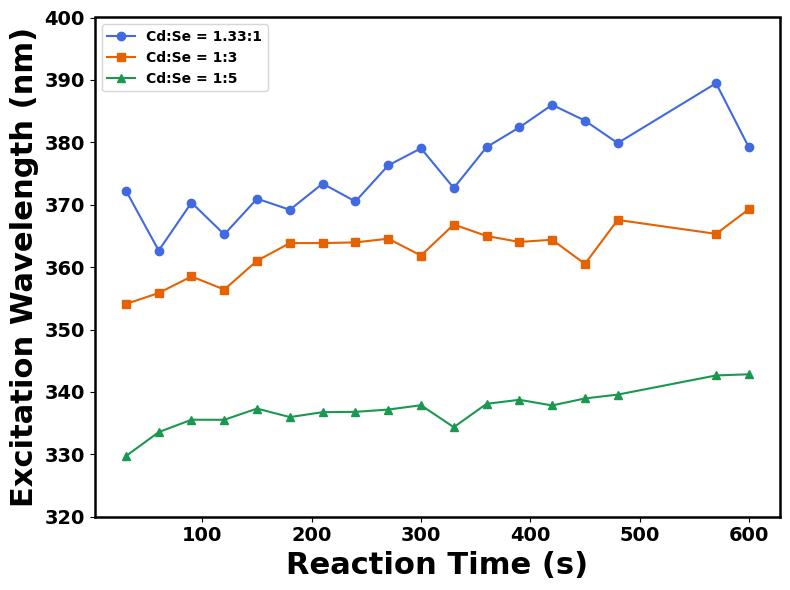

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])

Exi_133 = (run6_excitation+run9_excitation)/2
Exi_033 = (run4_excitation+run7_excitation)/2
Exi_020 = (run5_excitation+run8_excitation)/2

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, Exi_133, 'o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.plot(reaction_time, Exi_033, 's-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.plot(reaction_time, Exi_020, '^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(320, 400)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Concentration Comparison_Average.png", dpi = 1200)
plt.show()

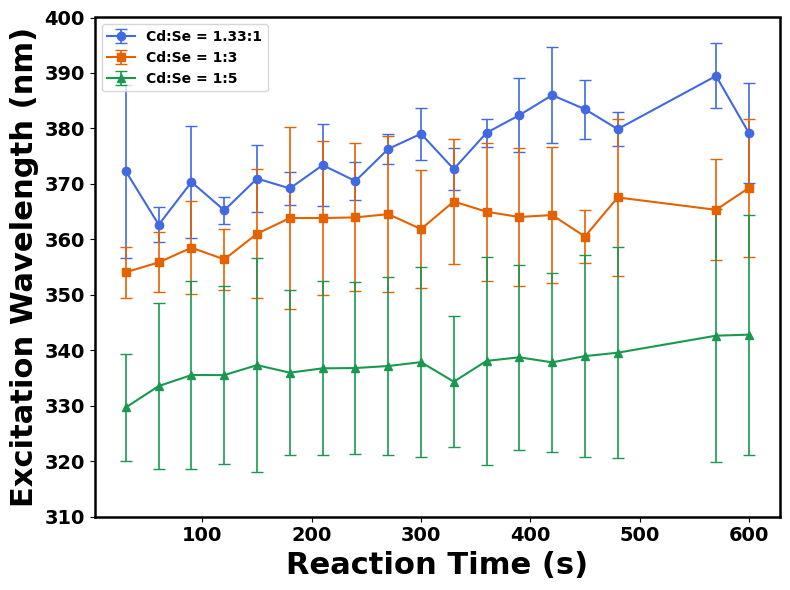

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])

Exi_133 = (run6_excitation+run9_excitation)/2
Exi_033 = (run4_excitation+run7_excitation)/2
Exi_020 = (run5_excitation+run8_excitation)/2

Err_133 = np.std(
    np.stack([run6_excitation,run9_excitation], axis=0), axis=0, ddof=1)
Err_033 = np.std(
    np.stack([run4_excitation,run7_excitation], axis=0), axis=0, ddof=1)
Err_020 = np.std(
    np.stack([run5_excitation,run8_excitation], axis=0), axis=0, ddof=1)

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.errorbar(reaction_time, Emi_133, yerr=Err_133, elinewidth=1.2, capsize=4, fmt='o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.errorbar(reaction_time, Emi_033, yerr=Err_033, elinewidth=1.2, capsize=4, fmt='s-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.errorbar(reaction_time, Emi_020, yerr=Err_020, elinewidth=1.2, capsize=4, fmt='^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(310, 400)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Concentration Comparison_Average_Errorbars.png", dpi = 1200)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])

Exi_133 = (run6_excitation+run9_excitation)/2
Exi_033 = (run4_excitation+run7_excitation)/2
Exi_020 = (run5_excitation+run8_excitation)/2

plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, Exi_133, 'o-', label = 'Cd:Se = 1.33:1', color = 'royalblue')
plt.plot(reaction_time, Exi_033, 's-', label = 'Cd:Se = 1:3', color = '#E66100')
plt.plot(reaction_time, Exi_020, '^-', label = 'Cd:Se = 1:5', color = '#1A9850')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(320, 400)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Concentration Comparison_Average.png", dpi = 1200)
plt.show()

### 13.2 1.33:1

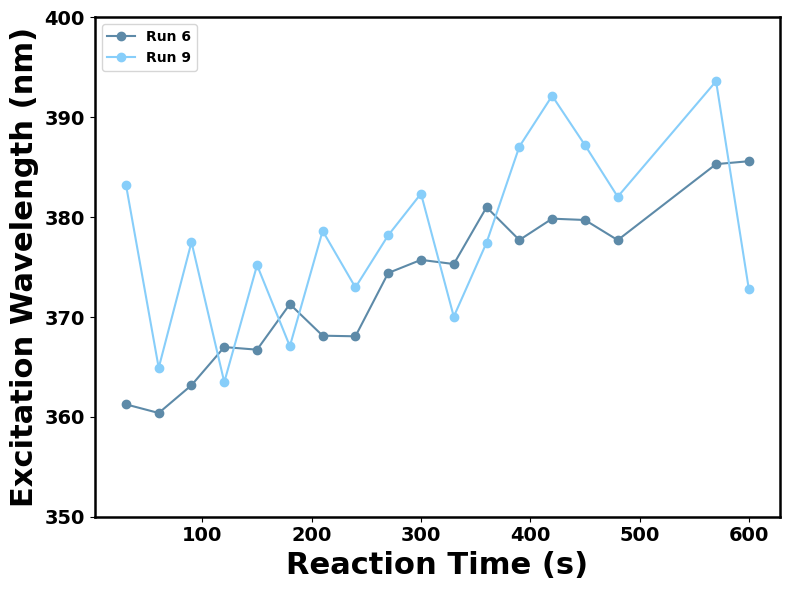

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, run6_excitation, 'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, run9_excitation, 'o-', label = 'Run 9', color = '#87CEFA')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(350, 400)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 1.33.png", dpi = 1200)
plt.show()

### 13.3 1:3

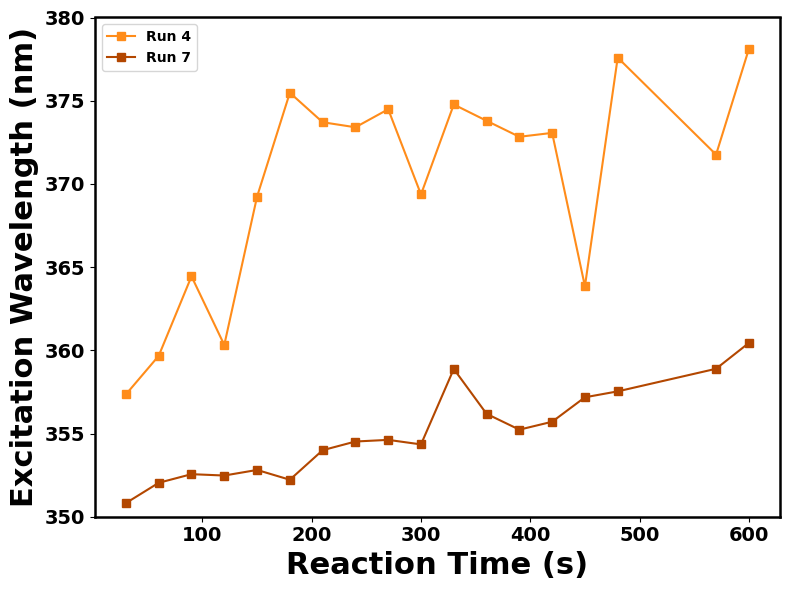

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, run4_excitation, 's-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, run7_excitation, 's-', label = 'Run 7', color = '#B34700')


plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.ylim(350, 380)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 0.33.png", dpi = 1200)
plt.show()

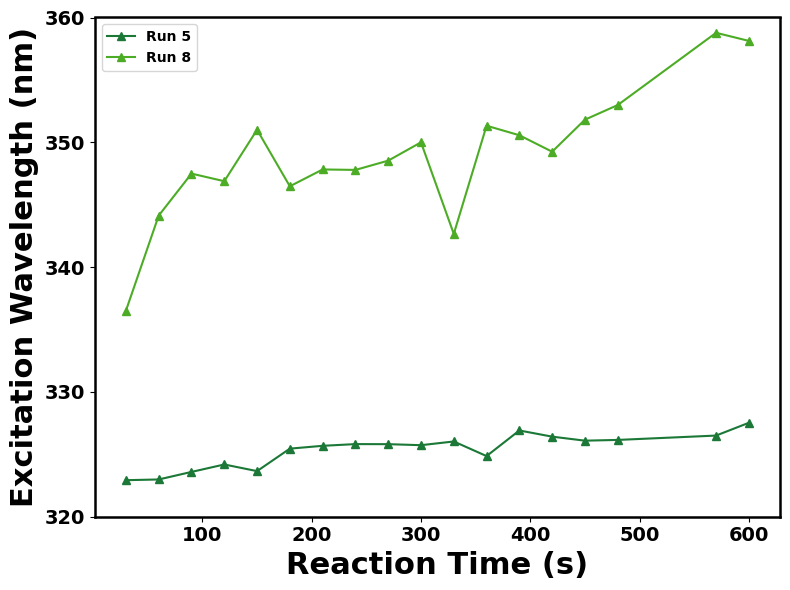

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

run6_excitation = np.array([361.25467745565345, 360.387674881225, 363.1719362813779, 366.9924493844638, 366.73035672616777, 371.2955260966966, 368.13224283916446, 368.06953605608743, 374.41124319378565, 375.72533373045974, 375.30735660896295, 380.99920739101293, 377.7124942719121, 379.85205551451094, 379.7195051964273, 377.7042840052977, 385.3154458531392, 385.6052765070232])

run9_excitation = np.array([383.26968231665296, 364.9111151448076, 377.50054787834165, 363.479262491422, 375.1985648228021, 367.0751029560745, 378.6298345167409, 372.9644034716062, 378.18502554073626, 382.35681649089145, 370.0386821550944, 377.4497072623675, 387.06892578838324, 392.1561366866007, 387.2244829216159, 382.04736135795895, 393.6165995112899, 372.77779768474863])

run4_excitation = np.array([357.3526983521626, 359.6683002770883, 364.4451785018473, 360.321359835556, 369.2341644144066, 375.478086061728, 373.7061939082331, 373.4032073798526, 374.4860198561577, 369.3661931322817, 374.77191064105267, 373.7940549247326, 372.8316071115657, 373.06556649686826, 363.8473293110553, 377.5884478984787, 371.76002054248767, 378.104045972207])


run7_excitation = np.array([350.8199617609978, 352.0383361495908, 352.55713896697193, 352.4752534235721, 352.81065744004565, 352.2215676475439, 353.9968760090482, 354.51960955023173, 354.6181789060193, 354.3457937593946, 358.879412655561, 356.18308108683755, 355.23142090298614, 355.70691884419705, 357.1770703007378, 357.5330861501045, 358.89064710214234, 360.44156437430405])

run5_excitation = np.array([322.92650021273, 322.98569205314107, 323.59022545477336, 324.18583930683974, 323.65398231715324, 325.45548181704334, 325.6813991525453, 325.81878798629486, 325.8131792679594, 325.73147432424827, 326.02927540784776, 324.8593577194788, 326.9104355602738, 326.4158748145143, 326.093537351812, 326.1533474761751, 326.5024987007395, 327.5266362950549])

run8_excitation = np.array([336.5074513137288, 344.12860272459136, 347.49178816004036, 346.88196551819425, 351.00462311288777, 346.47618990398644, 347.8240143874099, 347.7877711179805, 348.5302236837857, 349.9999380118105, 342.6602362282536, 351.3288835345185, 350.5659308411804, 349.24709429901884, 351.8130927450389, 352.9846821345445, 358.77399258388596, 358.125437777175])


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, run5_excitation, '^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, run8_excitation, '^-', label = 'Run 8', color = '#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Excitation Wavelength (nm)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.ylim(320, 360)
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.tight_layout()
plt.savefig("Excitation Peak Values vs Reaction time Whole Picture Run 1 Excluded_Cd-Se 0.2.png", dpi = 1200)
plt.show()

## 14. Quantum Efficiency

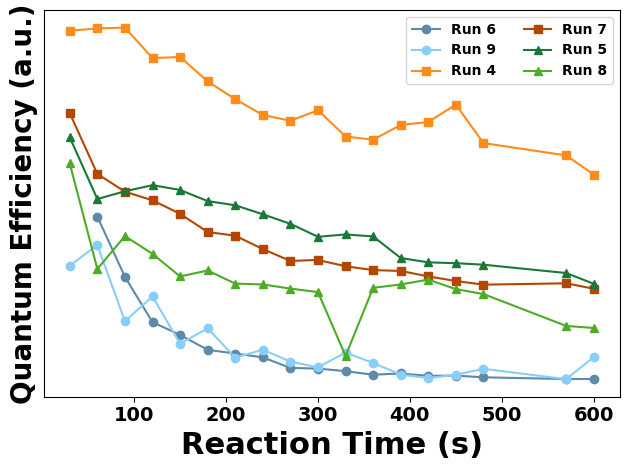

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
Abs_run6_460_array = np.array([0.121045597,	0.181554377,	0.254997939,	0.354474336,	0.386927068,	0.450253964,	0.459058255,	0.469525933,	0.587813914,	0.590570808,	0.635005832,	0.714040756,	0.669124961,	0.744414926,	0.725579083,	0.808954537,	0.875866354,	0.879822612])
Abs_run9_460_array = np.array([0.311589152,	0.191119641,	0.364205122,	0.247503161,	0.411816716,	0.325027674,	0.486515075,	0.420488715,	0.525983989,	0.586888194,	0.436601758,	0.514585495,	0.743815899,	0.90084666,	0.745720863,	0.598532677,	0.943496347,	0.436792791])
Abs_run4_440_array = np.array([0.003899156,	0.008717366,	0.013587602,	0.00764575,	0.016390191,	0.033110339,	0.028437292,	0.025629995,	0.036517106,	0.026574919,	0.046293415,	0.045834303,	0.037265003,	0.034437064,	0.018281119,	0.04171025,	0.0389833,	0.049258299])
Abs_run7_440_array = np.array([0.063165843,	0.114153817,	0.118314318,	0.111008354,	0.125845239,	0.131333098,	0.147433117,	0.162241295,	0.188193113,	0.170190111,	0.210184619,	0.193842247,	0.194729701,	0.197578475,	0.22260949,	0.234088153,	0.230527371,	0.241148084])
Abs_run5_420_array = np.array([0.015109026, 0.022422886, 0.027280182, 0.052726015, 0.055472799, 0.093952112, 0.099223502, 0.118634947, 0.131004185, 0.12649554, 0.136774406, 0.104174919, 0.174387097, 0.172347888, 0.178667635, 0.175003618, 0.184831202, 0.206023723])
Abs_run8_420_array = np.array([0.086941823,	0.152879074,	0.176416829,	0.191261634,	0.239308283,0.206893608,	0.228128284,	0.238758668,	0.246308133,	0.251212657,	0.250185669,	0.242017835,	0.221794814,	0.198463798,	0.21286647,	0.212738439,	0.273571044,	0.267535329])

Exi_run6_peak_array = np.array([np.nan, 111.5, 83.89, 60, 50.81, 40.17, 36.23, 32.15, 24.01, 23.07, 20.54, 16.5, 17.51, 14.94, 14.81, 13.12, 9.579, 9.878])    
Exi_run9_peak_array = np.array([ 105.7, 94.42, 62.29, 67.09, 43.74, 50.26, 33.09, 37.61, 30.24, 24.97, 35.6, 27.46, 18.16, 13.18, 17.82, 23.01, 10.76, 30.22])
Exi_run4_peak_array = np.array([ 157.3, 160.1 , 162.3, 146.3, 149.8, 144, 134, 125.7, 126.1, 128.2, 121.2, 119.5, 124.3, 124.9, 128.4, 116.7, 110, 103.1]) 
Exi_run7_peak_array = np.array([   138 ,120.1,110.9 ,104.1,99.71,90.02,91.14,85.68,82.84,80.12,83.29,77.56,77.13,73.81,74.78,74.02,74.42,72.08 ])
Exi_run5_peak_array = np.array([112.4, 85.5, 90.12, 98.61, 96.82, 99.66, 98.54, 97.8, 94.89, 86.2, 89.69, 82.09, 82.16, 78.92, 79.53, 77.86, 73.97, 69.97    ])
Exi_run8_peak_array = np.array([ 118.5, 71.29, 97.18, 88.33, 81.23, 79.65, 73.77, 74.98, 73.03, 71.1, 20.46, 72.93, 72.1, 71.72, 67.22, 63.66, 46.64, 44.33  ])

Quantum_efficiency_run6_array = Exi_run6_peak_array/10**Abs_run6_460_array
Quantum_efficiency_run9_array = Exi_run9_peak_array/10**Abs_run9_460_array
Quantum_efficiency_run4_array = Exi_run4_peak_array/10**Abs_run4_440_array
Quantum_efficiency_run7_array = Exi_run7_peak_array/10**Abs_run7_440_array
Quantum_efficiency_run5_array = Exi_run5_peak_array/10**Abs_run5_420_array
Quantum_efficiency_run8_array = Exi_run8_peak_array/10**Abs_run8_420_array

plt.plot(reaction_time, Quantum_efficiency_run6_array,'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, Quantum_efficiency_run9_array,'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, Quantum_efficiency_run4_array,'s-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, Quantum_efficiency_run7_array,'s-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, Quantum_efficiency_run5_array,'^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, Quantum_efficiency_run8_array,'^-', label = 'Run 8', color = '#4DAC26')
plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Quantum Efficiency (a.u.)", fontsize=20, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks([])
ax.yaxis.set_major_locator(MultipleLocator(10))
plt.legend(ncol=2,prop={'size': 10, 'weight': 'bold'}, loc = 'upper right')
plt.tight_layout()
plt.savefig("Quantum Efficiency.png", dpi = 1200)
plt.show()

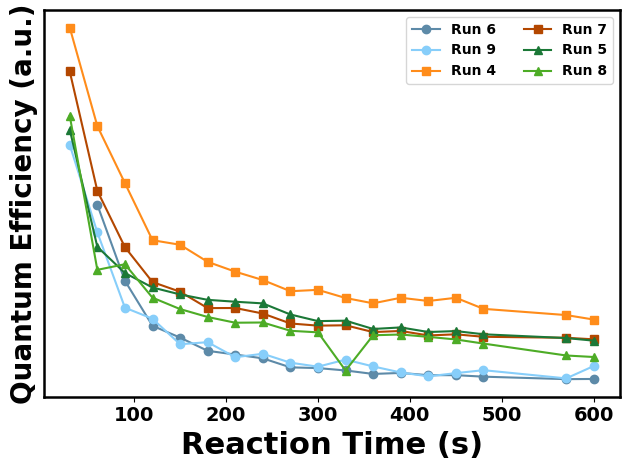

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])
Abs_run6_460_array = np.array([0.121045597,	0.181554377,	0.254997939,	0.354474336,	0.386927068,	0.450253964,	0.459058255,	0.469525933,	0.587813914,	0.590570808,	0.635005832,	0.714040756,	0.669124961,	0.744414926,	0.725579083,	0.808954537,	0.875866354,	0.879822612])
Abs_run9_460_array = np.array([0.311589152,	0.191119641,	0.364205122,	0.247503161,	0.411816716,	0.325027674,	0.486515075,	0.420488715,	0.525983989,	0.586888194,	0.436601758,	0.514585495,	0.743815899,	0.90084666,	0.745720863,	0.598532677,	0.943496347,	0.436792791])
Abs_run4_440_array = np.array([0.003899156,	0.008717366,	0.013587602,	0.00764575,	0.016390191,	0.033110339,	0.028437292,	0.025629995,	0.036517106,	0.026574919,	0.046293415,	0.045834303,	0.037265003,	0.034437064,	0.018281119,	0.04171025,	0.0389833,	0.049258299])
Abs_run7_440_array = np.array([0.063165843,	0.114153817,	0.118314318,	0.111008354,	0.125845239,	0.131333098,	0.147433117,	0.162241295,	0.188193113,	0.170190111,	0.210184619,	0.193842247,	0.194729701,	0.197578475,	0.22260949,	0.234088153,	0.230527371,	0.241148084])
Abs_run5_420_array = np.array([0.015109026, 0.022422886, 0.027280182, 0.052726015, 0.055472799, 0.093952112, 0.099223502, 0.118634947, 0.131004185, 0.12649554, 0.136774406, 0.104174919, 0.174387097, 0.172347888, 0.178667635, 0.175003618, 0.184831202, 0.206023723])
Abs_run8_420_array = np.array([0.086941823,	0.152879074,	0.176416829,	0.191261634,	0.239308283,0.206893608,	0.228128284,	0.238758668,	0.246308133,	0.251212657,	0.250185669,	0.242017835,	0.221794814,	0.198463798,	0.21286647,	0.212738439,	0.273571044,	0.267535329])

Exi_run6_peak_array = np.array([np.nan, 111.5, 83.89, 60, 50.81, 40.17, 36.23, 32.15, 24.01, 23.07, 20.54, 16.5, 17.51, 14.94, 14.81, 13.12, 9.579, 9.878])    
Exi_run9_peak_array = np.array([ 105.7, 94.42, 62.29, 67.09, 43.74, 50.26, 33.09, 37.61, 30.24, 24.97, 35.6, 27.46, 18.16, 13.18, 17.82, 23.01, 10.76, 30.22])
Exi_run4_peak_array = np.array([ 157.3, 160.1 , 162.3, 146.3, 149.8, 144, 134, 125.7, 126.1, 128.2, 121.2, 119.5, 124.3, 124.9, 128.4, 116.7, 110, 103.1]) 
Exi_run7_peak_array = np.array([   138 ,120.1,110.9 ,104.1,99.71,90.02,91.14,85.68,82.84,80.12,83.29,77.56,77.13,73.81,74.78,74.02,74.42,72.08 ])
Exi_run5_peak_array = np.array([112.4, 85.5, 90.12, 98.61, 96.82, 99.66, 98.54, 97.8, 94.89, 86.2, 89.69, 82.09, 82.16, 78.92, 79.53, 77.86, 73.97, 69.97    ])
Exi_run8_peak_array = np.array([ 118.5, 71.29, 97.18, 88.33, 81.23, 79.65, 73.77, 74.98, 73.03, 71.1, 20.46, 72.93, 72.1, 71.72, 67.22, 63.66, 46.64, 44.33  ])

Quantum_efficiency_run6_array = Exi_run6_peak_array/(1-10**-Abs_run6_460_array)
Quantum_efficiency_run9_array = Exi_run9_peak_array/(1-10**-Abs_run6_460_array)
Quantum_efficiency_run4_array = Exi_run4_peak_array/(1-10**-Abs_run6_460_array)
Quantum_efficiency_run7_array = Exi_run7_peak_array/(1-10**-Abs_run6_460_array)
Quantum_efficiency_run5_array = Exi_run5_peak_array/(1-10**-Abs_run6_460_array)
Quantum_efficiency_run8_array = Exi_run8_peak_array/(1-10**-Abs_run6_460_array)

plt.plot(reaction_time, Quantum_efficiency_run6_array,'o-', label = 'Run 6', color = '#5D8AA8')
plt.plot(reaction_time, Quantum_efficiency_run9_array,'o-', label = 'Run 9', color = '#87CEFA')
plt.plot(reaction_time, Quantum_efficiency_run4_array,'s-', label = 'Run 4', color = '#FF8C1A')
plt.plot(reaction_time, Quantum_efficiency_run7_array,'s-', label = 'Run 7', color = '#B34700')
plt.plot(reaction_time, Quantum_efficiency_run5_array,'^-', label = 'Run 5', color = '#1B7837')
plt.plot(reaction_time, Quantum_efficiency_run8_array,'^-', label = 'Run 8', color = '#4DAC26')
plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Quantum Efficiency (a.u.)", fontsize=20, fontweight="bold")
#plt.grid(True, alpha=0.4)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks([])
plt.legend(ncol=2,prop={'size': 10, 'weight': 'bold'}, loc = 'upper right')
plt.tight_layout()
plt.savefig("Quantum Efficiency_Corrected Abs.png", dpi = 1200)
plt.show()

## 14. Unnormalised Emission Peaks

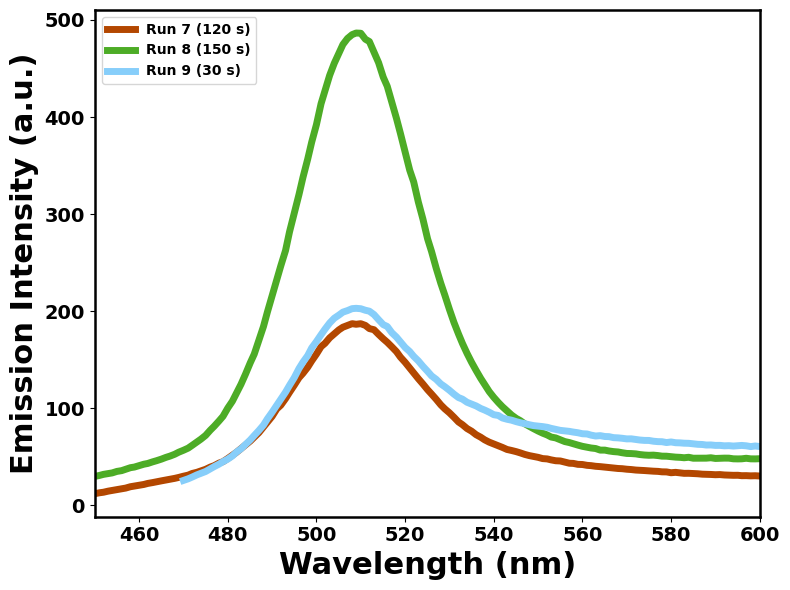

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

csv_path = 'Unnormalised Emission Peaks.csv'
df = pd.read_csv(csv_path)
wavelength = df.iloc[:,0]
run7 = df.iloc[:,1]
run8 = df.iloc[:,2]
run9 = df.iloc[:,3]


plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)
    
plt.plot(wavelength, run7, lw=5, label = 'Run 7 (120 s)', color = '#B34700')
plt.plot(wavelength, run8, lw=5, label = 'Run 8 (150 s)', color = '#4DAC26')
plt.plot(wavelength, run9, lw=5, label = 'Run 9 (30 s)', color = '#87CEFA')

plt.xlabel("Wavelength (nm)", fontsize=22, fontweight="bold")
plt.ylabel("Emission Intensity (a.u.)", fontsize=22, fontweight="bold")
#plt.grid(True, alpha=0.4)
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(prop={'size': 10, 'weight': 'bold'}, loc = 'upper left')
plt.xlim(450,600)
#plt.ylim(0,600)
plt.tight_layout()
plt.savefig("Unnormalised Emission Intensities_similar peak values.png", dpi = 1200)
plt.show()

## 15. Growing Mechanism Check

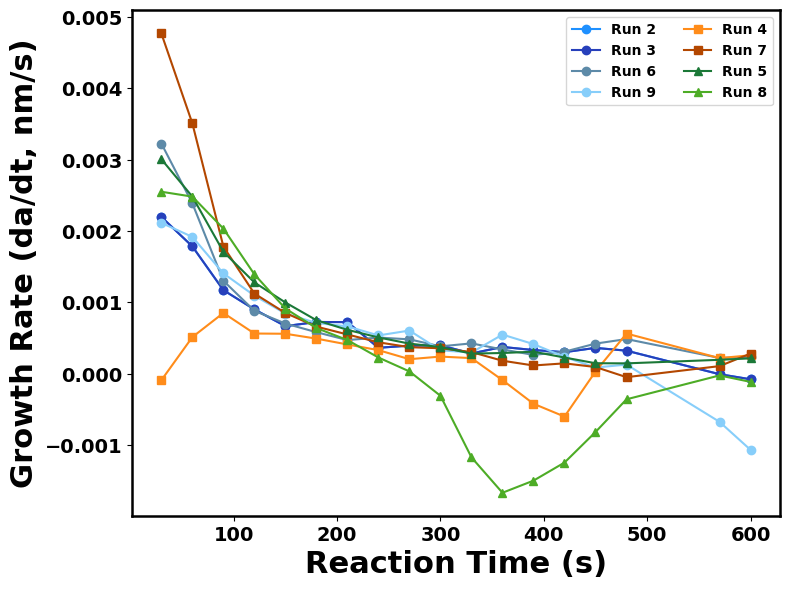

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# ==== Your data (copied directly from your provided code) ====
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

# ==== Compute numerical derivatives (da/dt) ====
def growth_rate(r, t):
    """Compute derivative da/dt using central difference"""
    return np.gradient(r, t)

dRdt_run2 = growth_rate(Radii_run2, reaction_time)
dRdt_run3 = growth_rate(Radii_run3, reaction_time)
dRdt_run4 = growth_rate(Radii_run4, reaction_time)
dRdt_run5 = growth_rate(Radii_run5, reaction_time)
dRdt_run6 = growth_rate(Radii_run6, reaction_time)
dRdt_run7 = growth_rate(Radii_run7, reaction_time)
dRdt_run8 = growth_rate(Radii_run8, reaction_time)
dRdt_run9 = growth_rate(Radii_run9, reaction_time)

# ==== Plot: Growth Rate (da/dt) vs Reaction Time ====
plt.figure(figsize=(8,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

plt.plot(reaction_time, dRdt_run2, 'o-', label='Run 2', color='#1E90FF')
plt.plot(reaction_time, dRdt_run3, 'o-', label='Run 3', color='#2740BB')
plt.plot(reaction_time, dRdt_run6, 'o-', label='Run 6', color='#5D8AA8')
plt.plot(reaction_time, dRdt_run9, 'o-', label='Run 9', color='#87CEFA')
plt.plot(reaction_time, dRdt_run4, 's-', label='Run 4', color='#FF8C1A')
plt.plot(reaction_time, dRdt_run7, 's-', label='Run 7', color='#B34700')
plt.plot(reaction_time, dRdt_run5, '^-', label='Run 5', color='#1B7837')
plt.plot(reaction_time, dRdt_run8, '^-', label='Run 8', color='#4DAC26')

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Growth Rate (da/dt, nm/s)", fontsize=22, fontweight="bold")
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
plt.savefig("Growth Rate vs Reaction Time.png", dpi=1200)
plt.show()

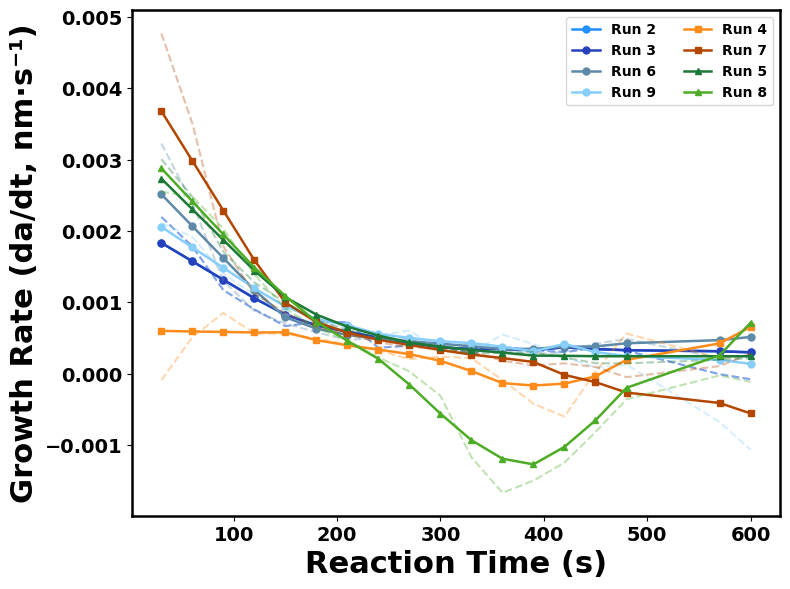

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# ==== your time & radii arrays here (unchanged) ====
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

Radii_run2 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run3 = np.array([2.1488, 2.2147, 2.2558, 2.2849, 2.3098, 2.3248, 2.3532, 2.3681, 2.3749, 2.3916, 2.3987, 2.4085, 2.4211, 2.4283, 2.4391, 2.4499, 2.4683, 2.4659])
Radii_run4 = np.array([1.9966, 1.9938, 2.0273, 2.0448, 2.061, 2.0783, 2.0904, 2.1028, 2.1101, 2.1149, 2.1244, 2.1279, 2.1189, 2.1025, 2.0827, 2.1042, 2.1128, 2.1205])
Radii_run5 = np.array([1.9185, 2.0087, 2.0674, 2.1112, 2.1441, 2.171, 2.189, 2.2078, 2.2194, 2.233, 2.2417, 2.2498, 2.259, 2.2682, 2.2725, 2.2769, 2.2888, 2.2952])
Radii_run6 = np.array([2.1022, 2.199, 2.2454, 2.2771, 2.2982, 2.3192, 2.333, 2.3474, 2.3633, 2.3762, 2.3862, 2.4016, 2.4065, 2.4173, 2.4249, 2.4425, 2.4583, 2.4653])
Radii_run7 = np.array([1.8763, 2.0194, 2.0868, 2.1263, 2.1541, 2.1773, 2.1936, 2.2102, 2.2199, 2.2324, 2.2412, 2.2505, 2.252, 2.2573, 2.2606, 2.2628, 2.2248, 2.2332])
Radii_run8 = np.array([1.8945, 1.971, 2.0434, 2.093, 2.1269, 2.1477, 2.1652, 2.1759, 2.1787, 2.1777, 2.16, 2.1072, 2.0597, 2.0171, 1.9848, 1.9679, 1.99, 1.9865])
Radii_run9 = np.array([2.1268, 2.1902, 2.2418, 2.2745, 2.3074, 2.325, 2.35, 2.3647, 2.3821, 2.4009, 2.4017, 2.4186, 2.4345, 2.4434, 2.4485, 2.4485, 2.4937, 2.4616])

# ==== helpers ====
def gradient_raw(r, t):
    return np.gradient(r, t)

def gradient_smoothed(r, t, sg_win=7, sg_poly=2, ma_win=5):
    """
    Prefer Savitzky–Golay derivative (if SciPy available); fallback to moving-average + gradient.
    sg_win must be odd and >= (sg_poly+2).
    """
    try:
        from scipy.signal import savgol_filter
        sg_win = max(sg_win | 1, sg_poly + 3)  # ensure odd, large enough
        # Direct derivative from Savitzky–Golay (deriv=1)
        dt = np.gradient(t)
        # savgol returns derivative w.r.t. sample index; scale by dt
        didx = savgol_filter(r, window_length=sg_win, polyorder=sg_poly, deriv=1, delta=1.0)
        # convert to dr/dt using local dt (median is fine if spacing mostly uniform)
        return didx / np.median(dt)
    except Exception:
        # Fallback: smooth then differentiate
        k = np.ones(ma_win) / ma_win
        r_s = np.convolve(r, k, mode="same")
        return np.gradient(r_s, t)

# ==== compute raw & smoothed derivatives ====
runs = {
    'Run 2' : (Radii_run2,  '#1E90FF', 'o'),
    'Run 3' : (Radii_run3,  '#2740BB', 'o'),
    'Run 6' : (Radii_run6,  '#5D8AA8', 'o'),
    'Run 9' : (Radii_run9,  '#87CEFA', 'o'),
    'Run 4' : (Radii_run4,  '#FF8C1A', 's'),
    'Run 7' : (Radii_run7,  '#B34700', 's'),
    'Run 5' : (Radii_run5,  '#1B7837', '^'),
    'Run 8' : (Radii_run8,  '#4DAC26', '^'),
}

plt.figure(figsize=(8,6))
ax = plt.gca()
for s in ax.spines.values():
    s.set_linewidth(1.8)

for name, (r, color, marker) in runs.items():
    drdt_raw = gradient_raw(r, reaction_time)
    drdt_s   = gradient_smoothed(r, reaction_time, sg_win=7, sg_poly=2, ma_win=5)

    # raw (faint)
    plt.plot(reaction_time, drdt_raw, linestyle='--', color=color, alpha=0.35)
    # smoothed (prominent)
    plt.plot(reaction_time, drdt_s, marker+ '-', color=color, label=name, linewidth=1.8, markersize=5)

plt.xlabel("Reaction Time (s)", fontsize=22, fontweight="bold")
plt.ylabel("Growth Rate (da/dt, nm·s⁻¹)", fontsize=22, fontweight="bold")
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper right')
plt.tight_layout()
#plt.savefig("Growth Rate vs Reaction Time (Smoothed).png", dpi=1200)
plt.show()


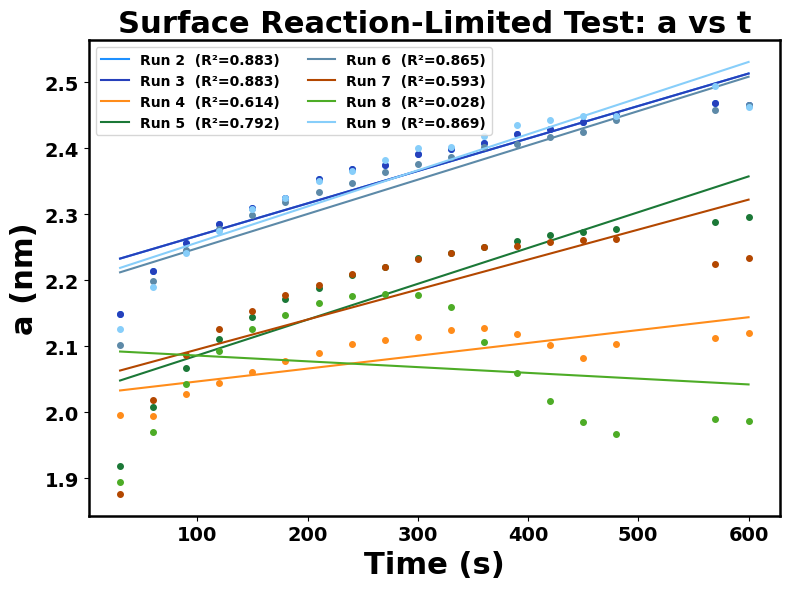

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# ---- your existing arrays ----
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

runs = {
    'Run 2' : Radii_run2,
    'Run 3' : Radii_run3,
    'Run 4' : Radii_run4,
    'Run 5' : Radii_run5,
    'Run 6' : Radii_run6,
    'Run 7' : Radii_run7,
    'Run 8' : Radii_run8,
    'Run 9' : Radii_run9,
}

colors = ['#1E90FF','#2740BB','#FF8C1A','#1B7837','#5D8AA8','#B34700','#4DAC26','#87CEFA']

# -------- helper to fit and return R2 --------
def linear_fit_and_r2(x, y):
    slope, intercept, r_value, p, stderr = linregress(x, y)
    r2 = r_value**2
    yfit = slope*x + intercept
    return r2, yfit

# =============================
#  FIGURE 1 — Reaction-limited: r vs t
# =============================
plt.figure(figsize=(8,6))
ax = plt.gca()
for s in ax.spines.values():
    s.set_linewidth(1.8)
for (label, r), color in zip(runs.items(), colors):
    r2, yfit = linear_fit_and_r2(reaction_time, r)
    plt.plot(reaction_time, r, 'o', color=color, ms=4)
    plt.plot(reaction_time, yfit, '-', color=color, label=f"{label}  (R²={r2:.3f})")

plt.xlabel("Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("a (nm)", fontsize=22, fontweight='bold')
plt.title("Surface Reaction-Limited Test: a vs t", fontsize=22, fontweight='bold')
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper left')
plt.tight_layout()
plt.savefig('Growing Mechanism Test_Surface.png', dpi=1200)
plt.show()

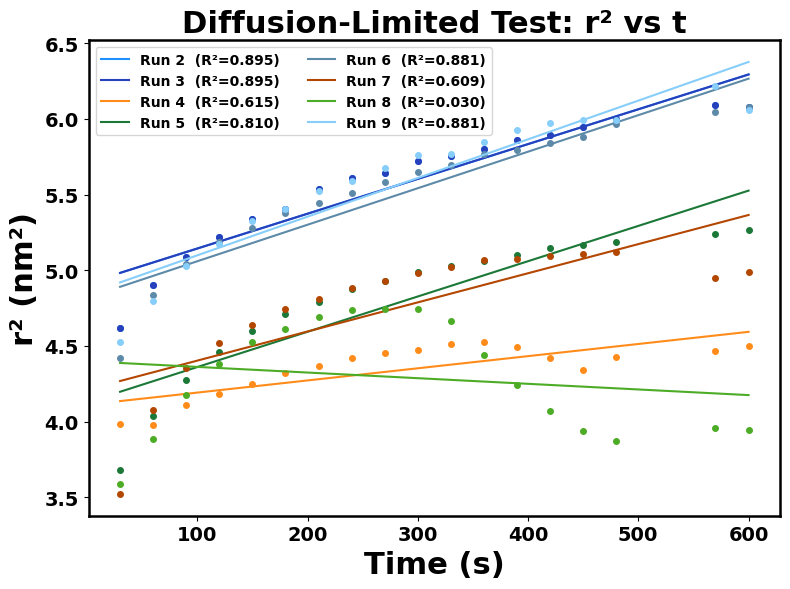

In [44]:
# =============================
#  FIGURE 2 — Diffusion-limited: r² vs t
# =============================
plt.figure(figsize=(8,6))
ax = plt.gca()
for s in ax.spines.values():
    s.set_linewidth(1.8)
for (label, r), color in zip(runs.items(), colors):
    y = r**2
    r2, yfit = linear_fit_and_r2(reaction_time, y)
    plt.plot(reaction_time, y, 'o', color=color, ms=4)
    plt.plot(reaction_time, yfit, '-', color=color, label=f"{label}  (R²={r2:.3f})")

plt.xlabel("Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("r² (nm²)", fontsize=22, fontweight='bold')
plt.title("Diffusion-Limited Test: r² vs t", fontsize=22, fontweight='bold')
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper left')
plt.tight_layout()
plt.savefig('Growing Mechanism Test_Diffusion.png', dpi=1200)
plt.show()

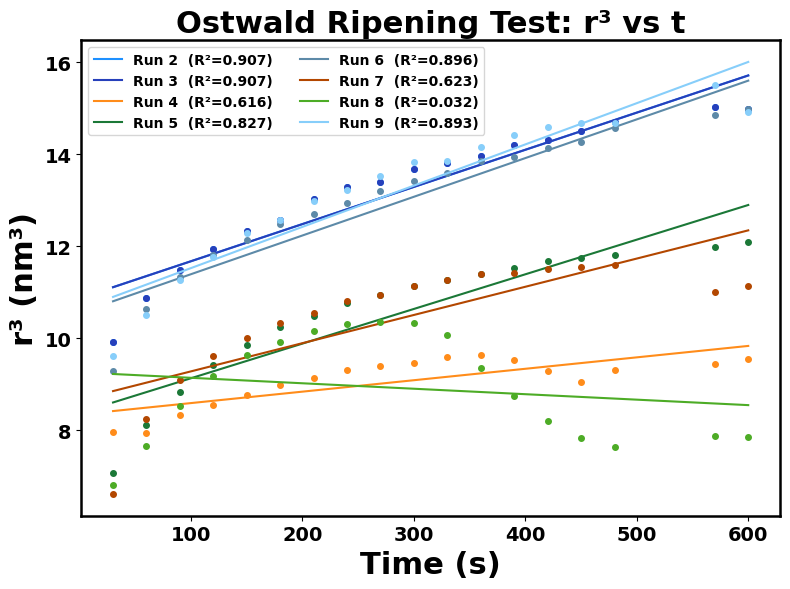

In [46]:
# =============================
#  FIGURE 3 — Ripening: r³ vs t
# =============================
plt.figure(figsize=(8,6))
ax = plt.gca()
for s in ax.spines.values():
    s.set_linewidth(1.8)
for (label, r), color in zip(runs.items(), colors):
    y = r**3
    r2, yfit = linear_fit_and_r2(reaction_time, y)
    plt.plot(reaction_time, y, 'o', color=color, ms=4)
    plt.plot(reaction_time, yfit, '-', color=color, label=f"{label}  (R²={r2:.3f})")

plt.xlabel("Time (s)", fontsize=22, fontweight='bold')
plt.ylabel("r³ (nm³)", fontsize=22, fontweight='bold')
plt.title("Ostwald Ripening Test: r³ vs t", fontsize=22, fontweight='bold')
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14, fontweight="bold")
plt.legend(ncol=2, prop={'size': 10, 'weight': 'bold'}, loc='upper left')
plt.tight_layout()
plt.savefig('Growing Mechanism Test_Ostwald Ripening.png', dpi=1200)
plt.show()

Run    R²_reaction   R²_diffusion   R²_ripening
Run 2       0.88303        0.89527      0.90681
Run 3       0.88303        0.89527      0.90681
Run 4       0.61383        0.61488      0.61581
Run 5       0.79150        0.80982      0.82727
Run 6       0.86452        0.88076      0.89593
Run 7       0.59303        0.60873      0.62349
Run 8       0.02764        0.02962      0.03152
Run 9       0.86858        0.88138      0.89334


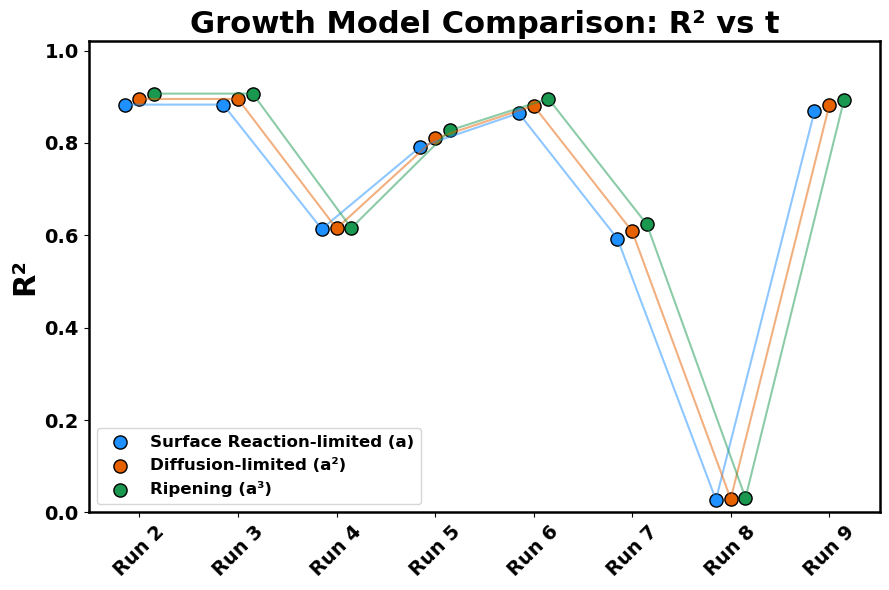

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# -------- your data --------
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

runs = {
    'Run 2': Radii_run2,
    'Run 3': Radii_run3,
    'Run 4': Radii_run4,
    'Run 5': Radii_run5,
    'Run 6': Radii_run6,
    'Run 7': Radii_run7,
    'Run 8': Radii_run8,
    'Run 9': Radii_run9,
}

run_labels = list(runs.keys())
x_positions = np.arange(len(run_labels))

# colours for the three models
c_reaction = '#1E90FF'   # blue
c_diffusion = '#E66100'  # orange
c_ripening = '#1A9850'   # green

# small x-offsets so points don't overlap
dx_reaction = -0.15
dx_diffusion = 0.0
dx_ripening = 0.15

def r2_value(x, y):
    """Return R^2 of linear fit y = m x + c."""
    slope, intercept, r_value, p, stderr = linregress(x, y)
    return r_value**2

# ---- compute R^2 for each model & run ----
R2 = {
    "reaction": [],
    "diffusion": [],
    "ripening": []
}

for label in run_labels:
    r = np.asarray(runs[label], float)

    # reaction-limited: r ~ t
    R2["reaction"].append(r2_value(reaction_time, r))

    # diffusion-limited: r^2 ~ t
    R2["diffusion"].append(r2_value(reaction_time, r**2))

    # ripening: r^3 ~ t
    R2["ripening"].append(r2_value(reaction_time, r**3))

# ---- (optional) print a table to see the numbers ----
print("Run    R²_reaction   R²_diffusion   R²_ripening")
for i, label in enumerate(run_labels):
    print(f"{label:6s}  {R2['reaction'][i]:11.5f}  {R2['diffusion'][i]:13.5f}  {R2['ripening'][i]:11.5f}")

# ---- scatter plot of R^2 vs run, for all models ----
plt.figure(figsize=(9,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# reaction-limited
plt.scatter(x_positions + dx_reaction,
            R2["reaction"],
            s=90, color=c_reaction, edgecolor='k',
            label='Surface Reaction-limited (a)')

# diffusion-limited
plt.scatter(x_positions + dx_diffusion,
            R2["diffusion"],
            s=90, color=c_diffusion, edgecolor='k',
            label='Diffusion-limited (a²)')

# ripening
plt.scatter(x_positions + dx_ripening,
            R2["ripening"],
            s=90, color=c_ripening, edgecolor='k',
            label='Ripening (a³)')

# optional connecting lines for each model
plt.plot(x_positions + dx_reaction, R2["reaction"], color=c_reaction, alpha=0.5)
plt.plot(x_positions + dx_diffusion, R2["diffusion"], color=c_diffusion, alpha=0.5)
plt.plot(x_positions + dx_ripening, R2["ripening"], color=c_ripening, alpha=0.5)

plt.xticks(x_positions, run_labels, rotation=45, fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.ylabel("R²", fontsize=22, fontweight='bold')
#plt.xlabel("Run", fontsize=20, fontweight='bold')
plt.title("Growth Model Comparison: R² vs t", fontsize=22, fontweight='bold')
plt.ylim(0, 1.02)
#plt.grid(alpha=0.3)
plt.legend(prop={'size': 12, 'weight': 'bold'})
plt.tight_layout()
plt.savefig("R2_vs_Run_GrowthModels_fixed.png", dpi=1200)
plt.show()


Run    R²_reaction   R²_diffusion   R²_ripening
Run 2       0.88303        0.89527 
Run 3       0.88303        0.89527 
Run 4       0.61383        0.61488 
Run 5       0.79150        0.80982 
Run 6       0.86452        0.88076 
Run 7       0.59303        0.60873 
Run 8       0.02764        0.02962 
Run 9       0.86858        0.88138 


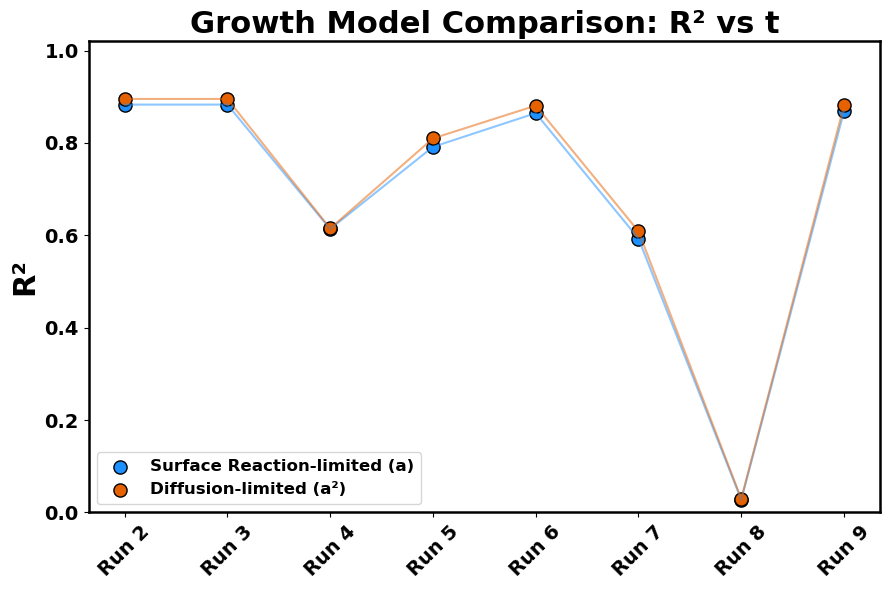

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# -------- your data --------
reaction_time = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 570, 600])

runs = {
    'Run 2': Radii_run2,
    'Run 3': Radii_run3,
    'Run 4': Radii_run4,
    'Run 5': Radii_run5,
    'Run 6': Radii_run6,
    'Run 7': Radii_run7,
    'Run 8': Radii_run8,
    'Run 9': Radii_run9,
}

run_labels = list(runs.keys())
x_positions = np.arange(len(run_labels))

# colours for the three models
c_reaction = '#1E90FF'   # blue
c_diffusion = '#E66100'  # orange
c_ripening = '#1A9850'   # green

# small x-offsets so points don't overlap
dx_reaction = -0.15
dx_diffusion = 0.0
dx_ripening = 0.15

def r2_value(x, y):
    """Return R^2 of linear fit y = m x + c."""
    slope, intercept, r_value, p, stderr = linregress(x, y)
    return r_value**2

# ---- compute R^2 for each model & run ----
R2 = {
    "reaction": [],
    "diffusion": [],
}

for label in run_labels:
    r = np.asarray(runs[label], float)

    # reaction-limited: r ~ t
    R2["reaction"].append(r2_value(reaction_time, r))

    # diffusion-limited: r^2 ~ t
    R2["diffusion"].append(r2_value(reaction_time, r**2))


# ---- (optional) print a table to see the numbers ----
print("Run    R²_reaction   R²_diffusion   R²_ripening")
for i, label in enumerate(run_labels):
    print(f"{label:6s}  {R2['reaction'][i]:11.5f}  {R2['diffusion'][i]:13.5f} ")

# ---- scatter plot of R^2 vs run, for all models ----
plt.figure(figsize=(9,6))
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.8)

# reaction-limited
plt.scatter(x_positions ,
            R2["reaction"],
            s=90, color=c_reaction, edgecolor='k',
            label='Surface Reaction-limited (a)')

# diffusion-limited
plt.scatter(x_positions ,
            R2["diffusion"],
            s=90, color=c_diffusion, edgecolor='k',
            label='Diffusion-limited (a²)')


# optional connecting lines for each model
plt.plot(x_positions , R2["reaction"], color=c_reaction, alpha=0.5)
plt.plot(x_positions , R2["diffusion"], color=c_diffusion, alpha=0.5)

plt.xticks(x_positions, run_labels, rotation=45, fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.ylabel("R²", fontsize=22, fontweight='bold')
#plt.xlabel("Run", fontsize=20, fontweight='bold')
plt.title("Growth Model Comparison: R² vs t", fontsize=22, fontweight='bold')
plt.ylim(0, 1.02)
#plt.grid(alpha=0.3)
plt.legend(prop={'size': 12, 'weight': 'bold'}, loc='lower left')
plt.tight_layout()
plt.savefig("R2_vs_Run_GrowthModels_fixed_OstwaldRipeningExcluded.png", dpi=1200)
plt.show()
